In [2]:
import psycopg2
import pandas as pd
from pandas import DataFrame
from pandas import concat
from pandas import Series

import matplotlib.pyplot as plt
import geopandas as gpd
import numpy as np
import itertools

import numpy
from numpy import concatenate
from numpy import array

import seaborn as sns

import math
from math import sqrt

# ARIMA AND LSTM STUFF
from statsmodels.tsa.arima_model import ARIMA
from statsmodels.tools.eval_measures import rmse

from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import mean_squared_error
from sklearn.metrics import r2_score
from keras.preprocessing.sequence import TimeseriesGenerator
from keras.models import Sequential
from keras.layers import Dense
from keras.layers import LSTM
from keras.layers import Dropout

import time
import statsmodels.api as sm
import warnings

Using TensorFlow backend.


In [3]:
connection = psycopg2.connect(user = "equipo7",
                            password = "DLgndXy2m4hbWH-qn-Co",
                            host= "ds4a-demo-instance.cssn41frspmj.us-east-1.rds.amazonaws.com",
                            port = "5432",
                            database = "anahuac")
cursor = connection.cursor()
def runquery(query):
    df=pd.read_sql(query,connection)
    return df


def pivot_by_factor(df, index_table, column_table, value_table):
    df = pd.pivot_table(df, index = index_table, columns = column_table, values = value_table)
    df = df.sort_index(axis=1, level=1)
    df.columns = [f'{b}_{a}' for a, b in df.columns]
    df = df.reset_index()
    return df


In [4]:
where_date_clause = " WHERE date >= '2012-01-01' AND date <= '2020-03-01 00:00:00' ORDER BY date"; 

sqlQuery_workspace = "select * from final_table.metrics_compact " + where_date_clause
df_workspace = pd.DataFrame(runquery(sqlQuery_workspace))

In [5]:
pd.options.display.max_columns = 999
df_workspace.describe()

,weekday,hora,co_st0,co_st1,co_st2,no_st0,no_st1,no_st2,no2_st0,no2_st1,no2_st2,nox_st0,nox_st1,nox_st2,o3_st0,o3_st1,o3_st2,pm10_st0,pm10_st1,pm10_st2,pm25_st0,pm25_st1,pm25_st2,pmco_st0,pmco_st1,pmco_st2,so2_st0,so2_st1,so2_st2,rh_st0,rh_st1,rh_st2,tmp_st0,tmp_st1,tmp_st2,wdr_st0,wdr_st1,wdr_st2,wsp_st0,wsp_st1,wsp_st2,pa_st0,pa_st1,pa_st2,uva_st0,uva_st1,uva_st2,uvb_st0,uvb_st1,uvb_st2,dewp_st0,dewp_st1,dewp_st2
count,70128.000000,70128.000000,70128.000000,70128.000000,70128.000000,70128.000000,70128.000000,70128.000000,70128.000000,70128.000000,70128.000000,70128.000000,70128.000000,70128.000000,70128.000000,70128.000000,70128.000000,70128.000000,70128.000000,70128.000000,70128.000000,70128.000000,70128.000000,70128.000000,70128.000000,70128.000000,70128.000000,70128.000000,70128.000000,70128.000000,70128.000000,70128.000000,70128.000000,70128.000000,70128.000000,70128.000000,70128.000000,70128.000000,70128.000000,70128.000000,70128.000000,70128.000000,70128.000000,70128.000000,70128.000000,70128.000000,70128.000000,70128.000000,70128.000000,70128.000000,70128.000000,70128.000000,70128.000000
mean,2.999316,11.500000,2.189947,2.210903,2.088003,17.990526,20.170969,16.698585,21.158027,24.028990,26.348126,37.483421,42.663470,41.557862,26.213775,24.506166,26.603563,42.310384,41.723393,37.420983,21.546579,20.463479,21.412710,24.246273,18.653905,18.697495,4.672738,6.849628,5.262716,49.281891,47.592789,45.039993,16.136548,15.674618,16.241439,145.878639,178.018303,153.797046,3.423073,3.611687,3.708267,584.707378,584.707378,584.707378,1.136723,1.136723,1.136723,0.794370,0.794370,0.794370,6.767234,6.767234,6.767234
std,2.000870,6.922236,1.127032,1.102049,0.962972,24.493448,27.058126,21.252493,8.859545,10.739955,11.035121,29.783228,33.627266,27.962316,21.865061,21.787450,24.924690,22.834273,23.109314,18.665391,11.766278,9.884343,11.239555,15.106721,9.714197,10.328009,4.701210,8.275470,5.748877,17.257376,17.573724,16.355146,4.594687,4.765344,4.293768,52.596767,63.474064,66.799791,1.705201,1.795941,1.794148,1.534283,1.534283,1.534283,1.593015,1.593015,1.593015,1.260660,1.260660,1.260660,4.165433,4.165433,4.165433
min,0.000000,0.000000,0.014286,0.014286,0.012500,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,1.000000,1.000000,0.500000,0.455464,0.250000,1.500000,0.000000,0.000000,0.500000,0.000000,0.875000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,5.444440,4.833330,5.333330,1.800000,1.966670,2.875000,5.250000,4.500000,5.750000,0.275000,0.300000,0.300000,577.000000,577.000000,577.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,-10.815000,-10.815000,-10.815000
25%,1.000000,5.750000,1.440000,1.450000,1.400000,4.888890,5.625000,4.514065,14.500000,16.333300,18.625000,18.142900,21.125000,22.400800,8.000000,7.000000,6.750000,26.000000,25.333300,24.000000,13.500000,13.666700,13.571400,15.000000,12.000000,11.600000,2.625000,3.000000,2.750000,35.800000,33.428600,32.166700,12.713100,11.933300,12.925000,110.000000,134.140500,102.400000,1.866670,1.933330,2.080000,583.750000,583.750000,583.750000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,4.259927,4.259927,4.259927
50%,3.000000,11.500000,2.128570,2.225000,2.137500,8.200000,9.400000,8.000000,20.125000,22.142900,24.777800,27.888900,31.750000,33.555600,19.555600,17.250000,17.400000,38.166700,37.000000,34.400000,19.400000,19.000000,19.400000,21.000000,17.000000,16.800000,3.555560,4.125000,3.714290,51.111100,49.142900,45.666700,16.338750,16.066700,16.500000,140.000000,185.528500,146.200000,3.300000,3.633330,3.571430,584.750000,584.750000,584.750000,0.062775,0.062775,0.062775,0.011134,0.011134,0.011134,6.998940,6.998940,6.998940
75%,5.000000,17.250000,2.875000,2.937500,2.750000,19.750000,22.375000,19.888900,26.444400,29.625000,32.375000,46.000000,51.714300,52.000000,40.363600,36.888900,40.375000,54.000000,52.666700,47.600000,27.000000,25.500000,27.000000,30.000000,23.333300,23.800000,4.888890,7.000000,5.250000,63.666700,62.714300,58.333300,19.600000,19.3119

In [6]:
df_workspace.columns

Index(['date', 'fecha', 'weekday', 'hora', 'co_st0', 'co_st1', 'co_st2',
       'no_st0', 'no_st1', 'no_st2', 'no2_st0', 'no2_st1', 'no2_st2',
       'nox_st0', 'nox_st1', 'nox_st2', 'o3_st0', 'o3_st1', 'o3_st2',
       'pm10_st0', 'pm10_st1', 'pm10_st2', 'pm25_st0', 'pm25_st1', 'pm25_st2',
       'pmco_st0', 'pmco_st1', 'pmco_st2', 'so2_st0', 'so2_st1', 'so2_st2',
       'rh_st0', 'rh_st1', 'rh_st2', 'tmp_st0', 'tmp_st1', 'tmp_st2',
       'wdr_st0', 'wdr_st1', 'wdr_st2', 'wsp_st0', 'wsp_st1', 'wsp_st2',
       'pa_st0', 'pa_st1', 'pa_st2', 'uva_st0', 'uva_st1', 'uva_st2',
       'uvb_st0', 'uvb_st1', 'uvb_st2', 'dewp_st0', 'dewp_st1', 'dewp_st2'],
      dtype='object')

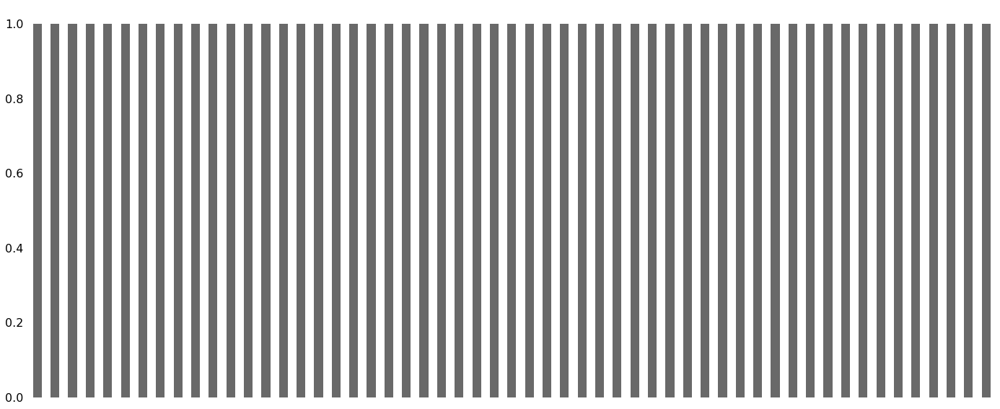

In [7]:
import missingno as msno 
#msno.matrix(df_workspace)  
msno.bar(df_workspace) 

In [8]:
# set date as index
df_workspace.set_index('date', inplace=True)

In [9]:
train      = df_workspace['2012-01-01':'2018-12-31']
test       = df_workspace['2019-09-01':'2019-12-31']

In [10]:
train['co_st0'].mean()

2.2289473361132424

In [11]:
dif = test['co_st0'] - train['co_st0'].mean()
dif

date
2019-09-01 00:00:00   -2.128947
2019-09-01 01:00:00   -1.795614
2019-09-01 02:00:00   -1.462280
2019-09-01 03:00:00   -1.128947
2019-09-01 04:00:00   -0.762277
                         ...   
2019-12-31 19:00:00    0.758553
2019-12-31 20:00:00    0.821053
2019-12-31 21:00:00    0.946053
2019-12-31 22:00:00    1.258553
2019-12-31 23:00:00    1.446053
Name: co_st0, Length: 2928, dtype: float64

In [12]:
#from statsmodels.tools.eval_measures import rmse
#mse = rmse.mean_squared_error(test['co_st0'], [train['co_st0'].mean() for i in test['co_st0']] ) 
#mse

In [13]:
features = ['co_st0', 'co_st1', 'co_st2',
       'no_st0', 'no_st1', 'no_st2', 'no2_st0', 'no2_st1', 'no2_st2',
       'nox_st0', 'nox_st1', 'nox_st2', 'o3_st0', 'o3_st1', 'o3_st2',
       'pm10_st0', 'pm10_st1', 'pm10_st2', 'pm25_st0', 'pm25_st1', 'pm25_st2',
       'pmco_st0', 'pmco_st1', 'pmco_st2', 'so2_st0', 'so2_st1', 'so2_st2',
       'rh_st0', 'rh_st1', 'rh_st2', 'tmp_st0', 'tmp_st1', 'tmp_st2',
       'wdr_st0', 'wdr_st1', 'wdr_st2', 'wsp_st0', 'wsp_st1', 'wsp_st2',
       'pa_st0', 'pa_st1', 'pa_st2', 'uva_st0', 'uva_st1', 'uva_st2',
       'uvb_st0', 'uvb_st1', 'uvb_st2', 'dewp_st0', 'dewp_st1', 'dewp_st2']
for feature in features:
    num = sum(( np.array([train[feature].mean() for i in test[feature]]) - test[feature].mean()  ) **2)
    dem = sum ((test[feature] - test[feature].mean())**2) 
    result = 1 - (num/dem)
    print(feature, result)

co_st0 0.9940411084250542
co_st1 0.9346994921451011
co_st2 0.9569334168449466
no_st0 0.9852789110723311
no_st1 0.9602723264584657
no_st2 0.9263072687490896
no2_st0 0.9723211440394599
no2_st1 0.8164786455327668
no2_st2 0.8800344400013854
nox_st0 0.9695918982075414
nox_st1 0.9000586483212899
nox_st2 0.8641094098623471
o3_st0 0.9663764256024717
o3_st1 0.944082227805272
o3_st2 0.9705341968330016
pm10_st0 0.8965040810269259
pm10_st1 0.851945848520773
pm10_st2 0.8506372015780016
pm25_st0 0.9437176275179991
pm25_st1 0.9187790431508704
pm25_st2 0.8691398481412342
pmco_st0 0.8822798746598235
pmco_st1 0.97931037628232
pmco_st2 0.7976404509083319
so2_st0 0.8564691307958594
so2_st1 0.957588001724337
so2_st2 0.9566581574742562
rh_st0 0.8972363199324666
rh_st1 0.915384783320739
rh_st2 0.9322629899411338
tmp_st0 0.9998294066431143
tmp_st1 0.9899574564947584
tmp_st2 0.9929712336062821
wdr_st0 0.9826780925341355
wdr_st1 0.9325238144794621
wdr_st2 0.9788448650280112
wsp_st0 0.9066241581634678
wsp_st1 0.

In [14]:
arr = np.array([train['co_st0'].mean() for i in test[feature]]) 
arr

array([2.22894734, 2.22894734, 2.22894734, ..., 2.22894734, 2.22894734,
       2.22894734])

In [15]:
from statsmodels.tools.eval_measures import rmse
#mse = mean_squared_error(test['co_st0'], [train['co_st0'].mean() for i in test['co_st0']] ) 
from sklearn.metrics import r2_score
features = ['co_st0', 'co_st1', 'co_st2',
       'no_st0', 'no_st1', 'no_st2', 'no2_st0', 'no2_st1', 'no2_st2',
       'nox_st0', 'nox_st1', 'nox_st2', 'o3_st0', 'o3_st1', 'o3_st2',
       'pm10_st0', 'pm10_st1', 'pm10_st2', 'pm25_st0', 'pm25_st1', 'pm25_st2',
       'pmco_st0', 'pmco_st1', 'pmco_st2', 'so2_st0', 'so2_st1', 'so2_st2',
       'rh_st0', 'rh_st1', 'rh_st2', 'tmp_st0', 'tmp_st1', 'tmp_st2',
       'wdr_st0', 'wdr_st1', 'wdr_st2', 'wsp_st0', 'wsp_st1', 'wsp_st2',
       'pa_st0', 'pa_st1', 'pa_st2', 'uva_st0', 'uva_st1', 'uva_st2',
       'uvb_st0', 'uvb_st1', 'uvb_st2', 'dewp_st0', 'dewp_st1', 'dewp_st2']
for feature in features:
    #r2 = r2_score(   test[feature], np.array([train[feature].mean() * 5 for i in test[feature]])   )  
    rmse = (mean_squared_error( test[feature], np.array([train[feature].mean()  for i in test[feature]])   )) **0.5 
    print(feature, rmse )

co_st0 1.088539487048972
co_st1 1.0245674484762277
co_st2 0.9950090939266937
no_st0 21.879067822689592
no_st1 22.20132125106183
no_st2 16.065645300928114
no2_st0 9.18377449330039
no2_st1 10.378606991228626
no2_st2 10.69162857838242
nox_st0 27.386056061032097
nox_st1 28.66151262702971
nox_st2 23.155745590576984
o3_st0 19.603771252580394
o3_st1 18.523247150707665
o3_st2 21.598366113020617
pm10_st0 19.77307306671748
pm10_st1 21.14183340355262
pm10_st2 16.90478821371249
pm25_st0 11.023326882126547
pm25_st1 8.946445924995695
pm25_st2 9.948160428444753
pmco_st0 12.578747798926804
pmco_st1 9.382340600210267
pmco_st2 8.744309731295692
so2_st0 3.0594841396324175
so2_st1 6.04131502668379
so2_st2 3.928809298705154
rh_st0 15.232396734223935
rh_st1 16.28576781004855
rh_st2 13.919042540852876
tmp_st0 4.080085823248658
tmp_st1 4.373121558855397
tmp_st2 3.757465143015684
wdr_st0 55.821669510813564
wdr_st1 69.12895606152593
wdr_st2 70.8916258576245
wsp_st0 1.5244592321902706
wsp_st1 1.5133436497504733


# Multivariate LSTM

In [55]:
# convert series to supervised learning
def series_to_supervised(data, n_in=1, n_out=1, dropnan=True):
    n_vars = 1 if type(data) is list else data.shape[1]
    df = DataFrame(data)
    cols, names = list(), list()
    # input sequence (t-n, ... t-1)
    for i in range(n_in, 0, -1):
        cols.append(df.shift(i))
        names += [('var%d(t-%d)' % (j+1, i)) for j in range(n_vars)]
    # forecast sequence (t, t+1, ... t+n)
    for i in range(0, n_out):
        cols.append(df.shift(-i))
        if i == 0:
            names += [('var%d(t)' % (j+1)) for j in range(n_vars)]
        else:
            names += [('var%d(t+%d)' % (j+1, i)) for j in range(n_vars)]
    # put it all together
    agg = concat(cols, axis=1)
    agg.columns = names
    # drop rows with NaN values
    if dropnan:
        agg.dropna(inplace=True)
    return agg

 - Normalize features
 - Reframe features into a supervised learning problem
 - Define time lag  (t_input timesteps) and training, test datasets


In [56]:
df_workspace.head(55)

,fecha,weekday,hora,co_st0,co_st1,co_st2,no_st0,no_st1,no_st2,no2_st0,no2_st1,no2_st2,nox_st0,nox_st1,nox_st2,o3_st0,o3_st1,o3_st2,pm10_st0,pm10_st1,pm10_st2,pm25_st0,pm25_st1,pm25_st2,pmco_st0,pmco_st1,pmco_st2,so2_st0,so2_st1,so2_st2,rh_st0,rh_st1,rh_st2,tmp_st0,tmp_st1,tmp_st2,wdr_st0,wdr_st1,wdr_st2,wsp_st0,wsp_st1,wsp_st2,pa_st0,pa_st1,pa_st2,uva_st0,uva_st1,uva_st2,uvb_st0,uvb_st1,uvb_st2,dewp_st0,dewp_st1,dewp_st2
date,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2012-01-01 00:00:00,2012-01-01,6,0,1.380,1.157140,1.065850,25.3750,19.750000,28.687200,33.7500,37.25000,27.71950,59.1250,56.62500,57.96450,5.00,4.42857,5.28571,249.400,110.50000,88.33330,69.40000,58.00000,51.6,13.00000,15.33330,17.500,7.10,7.75000,5.66667,64.875,53.75,45.75,8.1000,7.000,7.750,116.3350,97.00,148.00,1.06,0.933333,1.150,587.0,587.0,587.0,0.00000,0.00000,0.00000,0.000000,0.000000,0.000000,-1.425000,-1.425000,-1.425000
2012-01-01 01:00:00,2012-01-01,6,1,1.580,1.571430,1.631690,24.7500,31.750000,43.374300,33.3750,35.75000,31.15330,57.7500,67.12500,76.07200,6.00,3.28571,2.00000,127.800,132.83300,145.33300,127.20000,77.33330,89.2,31.33330,19.66670,29.000,8.60,8.00000,6.66667,67.500,56.75,50.25,7.7500,6.700,7.525,72.3367,165.00,111.00,1.44,1.300000,1.400,587.0,587.0,587.0,0.00000,0.00000,0.00000,0.000000,0.000000,0.000000,-1.041670,-1.041670,-1.041670
2012-01-01 02:00:00,2012-01-01,6,2,1.710,1.957140,1.720000,28.5000,36.750000,31.333300,30.8750,35.62500,32.50000,59.0000,71.87500,63.50000,5.80,4.71429,1.85714,114.200,170.00000,139.33300,116.80000,76.33330,91.4,32.66670,18.66670,27.250,7.10,6.87500,6.16667,69.000,57.50,52.75,7.3875,6.600,7.325,165.4000,194.25,183.25,1.44,1.150000,1.225,587.0,587.0,587.0,0.00000,0.00000,0.00000,0.000000,0.000000,0.000000,-0.945833,-0.945833,-0.945833
2012-01-01 03:00:00,2012-01-01,6,3,2.160,2.200000,2.200000,45.8750,49.375000,36.000000,31.0000,33.50000,31.50000,76.5000,82.25000,67.00000,5.60,4.14286,2.57143,129.800,153.83300,130.50000,113.20000,84.33330,96.4,33.66670,20.66670,26.250,6.50,6.12500,5.66667,70.375,59.75,53.00,6.9625,6.375,7.275,151.4000,194.00,149.00,1.40,1.425000,1.600,587.0,587.0,587.0,0.00000,0.00000,0.00000,0.000000,0.000000,0.000000,-0.920833,-0.920833,-0.920833
2012-01-01 04:00:00,2012-01-01,6,4,2.440,2.128570,2.720000,62.8750,36.125000,51.666700,28.7500,30.50000,29.66670,91.3750,65.75000,80.83330,5.70,4.14286,2.57143,133.200,127.33300,138.83300,109.80000,58.66670,100.0,30.66670,14.33330,25.500,5.60,4.87500,5.50000,72.750,60.75,54.00,6.4875,6.175,7.325,109.6000,197.50,175.25,1.48,1.575000,1.650,587.0,587.0,587.0,0.00000,0.00000,0.00000,0.000000,0.000000,0.000000,-0.837500,-0.837500,-0.837500
2012-01-01 05:00:00,2012-01-01,6,5,2.520,2.242860,3.060000,60.7500,34.875000,66.333300,28.0000,28.75000,29.50000,88.2500,62.50000,95.00000,5.50,4.85714,2.57143,138.600,128.50000,140.50000,137.40000,55.33330,104.2,37.33330,13.00000,26.250,5.40,4.12500,5.16667,72.750,61.00,56.25,6.3375,6.150,7.250,60.0000,205.00,115.00,1.64,1.875000,1.925,588.0,588.0,588.0,0.00000,0.00000,0.00000,0.000000,0.000000,0.000000,-0.754167,-0.754167,-0.754167
2012-01-01 06:00:00,2012-01-01,6,6,2.460,2.300000,3.060000,42.0000,30.750000,58.000000,25.8750,27.75000,28.83330,67.0000,57.50000,85.83330,5.00,4.28571,2.42857,133.400,114.66700,129.16700,145.40000,49.66670,102.6,32.66670,12.00000,25.500,4.70,4.00000,4.66667,74.500,62.50,58.00,5.9250,6.100,7.125,105.2000,194.75,142.75,1.94,2.350000,2.200,588.0,588.0,588.0,0.00025,0.00025,0.00025,0.000000,0.000000,0.000000,8.000000,8.000000,8.000000
2012-01-01 07:00:00,2012-01-01,6,7,2.650,2.642860,3.340000,52.7500,39.875000,68.333300,23.8750,26.50000,28.50000,76.0000,65.12500,95.66670,4.90,5.00000,2.85714,148.400,122.83300,127.16700,147.80000,43.66670,100.0,37.00000,12.00000,24.250,4.60,3.87500,4.83333,76.875,63.25,57.50,5.6500,6.025,7.400,92.4000,218.25,239.75,2.32,2.575000,2.525,589.0,589.0,589.0,0.14650,0.14650,0.14650,0.021000,0.021000,0.021000,-0.466667,-0.466667,-0.466667
2012-01-01 08:00:

In [18]:
df_workspace.columns

Index(['fecha', 'weekday', 'hora', 'co_st0', 'co_st1', 'co_st2', 'no_st0',
       'no_st1', 'no_st2', 'no2_st0', 'no2_st1', 'no2_st2', 'nox_st0',
       'nox_st1', 'nox_st2', 'o3_st0', 'o3_st1', 'o3_st2', 'pm10_st0',
       'pm10_st1', 'pm10_st2', 'pm25_st0', 'pm25_st1', 'pm25_st2', 'pmco_st0',
       'pmco_st1', 'pmco_st2', 'so2_st0', 'so2_st1', 'so2_st2', 'rh_st0',
       'rh_st1', 'rh_st2', 'tmp_st0', 'tmp_st1', 'tmp_st2', 'wdr_st0',
       'wdr_st1', 'wdr_st2', 'wsp_st0', 'wsp_st1', 'wsp_st2', 'pa_st0',
       'pa_st1', 'pa_st2', 'uva_st0', 'uva_st1', 'uva_st2', 'uvb_st0',
       'uvb_st1', 'uvb_st2', 'dewp_st0', 'dewp_st1', 'dewp_st2'],
      dtype='object')

# Model's hyper parameters are based on some papers that approach forecasting pollution using LSTM

In [79]:
scaler = MinMaxScaler(feature_range=(0, 1))
input_t_reframed = 24*3


def plot_resample_date(df,start_date,end_date, cols, resample_by):
    df[start_date:end_date][cols].resample(resample_by).mean().plot(figsize=(15, 6))
    plt.legend()
    plt.show()

def plot_results(series1, series2, lbl1, lbl2):
    plt.figure(figsize=(20,10))
    plt.plot(series1, color='blue', label=lbl1)
    plt.plot(series2, color='orange', label= lbl2)
    plt.legend()
    plt.show() 
    
    
def reframe(df):
    #the first column is the one that model predicts
    values = df.values
    reframed = series_to_supervised(values, input_t_reframed , 1)
    # drop columns we don't want to predict
    reframed.drop(reframed.columns[[-18,-17,-16,-15,-14,-13,-12,-11,-10,-9,-8,-7,-6,-5,-4,-3,-2,-1]], axis=1, inplace=True)
    #print(reframed.head())
    return reframed

def scale(reframed):
    scaled = reframed.values
    
    scaled_features = scaler.fit_transform(scaled[:,:-1])
    scaled_label = scaler.fit_transform(scaled[:,-1].reshape(-1,1))
    scaled = np.column_stack((scaled_features, scaled_label))
    return scaled


def get_train_and_validation(n_train_hours, n_validation_hours, scaled):
    #72 hrs lag    
    train      = scaled[0 : n_train_hours - n_validation_hours, :]  #train data must be bigger, we substract 1 year
    validation = scaled[n_train_hours - n_validation_hours:, :]          #  one year validation data 
    # split into input and outputs
    # features take all values except the var 1 that we want
    train_X, train_y = train[:, :-1], train[:, -1]
    validation_X, validation_y = validation[:, :-1], validation[:, -1]
    # reshape input to be 3D [samples, timesteps, features]
    train_X = train_X.reshape((train_X.shape[0], 1, train_X.shape[1]))
    validation_X = validation_X.reshape((validation_X.shape[0], 1, validation_X.shape[1]))
    #print(train_X.shape, train_y.shape, validation_X.shape, validation_y.shape)
    return [train_X, train_y, validation_X, validation_y]

def fit_multi_lstm(n_features, train_X, train_y, validation_X, validation_y, batch_, n_epochs, neurons ):
    # LSTM 
    model = Sequential()
    #number of features multiplied by 4 (neurons we found as a parameter for univariate LSTM)
    model.add(LSTM(neurons, 
                   input_shape=(train_X.shape[1], train_X.shape[2]))
             )
    model.add(Dense(50, activation='tanh'))
    model.add(Dense(1))
    model.compile(loss='mae', optimizer='adam')
    # fit network
    history = model.fit(train_X, 
                    train_y, 
                    epochs=n_epochs, 
                    batch_size=batch_, 
                    validation_data=(validation_X, validation_y), 
                    verbose=1, shuffle=False)
    return [model, history]

In [82]:
def execute_experiment(feature, 
                       train_set, 
                       test_set, 
                       n_train_hours,
                       n_validation_hours,
                       batch_size, 
                       epochs, 
                       n_neurons):
    start = time.time()
    reframed = reframe(train_set)
    scaled   = scale(reframed)
    [train_X, train_y, val_X, val_y] = get_train_and_validation(n_train_hours, 
                                                                n_validation_hours, 
                                                                scaled)
    
    
    [model, history] = fit_multi_lstm(n_features, 
                                      train_X, 
                                      train_y,  
                                      val_X, 
                                      val_y, 
                                      batch_size, 
                                      epochs, 
                                      n_neurons)
    
    # plot history
    plot_results(history.history['loss'], 
                 history.history['val_loss'],
                 'training loss', 
                 'validation loss')
   
    #initialize
    test_reframed = reframe(test_set)
    test_scaled   = scale(test_reframed)
    test_scaled   = test_scaled[:, 0:-1] #   train[:, 0:-1]
    new_X = test_scaled.reshape(test_scaled.shape[0], 1, test_scaled.shape[1])
    #predict unseen data
    yhat = model.predict(new_X)
    #convert back
    new_X = new_X.reshape((new_X.shape[0], new_X.shape[2]))
    # invert scaling for forecast
    inv_yhat = concatenate((yhat, new_X[:, 1:]), axis=1)
    inv_yhat = scaler.inverse_transform(inv_yhat)
    inv_yhat = inv_yhat[:,0]
    
    #move data by batchsize steps
    true_values_moved = test_multi_lstm[feature].values[input_t_reframed:] 
    
    #show true values for test data vs predicted
    plot_results(true_values_moved, inv_yhat, 'True', 'Predicted')
    end = time.time()
    #print (len(test_multi_lstm[feature].values))
    #print (len(true_values_moved))
    #print (len(inv_yhat))
    
    rmse = mean_squared_error(true_values_moved, inv_yhat)** 0.5
    print('RMSE: %.3f' %  rmse)
    
    print('This took {} seconds.'.format(end - start))
    
    return [rmse, end - start]

We give the following method both train and test datasets, lstm will be trained giving validation
dataset which will be taken from train dataset, meaning that we have 2012 to 2018 training data 
and validation will be the year 2018. Test data will be 2019.

We assign different lag periods to compare RMSE,and decided leaving number of neurons to be
4 multiplied by the number of features, this is because it was found that 4 neurons had good behaviour
with univariate LSTM.

In [86]:
#select station 1 columns
#dataset includes hour (0-23)and weekday as numbers (0-6)
#Feature to predict must be the first in dataset

predictpm10 = ['pm10_st0','pm25_st0', 'pmco_st0','so2_st0', 'rh_st0', 'tmp_st0','wdr_st0',
           'wsp_st0', 'pa_st0',   'uva_st0', 'uvb_st0', 'dewp_st0',
           'co_st0', 'no_st0','no2_st0', 'nox_st0', 'o3_st0',
           'weekday', 'hora']

predictpm25 = ['pm25_st0', 'pm10_st0', 'pmco_st0','so2_st0', 'rh_st0', 'tmp_st0','wdr_st0',
           'wsp_st0', 'pa_st0',   'uva_st0', 'uvb_st0', 'dewp_st0',
           'co_st0', 'no_st0','no2_st0', 'nox_st0', 'o3_st0',
           'weekday', 'hora']

predicto3 = ['o3_st0','pm10_st0','pm25_st0', 'pmco_st0','so2_st0', 'rh_st0', 'tmp_st0','wdr_st0',
           'wsp_st0', 'pa_st0',   'uva_st0', 'uvb_st0', 'dewp_st0',
           'co_st0', 'no_st0','no2_st0', 'nox_st0', 
           'weekday', 'hora']

In [90]:
features = ['pm10_st0','pm25_st0','o3_st0']

for feature in features:
    if feature == 'pm10_st0' :
        print (predictpm10)
    elif feature == 'pm25_st0' :
        print (predictpm25) 
    elif feature == 'o3_st0' :
        print (predicto3) 

['pm10_st0', 'pm25_st0', 'pmco_st0', 'so2_st0', 'rh_st0', 'tmp_st0', 'wdr_st0', 'wsp_st0', 'pa_st0', 'uva_st0', 'uvb_st0', 'dewp_st0', 'co_st0', 'no_st0', 'no2_st0', 'nox_st0', 'o3_st0', 'weekday', 'hora']
['pm25_st0', 'pm10_st0', 'pmco_st0', 'so2_st0', 'rh_st0', 'tmp_st0', 'wdr_st0', 'wsp_st0', 'pa_st0', 'uva_st0', 'uvb_st0', 'dewp_st0', 'co_st0', 'no_st0', 'no2_st0', 'nox_st0', 'o3_st0', 'weekday', 'hora']
['o3_st0', 'pm10_st0', 'pm25_st0', 'pmco_st0', 'so2_st0', 'rh_st0', 'tmp_st0', 'wdr_st0', 'wsp_st0', 'pa_st0', 'uva_st0', 'uvb_st0', 'dewp_st0', 'co_st0', 'no_st0', 'no2_st0', 'nox_st0', 'weekday', 'hora']


Train on 52608 samples, validate on 8688 samples
Epoch 1/10
52608/52608 [==============================] - 50s 953us/step - loss: 0.0488 - val_loss: 0.0469
Epoch 2/10
52608/52608 [==============================] - 59s 1ms/step - loss: 0.0404 - val_loss: 0.0419
Epoch 3/10
52608/52608 [==============================] - 58s 1ms/step - loss: 0.0356 - val_loss: 0.0354
Epoch 4/10
52608/52608 [==============================] - 62s 1ms/step - loss: 0.0338 - val_loss: 0.0331 - ETA: 0s - loss: 0
Epoch 5/10
52608/52608 [==============================] - 84s 2ms/step - loss: 0.0325 - val_loss: 0.0343
Epoch 6/10
52608/52608 [==============================] - 64s 1ms/step - loss: 0.0314 - val_loss: 0.0312
Epoch 7/10
52608/52608 [==============================] - 62s 1ms/step - loss: 0.0309 - val_loss: 0.0315
Epoch 8/10
52608/52608 [==============================] - 56s 1ms/step - loss: 0.0315 - val_loss: 0.0345 loss: 0
Epoch 9/10
52608/52608 [==============================] - 68s 1ms/step - loss: 0.

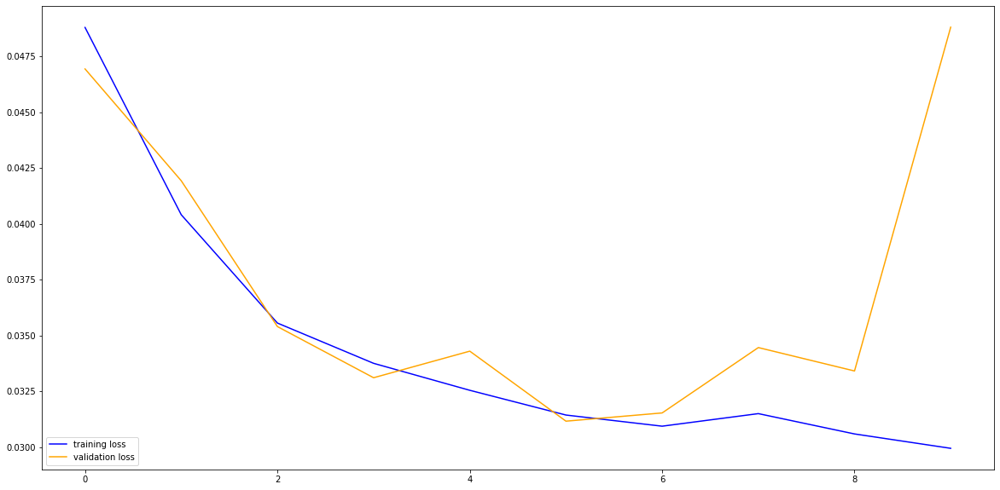

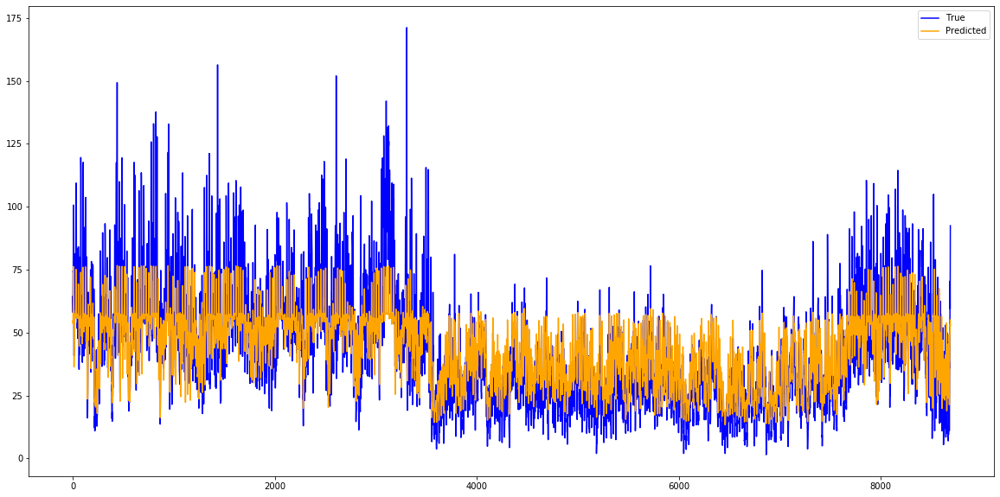

RMSE: 12.521
This took 650.046462059021 seconds.
Train on 52608 samples, validate on 8688 samples
Epoch 1/30
52608/52608 [==============================] - 58s 1ms/step - loss: 0.0495 - val_loss: 0.0501
Epoch 2/30
52608/52608 [==============================] - 54s 1ms/step - loss: 0.0398 - val_loss: 0.0391A: - ETA: 0s - loss:
Epoch 3/30
52608/52608 [==============================] - 50s 941us/step - loss: 0.0359 - val_loss: 0.0403
Epoch 4/30
52608/52608 [==============================] - 47s 894us/step - loss: 0.0354 - val_loss: 0.0385
Epoch 5/30
52608/52608 [==============================] - 46s 870us/step - loss: 0.0321 - val_loss: 0.0352
Epoch 6/30
52608/52608 [==============================] - 46s 869us/step - loss: 0.0308 - val_loss: 0.0374
Epoch 7/30
52608/52608 [==============================] - 46s 870us/step - loss: 0.0300 - val_loss: 0.0353
Epoch 8/30
52608/52608 [==============================] - 46s 873us/step - loss: 0.0294 - val_loss: 0.0359
Epoch 9/30
52608/52608 [======

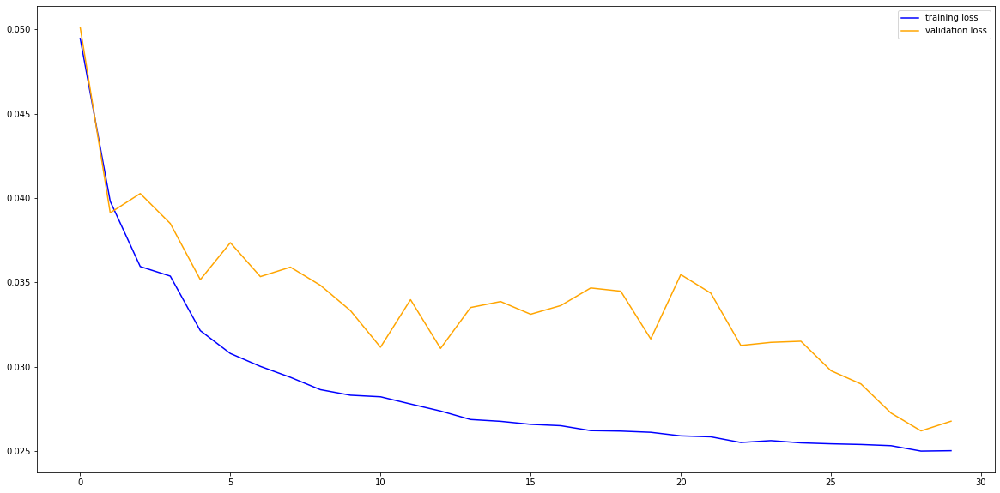

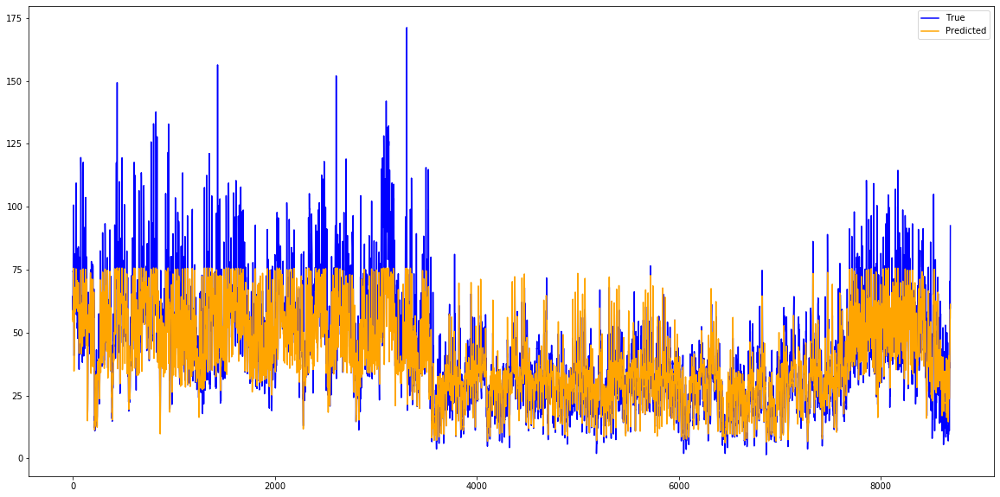

RMSE: 10.559
This took 1411.1065425872803 seconds.
Train on 52608 samples, validate on 8688 samples
Epoch 1/50
52608/52608 [==============================] - 48s 910us/step - loss: 0.0505 - val_loss: 0.0473
Epoch 2/50
52608/52608 [==============================] - 44s 836us/step - loss: 0.0401 - val_loss: 0.0373
Epoch 3/50
52608/52608 [==============================] - 44s 830us/step - loss: 0.0363 - val_loss: 0.0408
Epoch 4/50
52608/52608 [==============================] - 44s 828us/step - loss: 0.0340 - val_loss: 0.0418
Epoch 5/50
52608/52608 [==============================] - 45s 858us/step - loss: 0.0323 - val_loss: 0.0370
Epoch 6/50
52608/52608 [==============================] - 47s 896us/step - loss: 0.0311 - val_loss: 0.0354
Epoch 7/50
52608/52608 [==============================] - 47s 886us/step - loss: 0.0304 - val_loss: 0.0351
Epoch 8/50
52608/52608 [==============================] - 47s 896us/step - loss: 0.0298 - val_loss: 0.0345
Epoch 9/50
52608/52608 [====================

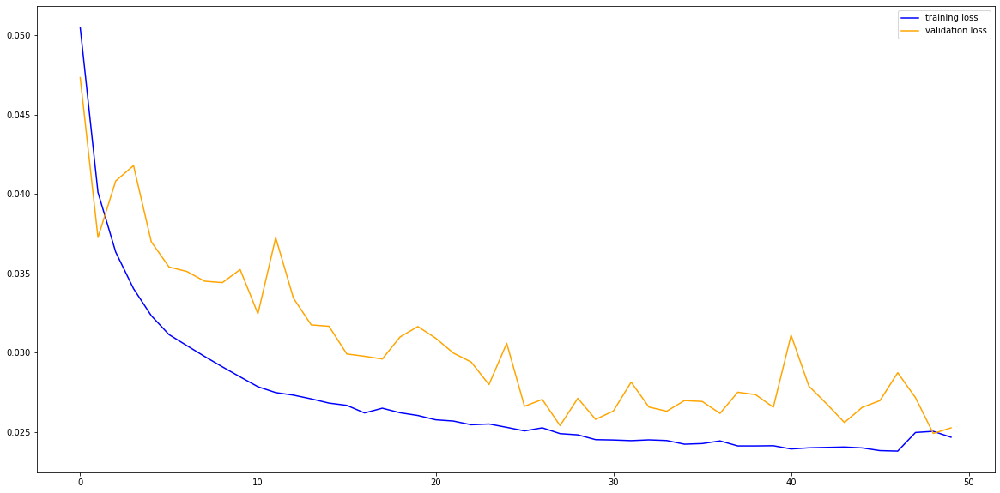

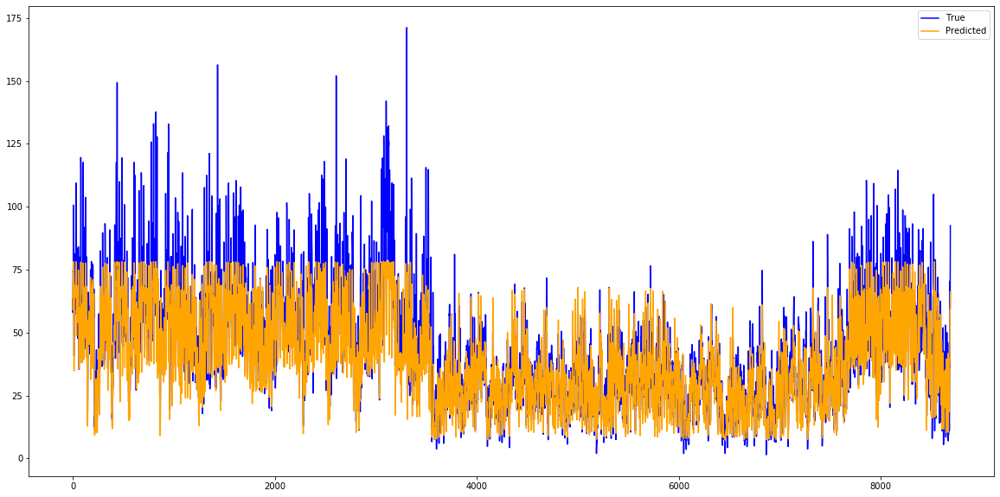

RMSE: 10.682
This took 1640.067055940628 seconds.
Train on 52608 samples, validate on 8688 samples
Epoch 1/10
52608/52608 [==============================] - 19s 356us/step - loss: 0.0546 - val_loss: 0.0704
Epoch 2/10
52608/52608 [==============================] - 17s 315us/step - loss: 0.0400 - val_loss: 0.0546
Epoch 3/10
52608/52608 [==============================] - 17s 323us/step - loss: 0.0357 - val_loss: 0.0453
Epoch 4/10
52608/52608 [==============================] - 16s 310us/step - loss: 0.0335 - val_loss: 0.0348
Epoch 5/10
52608/52608 [==============================] - 17s 326us/step - loss: 0.0323 - val_loss: 0.0321
Epoch 6/10
52608/52608 [==============================] - 17s 330us/step - loss: 0.0313 - val_loss: 0.0323
Epoch 7/10
52608/52608 [==============================] - 18s 344us/step - loss: 0.0308 - val_loss: 0.0300
Epoch 8/10
52608/52608 [==============================] - 17s 319us/step - loss: 0.0301 - val_loss: 0.0297
Epoch 9/10
52608/52608 [=====================

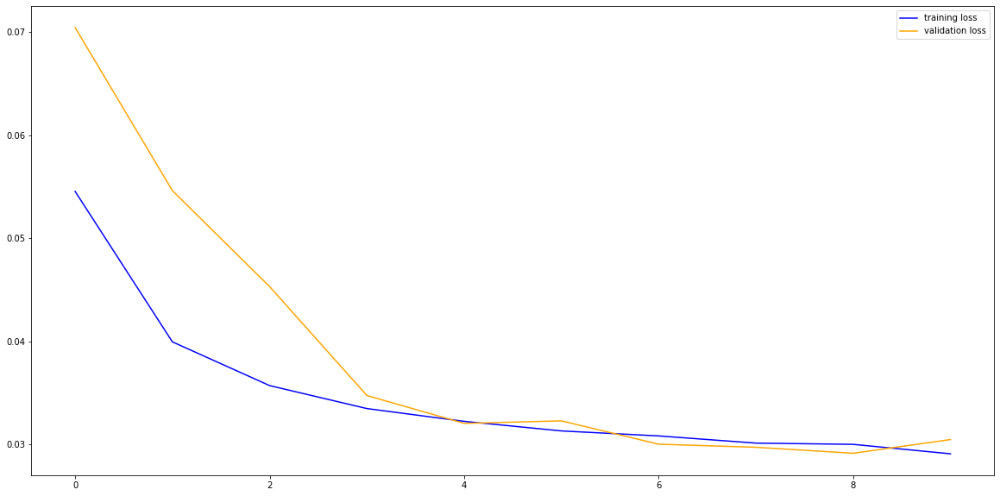

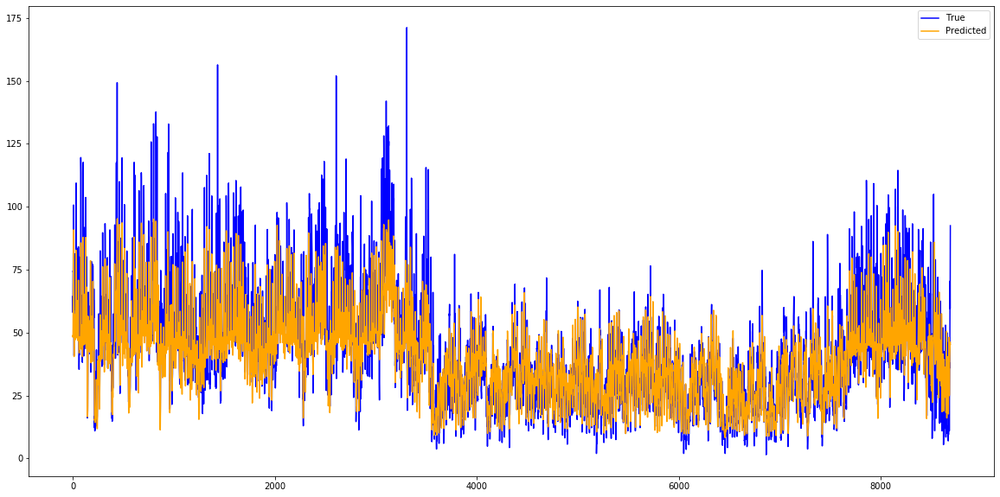

RMSE: 11.213
This took 186.75838613510132 seconds.
Train on 52608 samples, validate on 8688 samples
Epoch 1/30
52608/52608 [==============================] - 18s 351us/step - loss: 0.0493 - val_loss: 0.0461
Epoch 2/30
52608/52608 [==============================] - 17s 320us/step - loss: 0.0375 - val_loss: 0.0366
Epoch 3/30
52608/52608 [==============================] - 17s 316us/step - loss: 0.0345 - val_loss: 0.0345
Epoch 4/30
52608/52608 [==============================] - 17s 319us/step - loss: 0.0326 - val_loss: 0.0313
Epoch 5/30
52608/52608 [==============================] - 17s 326us/step - loss: 0.0316 - val_loss: 0.0336
Epoch 6/30
52608/52608 [==============================] - 17s 323us/step - loss: 0.0305 - val_loss: 0.0355
Epoch 7/30
52608/52608 [==============================] - 17s 318us/step - loss: 0.0297 - val_loss: 0.0354
Epoch 8/30
52608/52608 [==============================] - 17s 315us/step - loss: 0.0291 - val_loss: 0.0288
Epoch 9/30
52608/52608 [====================

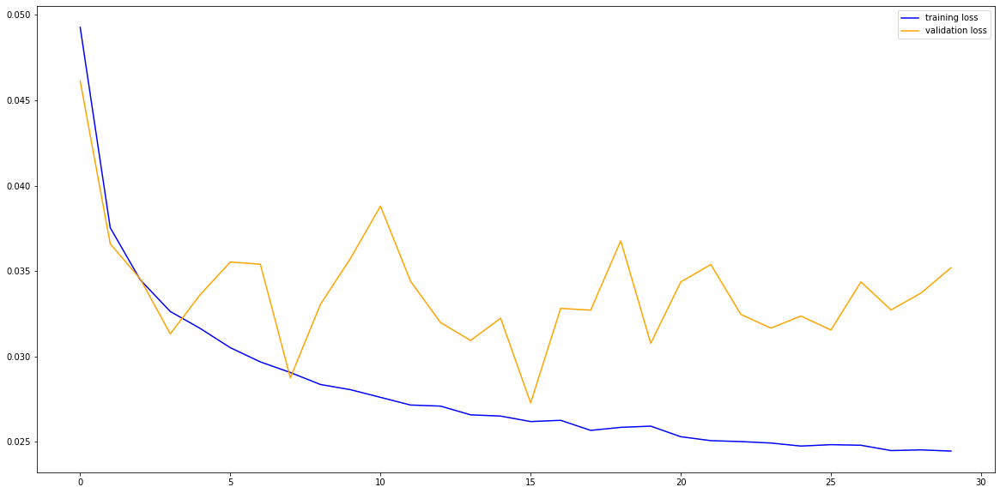

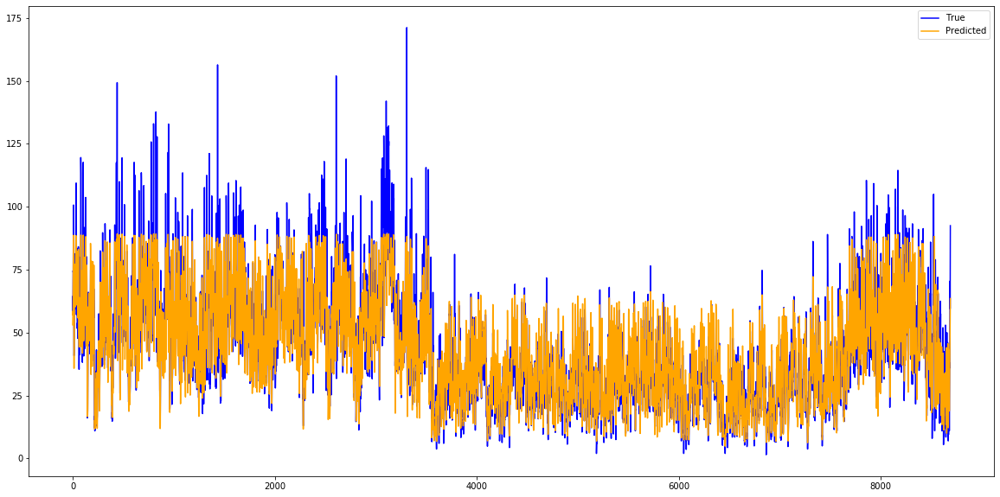

RMSE: 10.060
This took 514.8859231472015 seconds.
Train on 52608 samples, validate on 8688 samples
Epoch 1/50
52608/52608 [==============================] - 18s 349us/step - loss: 0.0555 - val_loss: 0.0621
Epoch 2/50
52608/52608 [==============================] - 16s 307us/step - loss: 0.0424 - val_loss: 0.0404
Epoch 3/50
52608/52608 [==============================] - 16s 311us/step - loss: 0.0372 - val_loss: 0.0373
Epoch 4/50
52608/52608 [==============================] - 17s 315us/step - loss: 0.0342 - val_loss: 0.0331
Epoch 5/50
52608/52608 [==============================] - 16s 306us/step - loss: 0.0325 - val_loss: 0.0321
Epoch 6/50
52608/52608 [==============================] - 17s 314us/step - loss: 0.0313 - val_loss: 0.0353
Epoch 7/50
52608/52608 [==============================] - 16s 313us/step - loss: 0.0303 - val_loss: 0.0310
Epoch 8/50
52608/52608 [==============================] - 16s 312us/step - loss: 0.0297 - val_loss: 0.0350
Epoch 9/50
52608/52608 [=====================

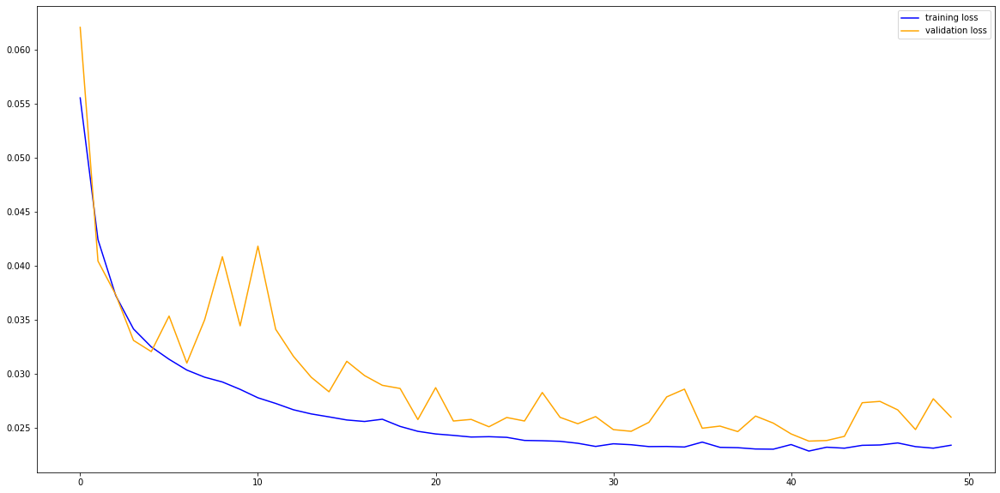

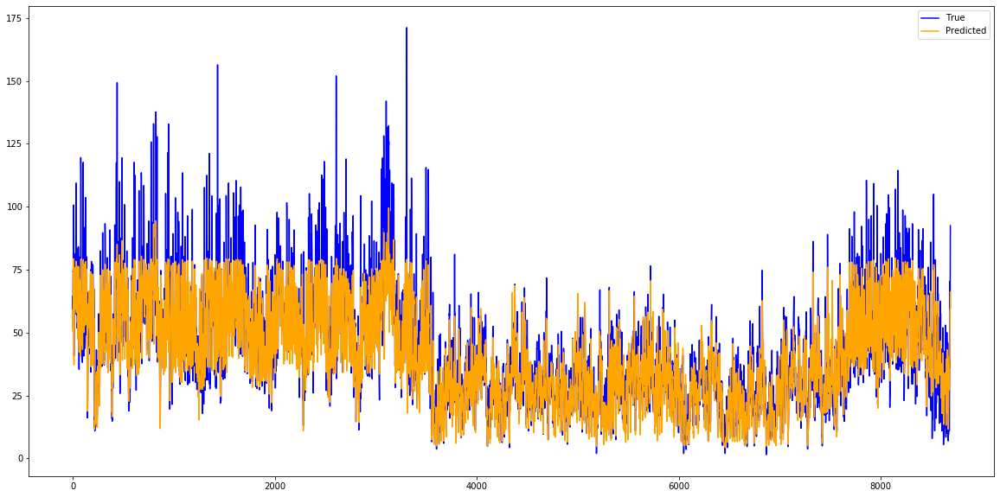

RMSE: 9.488
This took 832.9482572078705 seconds.
Train on 52608 samples, validate on 8688 samples
Epoch 1/10
52608/52608 [==============================] - 14s 271us/step - loss: 0.0554 - val_loss: 0.0508
Epoch 2/10
52608/52608 [==============================] - 13s 240us/step - loss: 0.0399 - val_loss: 0.0386
Epoch 3/10
52608/52608 [==============================] - 12s 238us/step - loss: 0.0350 - val_loss: 0.0377
Epoch 4/10
52608/52608 [==============================] - 13s 241us/step - loss: 0.0331 - val_loss: 0.0330
Epoch 5/10
52608/52608 [==============================] - 13s 248us/step - loss: 0.0313 - val_loss: 0.0321
Epoch 6/10
52608/52608 [==============================] - 13s 244us/step - loss: 0.0302 - val_loss: 0.0333
Epoch 7/10
52608/52608 [==============================] - 13s 244us/step - loss: 0.0292 - val_loss: 0.0300
Epoch 8/10
52608/52608 [==============================] - 13s 245us/step - loss: 0.0288 - val_loss: 0.0295
Epoch 9/10
52608/52608 [======================

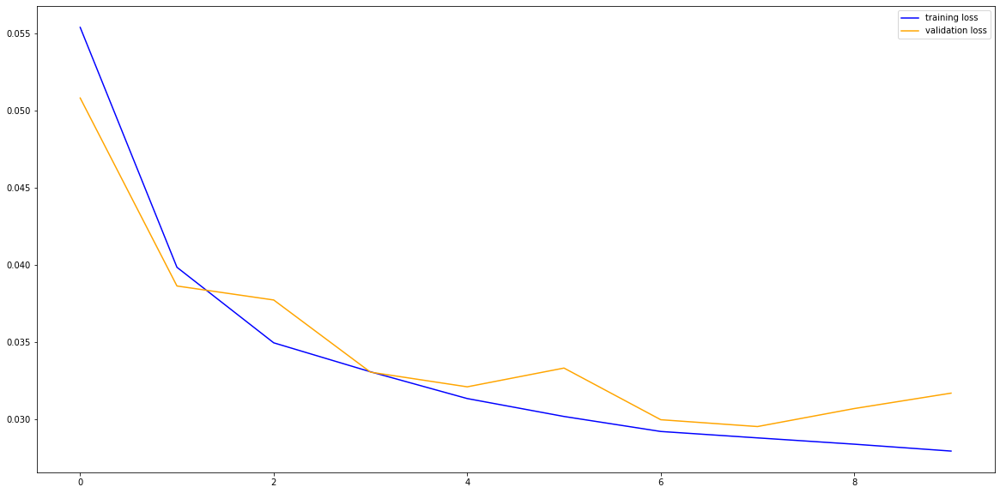

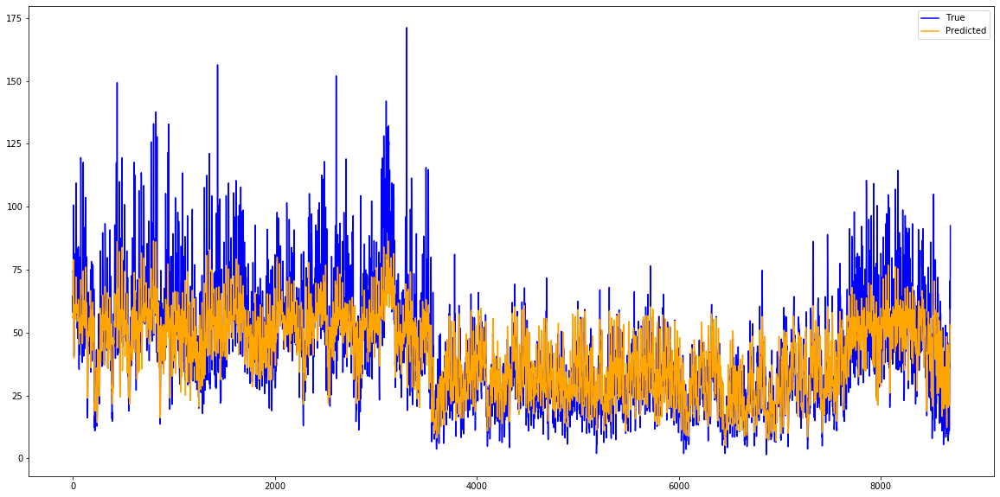

RMSE: 11.151
This took 141.3435730934143 seconds.
Train on 52608 samples, validate on 8688 samples
Epoch 1/30
52608/52608 [==============================] - 15s 280us/step - loss: 0.0549 - val_loss: 0.0612: 0.
Epoch 2/30
52608/52608 [==============================] - 13s 241us/step - loss: 0.0400 - val_loss: 0.0362
Epoch 3/30
52608/52608 [==============================] - 13s 242us/step - loss: 0.0351 - val_loss: 0.0336
Epoch 4/30
52608/52608 [==============================] - 13s 254us/step - loss: 0.0327 - val_loss: 0.0331
Epoch 5/30
52608/52608 [==============================] - 13s 242us/step - loss: 0.0314 - val_loss: 0.0325
Epoch 6/30
52608/52608 [==============================] - 13s 253us/step - loss: 0.0303 - val_loss: 0.0326
Epoch 7/30
52608/52608 [==============================] - 13s 246us/step - loss: 0.0293 - val_loss: 0.0305
Epoch 8/30
52608/52608 [==============================] - 13s 243us/step - loss: 0.0286 - val_loss: 0.0285
Epoch 9/30
52608/52608 [=================

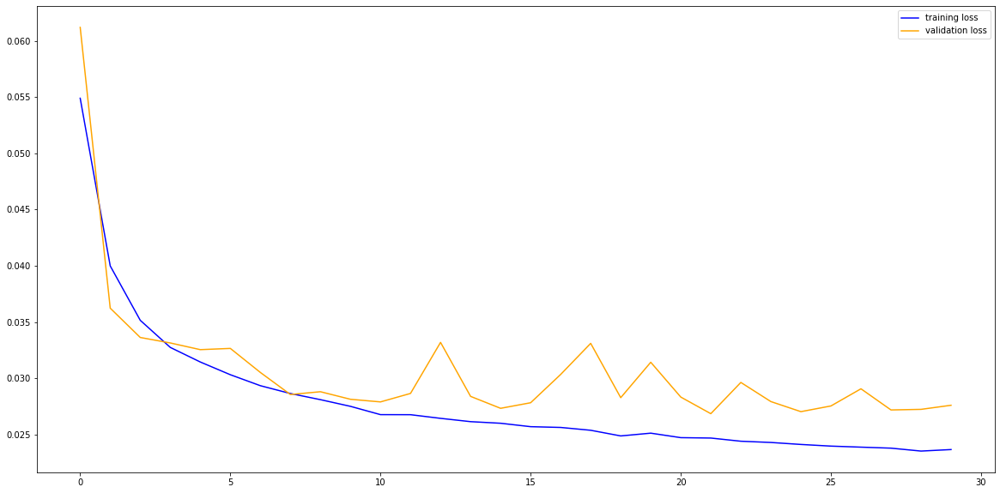

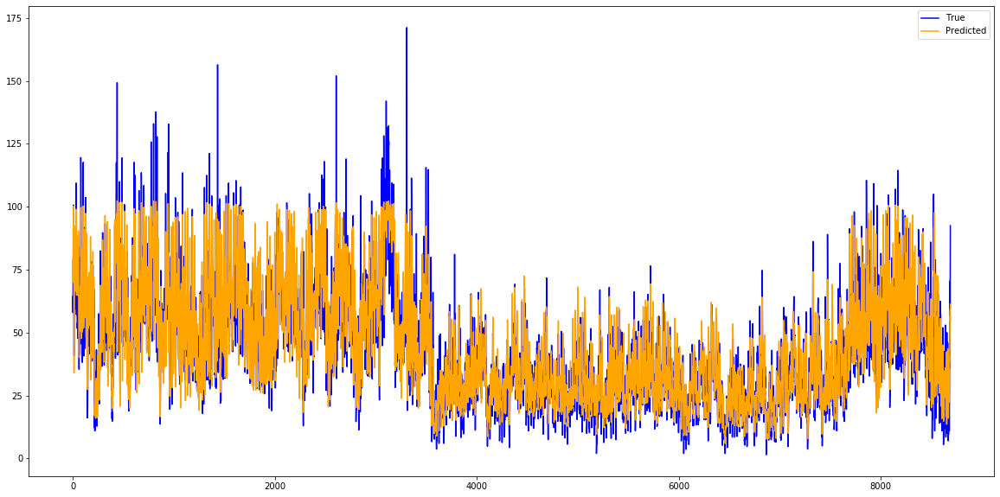

RMSE: 9.930
This took 406.1392710208893 seconds.
Train on 52608 samples, validate on 8688 samples
Epoch 1/50
52608/52608 [==============================] - 15s 287us/step - loss: 0.0518 - val_loss: 0.0456
Epoch 2/50
52608/52608 [==============================] - 13s 242us/step - loss: 0.0369 - val_loss: 0.0394
Epoch 3/50
52608/52608 [==============================] - 14s 257us/step - loss: 0.0334 - val_loss: 0.0399: 0
Epoch 4/50
52608/52608 [==============================] - 13s 243us/step - loss: 0.0316 - val_loss: 0.0378
Epoch 5/50
52608/52608 [==============================] - 13s 249us/step - loss: 0.0305 - val_loss: 0.0388
Epoch 6/50
52608/52608 [==============================] - 13s 248us/step - loss: 0.0296 - val_loss: 0.0323
Epoch 7/50
52608/52608 [==============================] - 13s 245us/step - loss: 0.0287 - val_loss: 0.0304
Epoch 8/50
52608/52608 [==============================] - 13s 253us/step - loss: 0.0279 - val_loss: 0.0323
Epoch 9/50
52608/52608 [===================

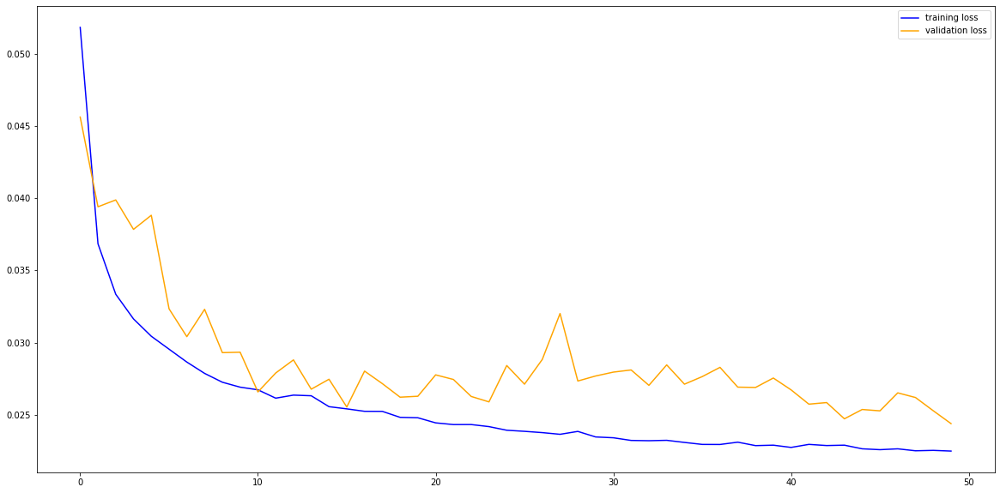

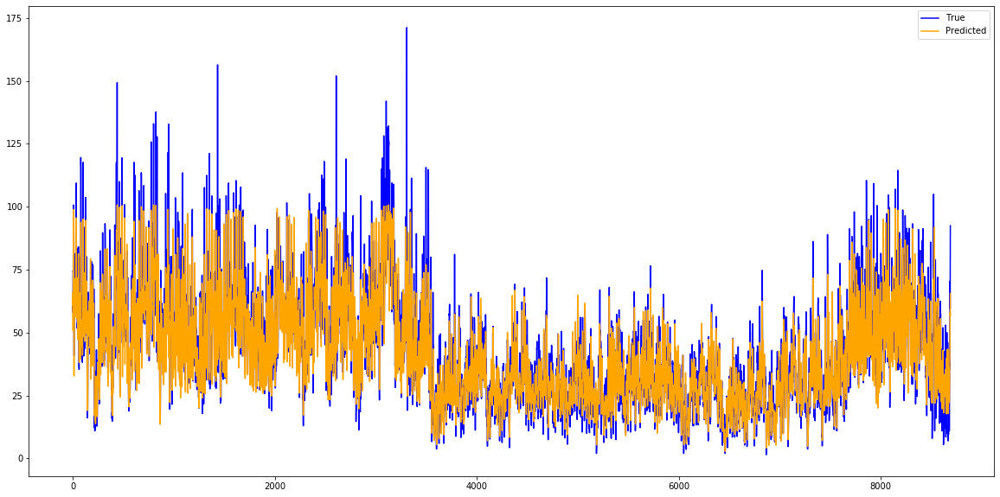

RMSE: 8.874
This took 672.1262273788452 seconds.
Train on 52608 samples, validate on 8688 samples
Epoch 1/10
52608/52608 [==============================] - 9s 171us/step - loss: 0.0643 - val_loss: 0.0585
Epoch 2/10
52608/52608 [==============================] - 7s 129us/step - loss: 0.0563 - val_loss: 0.0617
Epoch 3/10
52608/52608 [==============================] - 7s 133us/step - loss: 0.0466 - val_loss: 0.0665
Epoch 4/10
52608/52608 [==============================] - 7s 131us/step - loss: 0.0408 - val_loss: 0.0392
Epoch 5/10
52608/52608 [==============================] - 7s 129us/step - loss: 0.0348 - val_loss: 0.0347
Epoch 6/10
52608/52608 [==============================] - 7s 136us/step - loss: 0.0326 - val_loss: 0.0319
Epoch 7/10
52608/52608 [==============================] - 7s 132us/step - loss: 0.0313 - val_loss: 0.0308ETA: 1s -  - ETA: 0s - 
Epoch 8/10
52608/52608 [==============================] - 7s 136us/step - loss: 0.0300 - val_loss: 0.0304
Epoch 9/10
52608/52608 [=======

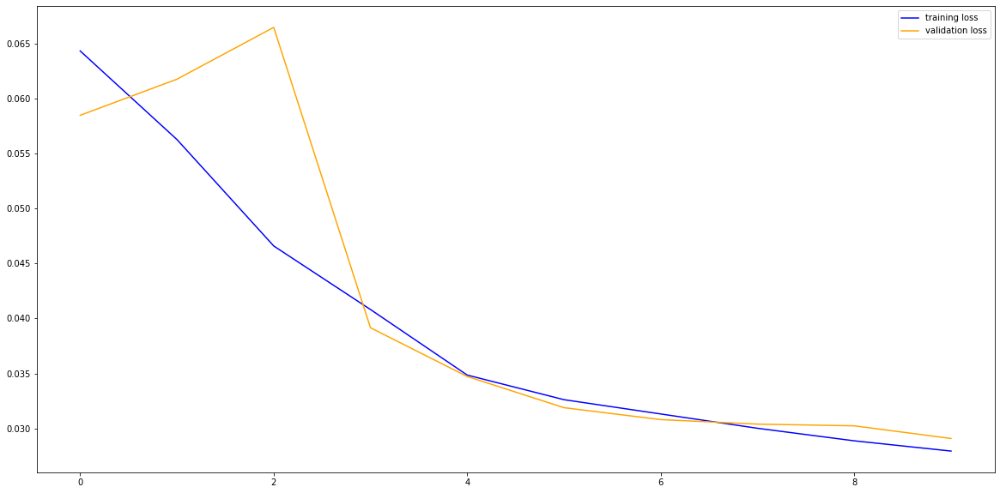

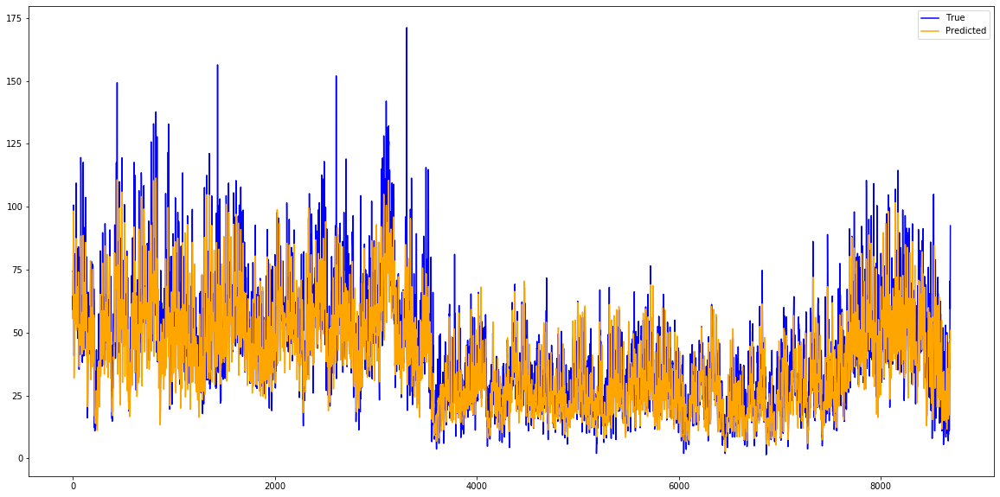

RMSE: 10.841
This took 83.63864231109619 seconds.
Train on 52608 samples, validate on 8688 samples
Epoch 1/30
52608/52608 [==============================] - 9s 176us/step - loss: 0.0624 - val_loss: 0.0766
Epoch 2/30
52608/52608 [==============================] - 7s 128us/step - loss: 0.0534 - val_loss: 0.0795
Epoch 3/30
52608/52608 [==============================] - 7s 129us/step - loss: 0.0436 - val_loss: 0.0515s - lo
Epoch 4/30
52608/52608 [==============================] - 7s 132us/step - loss: 0.0369 - val_loss: 0.0385
Epoch 5/30
52608/52608 [==============================] - 7s 131us/step - loss: 0.0334 - val_loss: 0.0319
Epoch 6/30
52608/52608 [==============================] - 7s 135us/step - loss: 0.0314 - val_loss: 0.0315
Epoch 7/30
52608/52608 [==============================] - 7s 135us/step - loss: 0.0311 - val_loss: 0.0323
Epoch 8/30
52608/52608 [==============================] - 7s 135us/step - loss: 0.0301 - val_loss: 0.0316
Epoch 9/30
52608/52608 [=======================

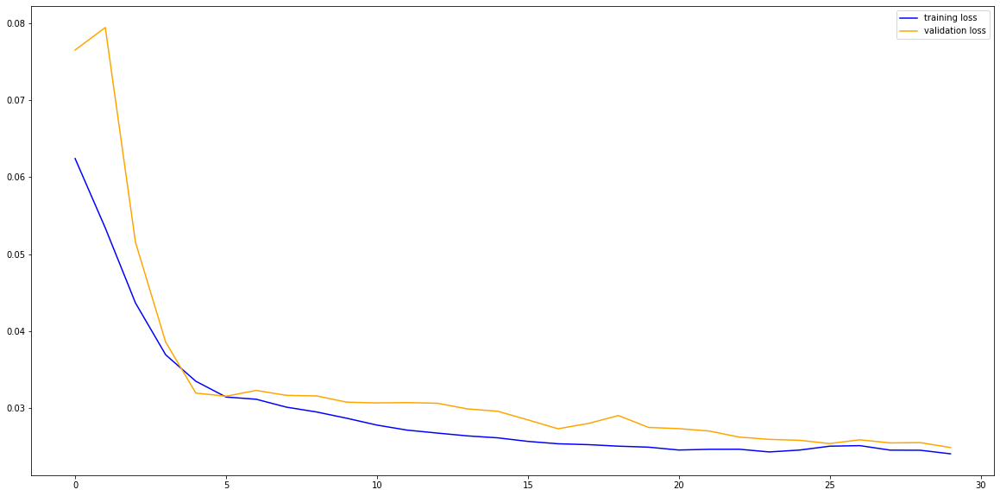

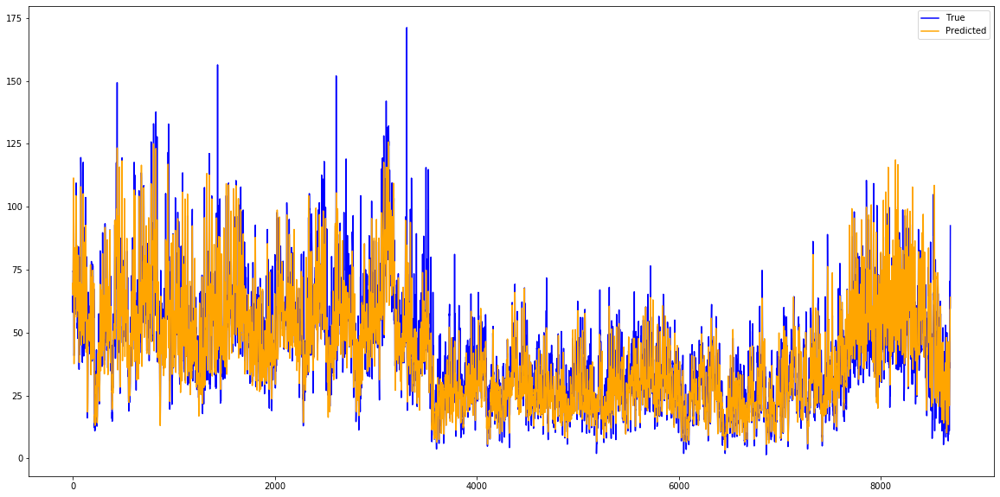

RMSE: 9.175
This took 226.22959804534912 seconds.
Train on 52608 samples, validate on 8688 samples
Epoch 1/50
52608/52608 [==============================] - 9s 177us/step - loss: 0.0674 - val_loss: 0.0751
Epoch 2/50
52608/52608 [==============================] - 7s 134us/step - loss: 0.0563 - val_loss: 0.0617
Epoch 3/50
52608/52608 [==============================] - 7s 132us/step - loss: 0.0441 - val_loss: 0.0379
Epoch 4/50
52608/52608 [==============================] - 7s 132us/step - loss: 0.0367 - val_loss: 0.0352
Epoch 5/50
52608/52608 [==============================] - 7s 135us/step - loss: 0.0329 - val_loss: 0.0321
Epoch 6/50
52608/52608 [==============================] - 7s 140us/step - loss: 0.0313 - val_loss: 0.0306
Epoch 7/50
52608/52608 [==============================] - 7s 137us/step - loss: 0.0299 - val_loss: 0.0311
Epoch 8/50
52608/52608 [==============================] - 7s 132us/step - loss: 0.0291 - val_loss: 0.0315
Epoch 9/50
52608/52608 [=============================

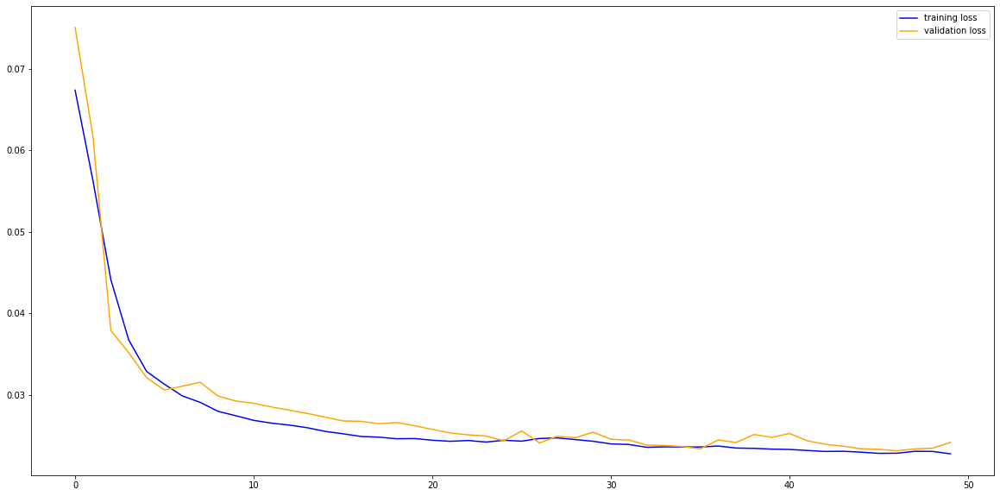

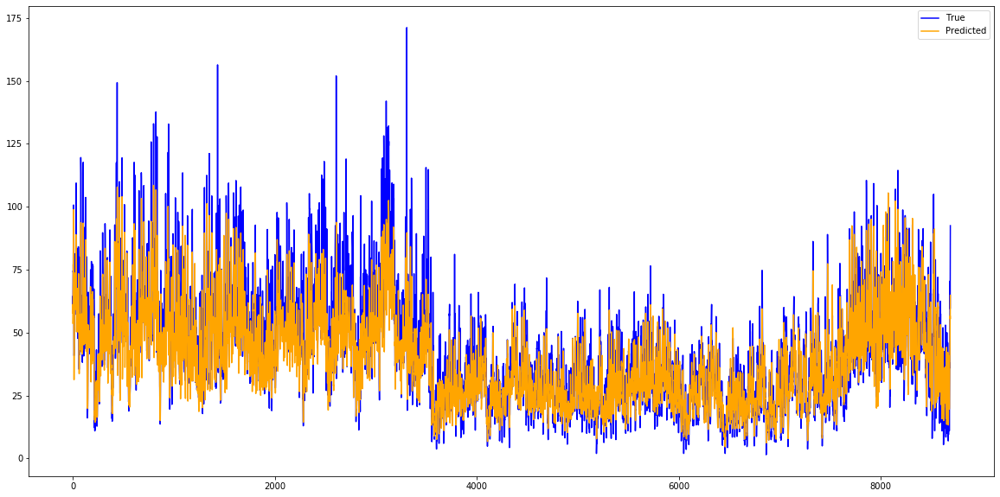

RMSE: 9.975
This took 372.7603693008423 seconds.
Train on 52608 samples, validate on 8688 samples
Epoch 1/10
52608/52608 [==============================] - 7s 135us/step - loss: 0.0867 - val_loss: 0.0536
Epoch 2/10
52608/52608 [==============================] - 4s 78us/step - loss: 0.0477 - val_loss: 0.0408
Epoch 3/10
52608/52608 [==============================] - 4s 71us/step - loss: 0.0396 - val_loss: 0.0391
Epoch 4/10
52608/52608 [==============================] - 4s 70us/step - loss: 0.0415 - val_loss: 0.0529
Epoch 5/10
52608/52608 [==============================] - 4s 77us/step - loss: 0.0448 - val_loss: 0.0463
Epoch 6/10
52608/52608 [==============================] - 4s 69us/step - loss: 0.0419 - val_loss: 0.0476
Epoch 7/10
52608/52608 [==============================] - 4s 70us/step - loss: 0.0386 - val_loss: 0.0429
Epoch 8/10
52608/52608 [==============================] - 4s 70us/step - loss: 0.0377 - val_loss: 0.0372
Epoch 9/10
52608/52608 [==============================] - 4s 

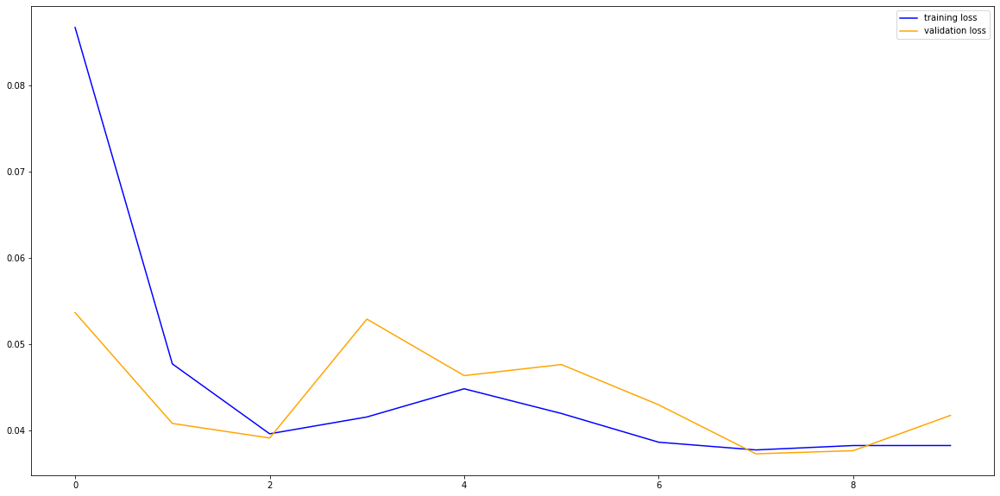

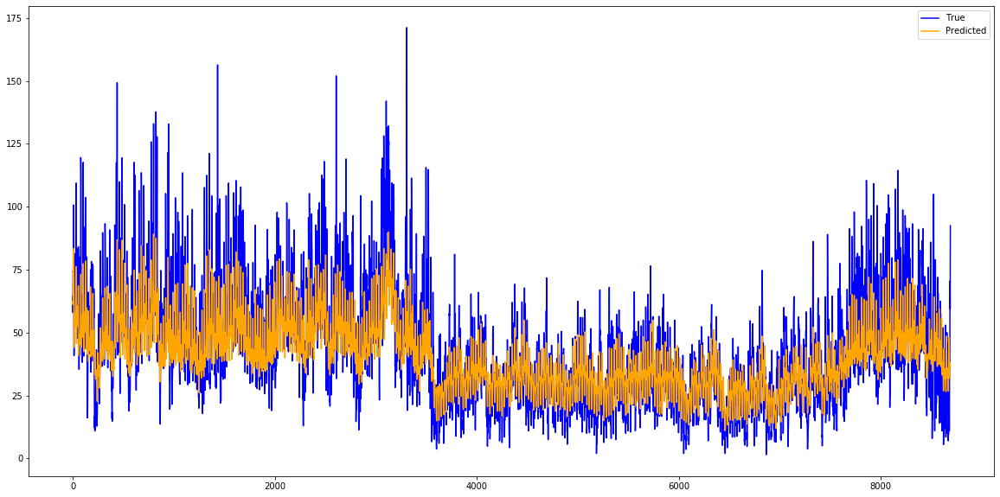

RMSE: 12.913
This took 72.3166184425354 seconds.
Train on 52608 samples, validate on 8688 samples
Epoch 1/30
52608/52608 [==============================] - 7s 142us/step - loss: 0.1091 - val_loss: 0.0605
Epoch 2/30
52608/52608 [==============================] - 4s 78us/step - loss: 0.0571 - val_loss: 0.0476
Epoch 3/30
52608/52608 [==============================] - 4s 81us/step - loss: 0.0464 - val_loss: 0.0475
Epoch 4/30
52608/52608 [==============================] - 4s 79us/step - loss: 0.0420 - val_loss: 0.0414
Epoch 5/30
52608/52608 [==============================] - 4s 82us/step - loss: 0.0387 - val_loss: 0.0388
Epoch 6/30
52608/52608 [==============================] - 4s 84us/step - loss: 0.0402 - val_loss: 0.0439
Epoch 7/30
52608/52608 [==============================] - 4s 80us/step - loss: 0.0396 - val_loss: 0.0402
Epoch 8/30
52608/52608 [==============================] - 4s 83us/step - loss: 0.0382 - val_loss: 0.0405
Epoch 9/30
52608/52608 [==============================] - 4s 

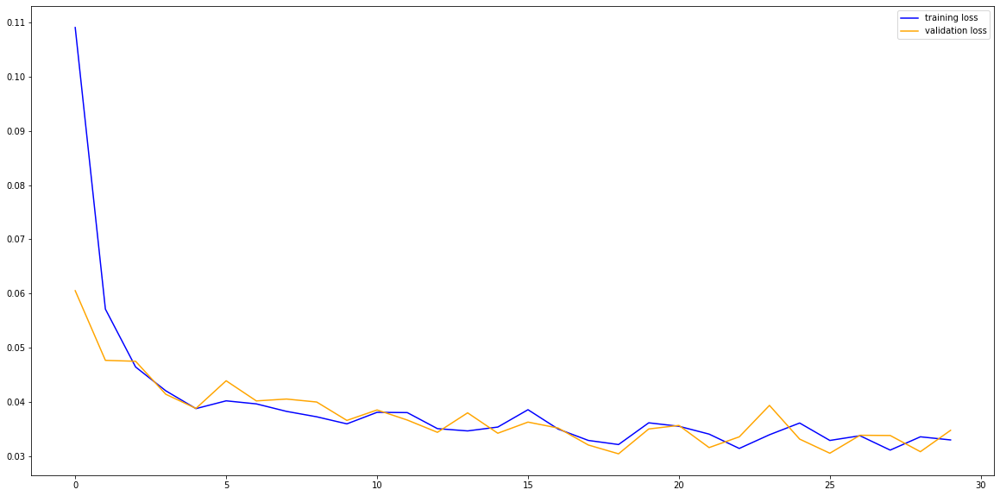

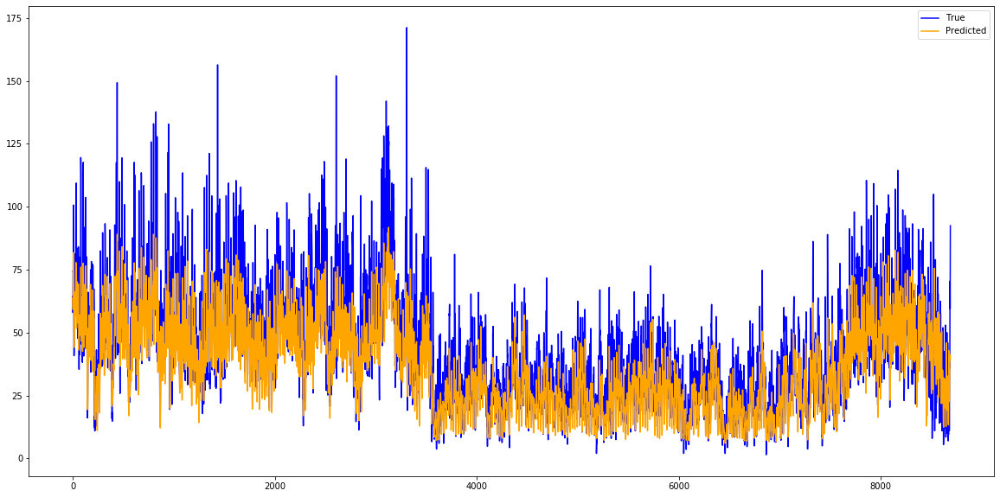

RMSE: 12.493
This took 148.80446100234985 seconds.
Train on 52608 samples, validate on 8688 samples
Epoch 1/50
52608/52608 [==============================] - 7s 125us/step - loss: 0.1002 - val_loss: 0.0478
Epoch 2/50
52608/52608 [==============================] - 4s 77us/step - loss: 0.0462 - val_loss: 0.0445
Epoch 3/50
52608/52608 [==============================] - 4s 78us/step - loss: 0.0420 - val_loss: 0.0447
Epoch 4/50
52608/52608 [==============================] - 4s 78us/step - loss: 0.0416 - val_loss: 0.0462
Epoch 5/50
52608/52608 [==============================] - 4s 75us/step - loss: 0.0419 - val_loss: 0.0420
Epoch 6/50
52608/52608 [==============================] - 4s 75us/step - loss: 0.0403 - val_loss: 0.0422
Epoch 7/50
52608/52608 [==============================] - 4s 77us/step - loss: 0.0386 - val_loss: 0.0396
Epoch 8/50
52608/52608 [==============================] - 4s 83us/step - loss: 0.0384 - val_loss: 0.0370
Epoch 9/50
52608/52608 [==============================] - 4

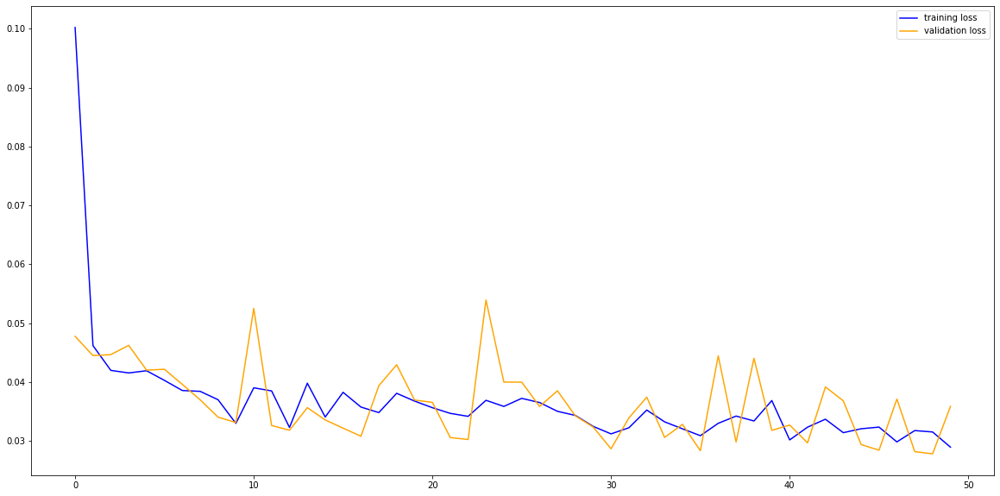

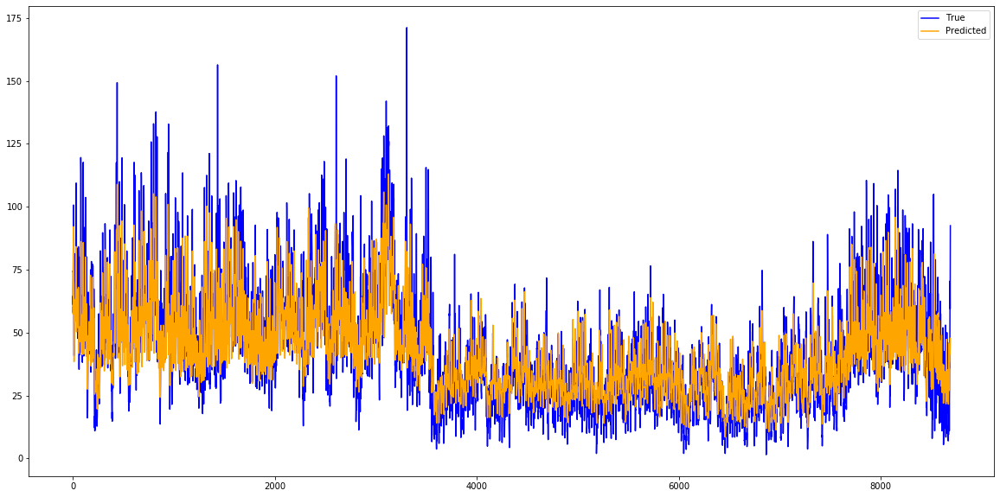

RMSE: 10.499
This took 227.09302854537964 seconds.
Train on 52608 samples, validate on 8688 samples
Epoch 1/10
52608/52608 [==============================] - 36s 682us/step - loss: 0.0302 - val_loss: 0.0266
Epoch 2/10
52608/52608 [==============================] - 36s 680us/step - loss: 0.0256 - val_loss: 0.0221
Epoch 3/10
52608/52608 [==============================] - 36s 684us/step - loss: 0.0221 - val_loss: 0.0213loss: 0.0
Epoch 4/10
52608/52608 [==============================] - 36s 686us/step - loss: 0.0203 - val_loss: 0.0217
Epoch 5/10
52608/52608 [==============================] - 37s 699us/step - loss: 0.0196 - val_loss: 0.0225
Epoch 6/10
52608/52608 [==============================] - 36s 688us/step - loss: 0.0190 - val_loss: 0.0225
Epoch 7/10
52608/52608 [==============================] - 37s 699us/step - loss: 0.0186 - val_loss: 0.0215
Epoch 8/10
52608/52608 [==============================] - 37s 698us/step - loss: 0.0183 - val_loss: 0.0207
Epoch 9/10
52608/52608 [===========

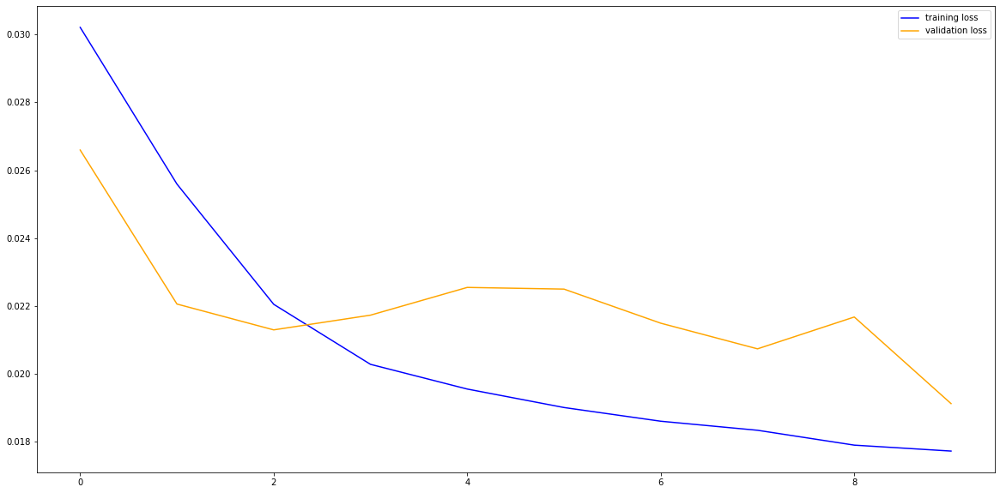

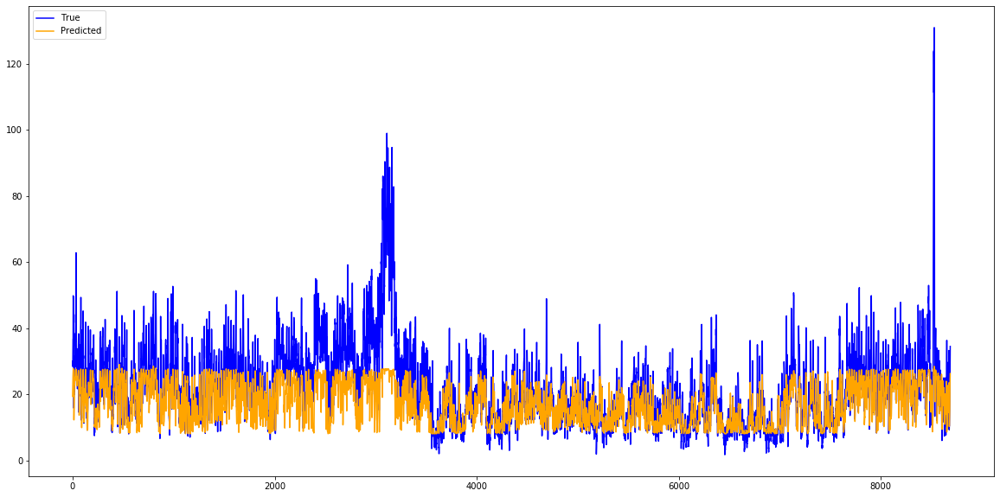

RMSE: 9.386
This took 376.07107281684875 seconds.
Train on 52608 samples, validate on 8688 samples
Epoch 1/30
52608/52608 [==============================] - 39s 737us/step - loss: 0.0310 - val_loss: 0.0426
Epoch 2/30
52608/52608 [==============================] - 37s 712us/step - loss: 0.0253 - val_loss: 0.0222
Epoch 3/30
52608/52608 [==============================] - 37s 710us/step - loss: 0.0217 - val_loss: 0.0220
Epoch 4/30
52608/52608 [==============================] - 38s 713us/step - loss: 0.0202 - val_loss: 0.0228
Epoch 5/30
52608/52608 [==============================] - 37s 711us/step - loss: 0.0195 - val_loss: 0.0218 loss: 
Epoch 6/30
52608/52608 [==============================] - 38s 722us/step - loss: 0.0191 - val_loss: 0.0233
Epoch 7/30
52608/52608 [==============================] - 38s 715us/step - loss: 0.0188 - val_loss: 0.0231
Epoch 8/30
52608/52608 [==============================] - 37s 712us/step - loss: 0.0185 - val_loss: 0.0210
Epoch 9/30
52608/52608 [==============

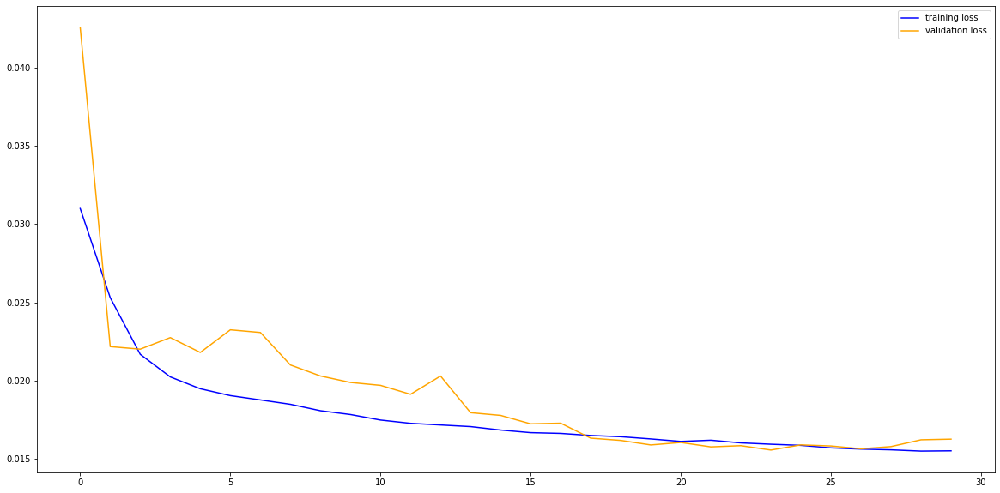

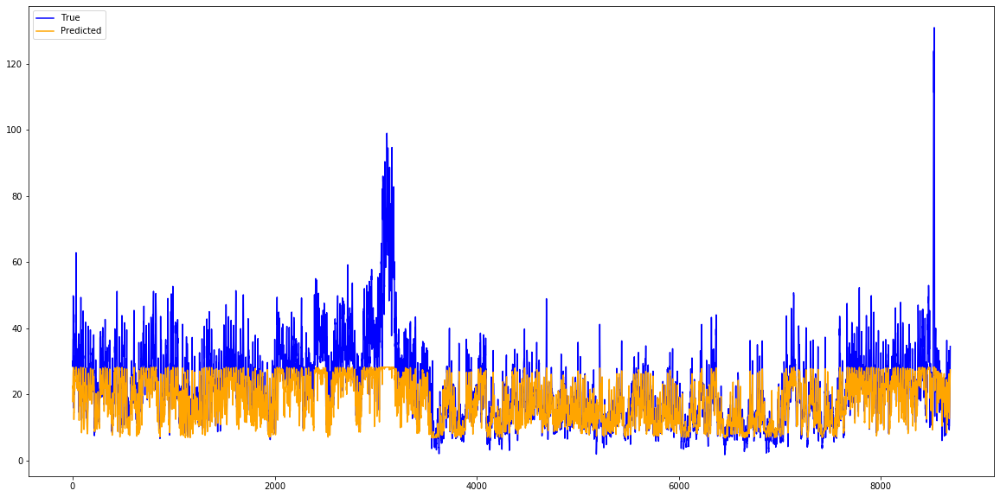

RMSE: 8.538
This took 1147.2614831924438 seconds.
Train on 52608 samples, validate on 8688 samples
Epoch 1/50
52608/52608 [==============================] - 38s 727us/step - loss: 0.0313 - val_loss: 0.0499
Epoch 2/50
52608/52608 [==============================] - 38s 717us/step - loss: 0.0283 - val_loss: 0.0266
Epoch 3/50
52608/52608 [==============================] - 39s 743us/step - loss: 0.0246 - val_loss: 0.0228
Epoch 4/50
52608/52608 [==============================] - 38s 725us/step - loss: 0.0213 - val_loss: 0.0201
Epoch 5/50
52608/52608 [==============================] - 38s 725us/step - loss: 0.0197 - val_loss: 0.0214
Epoch 6/50
52608/52608 [==============================] - 39s 748us/step - loss: 0.0192 - val_loss: 0.0206
Epoch 7/50
52608/52608 [==============================] - 39s 742us/step - loss: 0.0188 - val_loss: 0.0199
Epoch 8/50
52608/52608 [==============================] - 39s 744us/step - loss: 0.0186 - val_loss: 0.0208
Epoch 9/50
52608/52608 [=====================

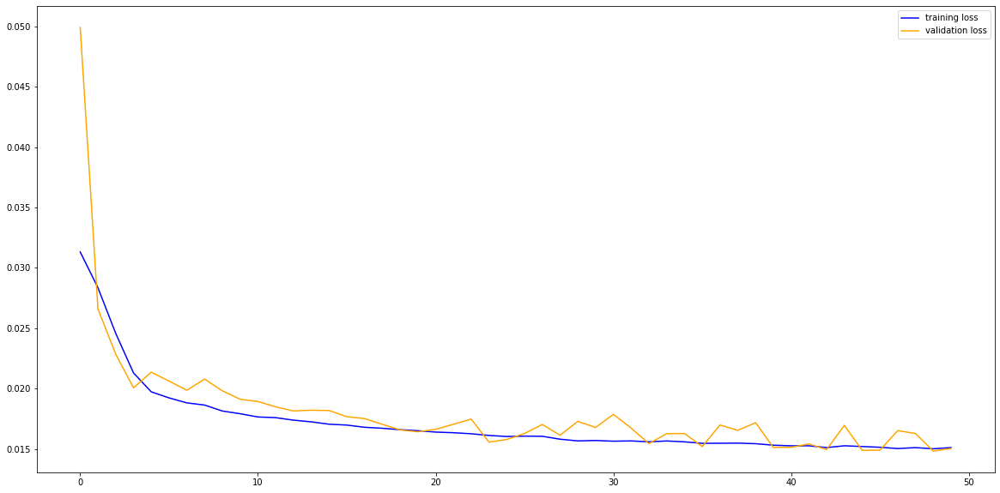

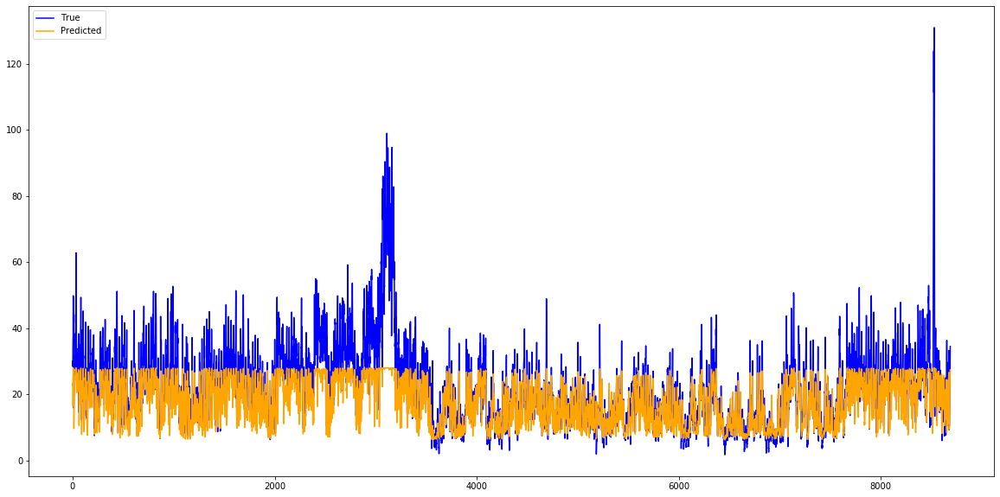

RMSE: 8.548
This took 1996.6938905715942 seconds.
Train on 52608 samples, validate on 8688 samples
Epoch 1/10
52608/52608 [==============================] - 25s 473us/step - loss: 0.0332 - val_loss: 0.0512
Epoch 2/10
52608/52608 [==============================] - 22s 418us/step - loss: 0.0294 - val_loss: 0.0436
Epoch 3/10
52608/52608 [==============================] - 23s 429us/step - loss: 0.0247 - val_loss: 0.0224
Epoch 4/10
52608/52608 [==============================] - 23s 439us/step - loss: 0.0208 - val_loss: 0.0274
Epoch 5/10
52608/52608 [==============================] - 22s 424us/step - loss: 0.0195 - val_loss: 0.0288
Epoch 6/10
52608/52608 [==============================] - 22s 426us/step - loss: 0.0188 - val_loss: 0.0289
Epoch 7/10
52608/52608 [==============================] - 23s 433us/step - loss: 0.0182 - val_loss: 0.0295
Epoch 8/10
52608/52608 [==============================] - 23s 435us/step - loss: 0.0178 - val_loss: 0.0279
Epoch 9/10
52608/52608 [=====================

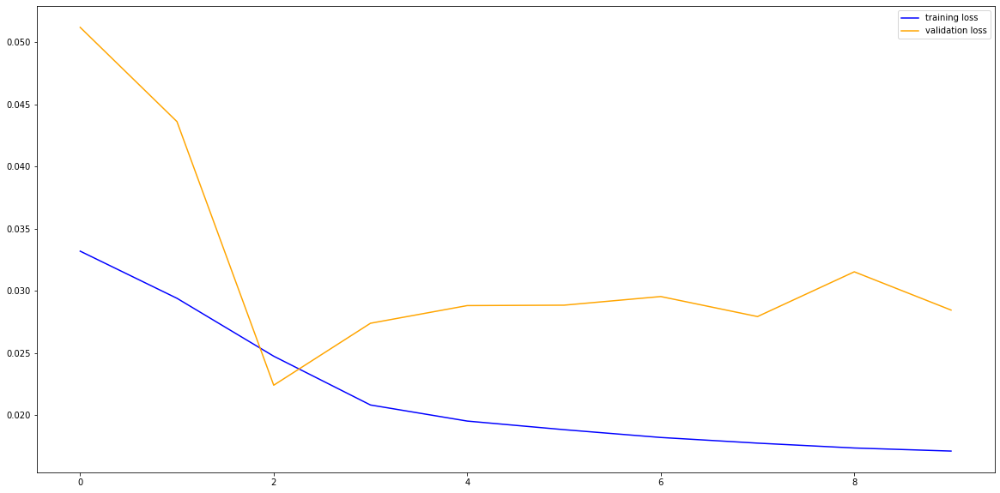

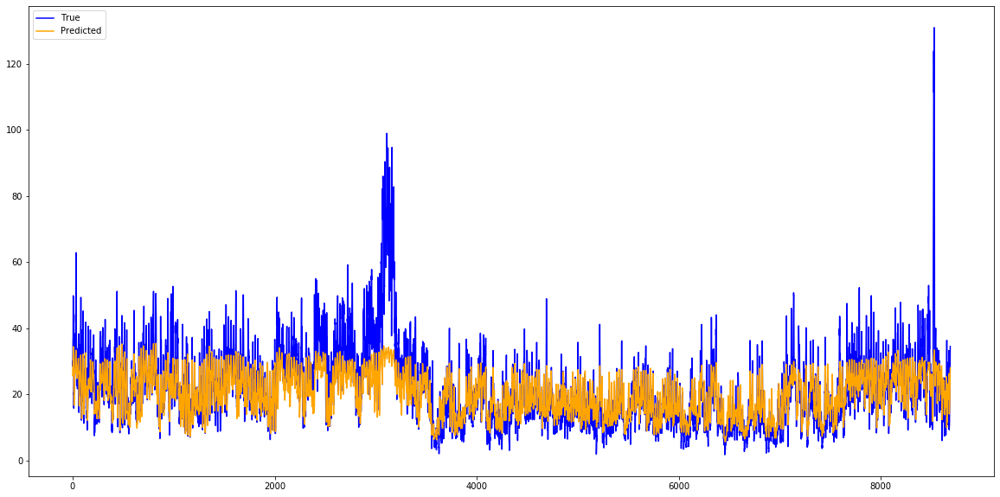

RMSE: 7.901
This took 242.62611198425293 seconds.
Train on 52608 samples, validate on 8688 samples
Epoch 1/30
52608/52608 [==============================] - 25s 467us/step - loss: 0.0320 - val_loss: 0.0471
Epoch 2/30
52608/52608 [==============================] - 23s 431us/step - loss: 0.0266 - val_loss: 0.0239
Epoch 3/30
52608/52608 [==============================] - 22s 426us/step - loss: 0.0219 - val_loss: 0.0277
Epoch 4/30
52608/52608 [==============================] - 23s 439us/step - loss: 0.0203 - val_loss: 0.0308
Epoch 5/30
52608/52608 [==============================] - 23s 444us/step - loss: 0.0192 - val_loss: 0.0276
Epoch 6/30
52608/52608 [==============================] - 24s 451us/step - loss: 0.0187 - val_loss: 0.0280
Epoch 7/30
52608/52608 [==============================] - 24s 449us/step - loss: 0.0183 - val_loss: 0.0266
Epoch 8/30
52608/52608 [==============================] - 24s 449us/step - loss: 0.0177 - val_loss: 0.0287
Epoch 9/30
52608/52608 [=====================

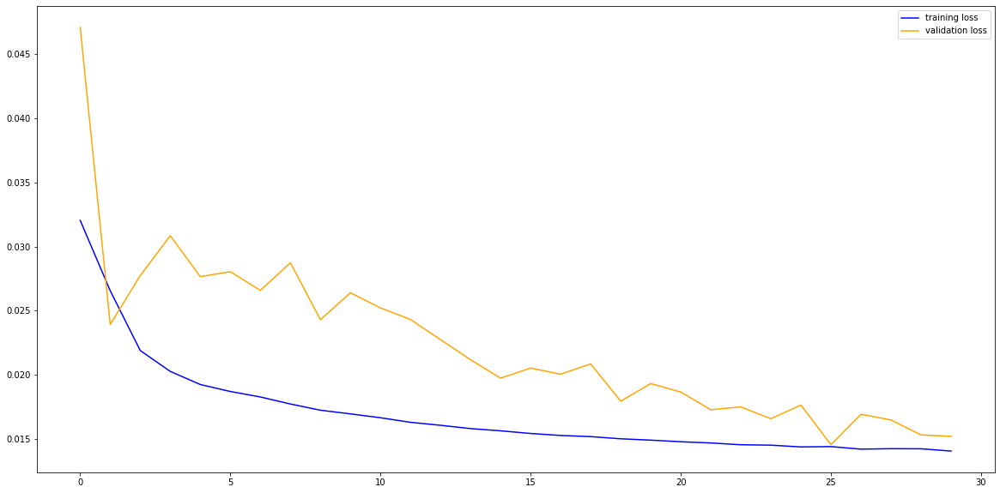

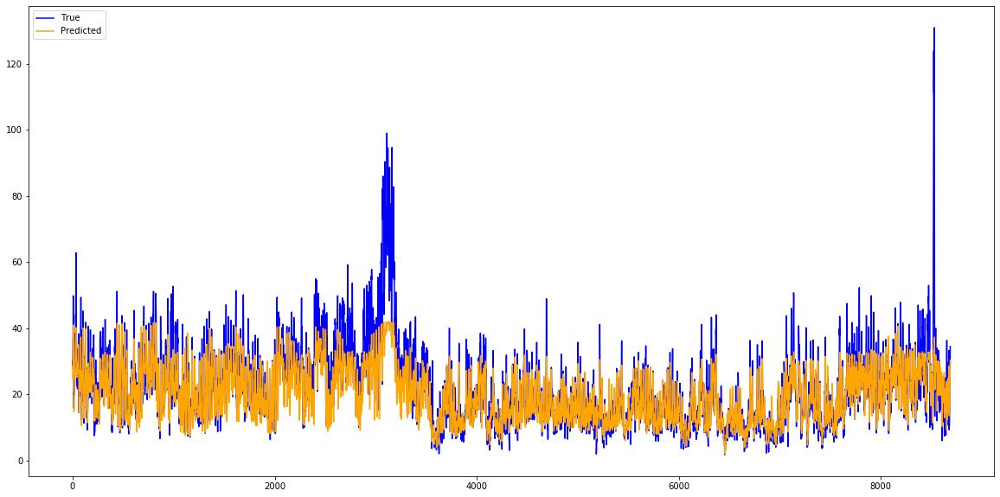

RMSE: 6.756
This took 708.7111582756042 seconds.
Train on 52608 samples, validate on 8688 samples
Epoch 1/50
52608/52608 [==============================] - 26s 504us/step - loss: 0.0324 - val_loss: 0.0534
Epoch 2/50
52608/52608 [==============================] - 23s 436us/step - loss: 0.0270 - val_loss: 0.0370
Epoch 3/50
52608/52608 [==============================] - 23s 434us/step - loss: 0.0233 - val_loss: 0.0245
Epoch 4/50
52608/52608 [==============================] - 23s 444us/step - loss: 0.0202 - val_loss: 0.0298
Epoch 5/50
52608/52608 [==============================] - 23s 435us/step - loss: 0.0193 - val_loss: 0.0283
Epoch 6/50
52608/52608 [==============================] - 23s 431us/step - loss: 0.0187 - val_loss: 0.0301
Epoch 7/50
52608/52608 [==============================] - 23s 437us/step - loss: 0.0181 - val_loss: 0.0291
Epoch 8/50
52608/52608 [==============================] - 23s 441us/step - loss: 0.0176 - val_loss: 0.0267
Epoch 9/50
52608/52608 [======================

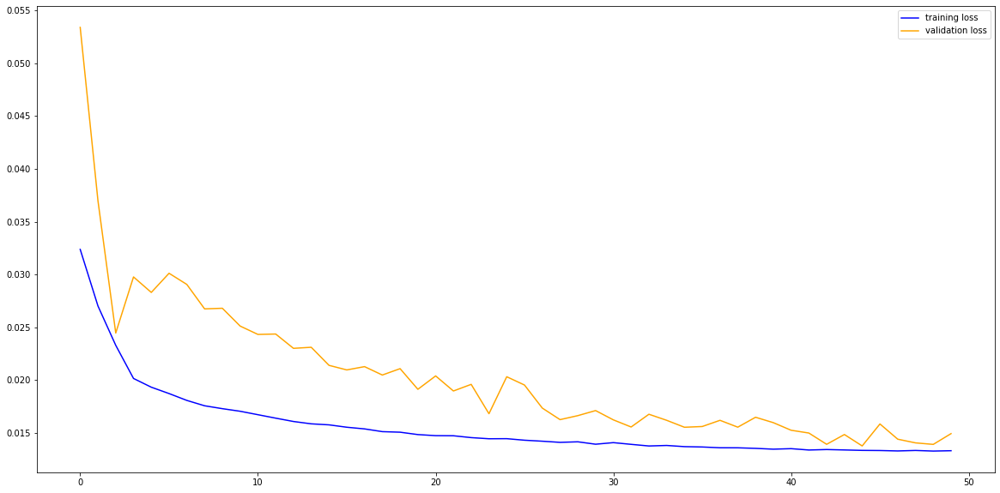

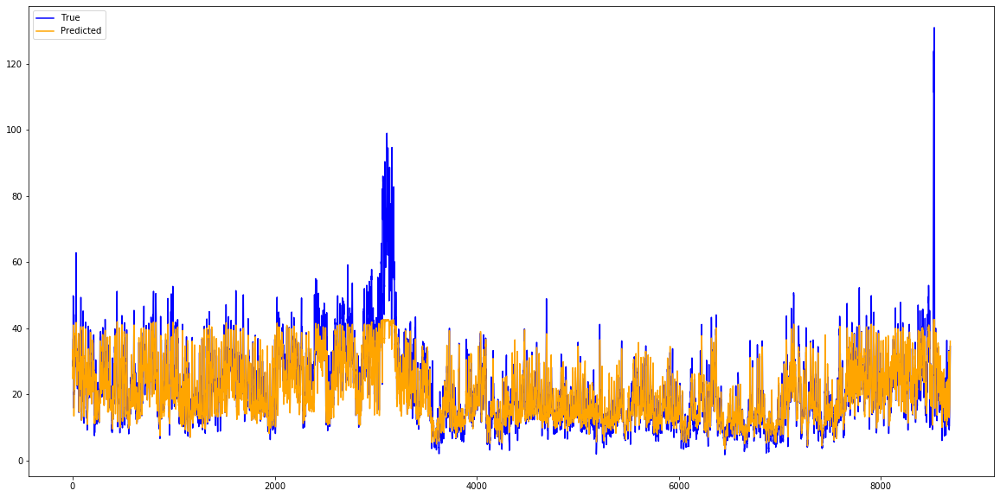

RMSE: 6.135
This took 1176.1991546154022 seconds.
Train on 52608 samples, validate on 8688 samples
Epoch 1/10
52608/52608 [==============================] - 21s 392us/step - loss: 0.0332 - val_loss: 0.0272
Epoch 2/10
52608/52608 [==============================] - 19s 360us/step - loss: 0.0222 - val_loss: 0.0200
Epoch 3/10
52608/52608 [==============================] - 19s 369us/step - loss: 0.0200 - val_loss: 0.0196
Epoch 4/10
52608/52608 [==============================] - 19s 358us/step - loss: 0.0188 - val_loss: 0.0201
Epoch 5/10
52608/52608 [==============================] - 19s 362us/step - loss: 0.0185 - val_loss: 0.0189
Epoch 6/10
52608/52608 [==============================] - 19s 364us/step - loss: 0.0182 - val_loss: 0.0191
Epoch 7/10
52608/52608 [==============================] - 19s 360us/step - loss: 0.0177 - val_loss: 0.0185
Epoch 8/10
52608/52608 [==============================] - 19s 359us/step - loss: 0.0172 - val_loss: 0.0186
Epoch 9/10
52608/52608 [=====================

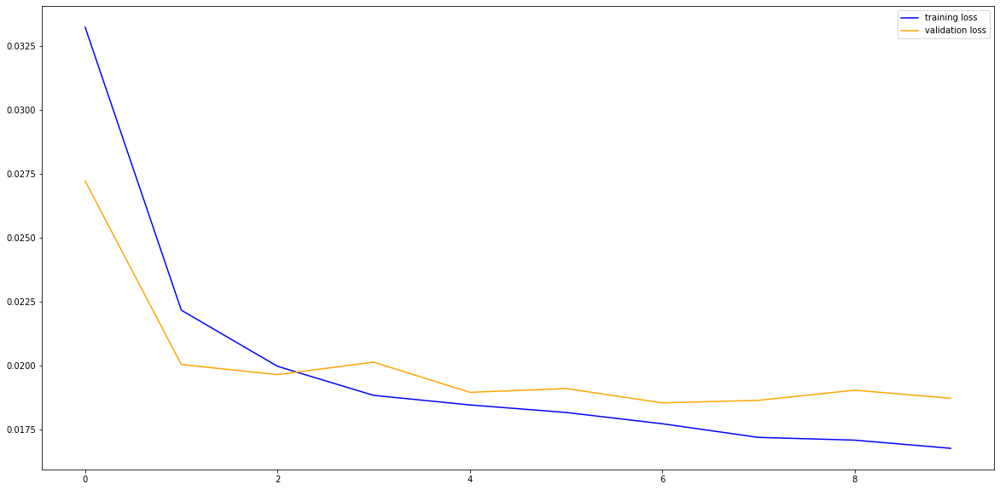

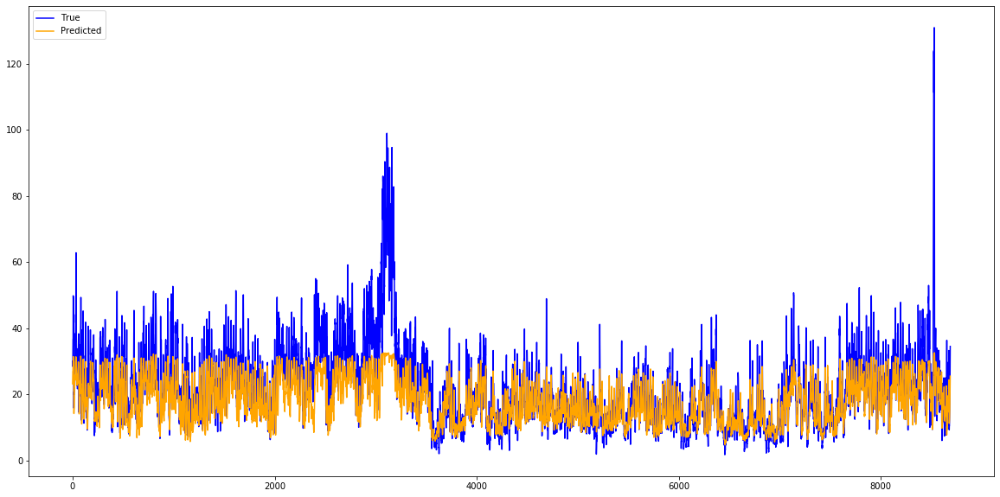

RMSE: 8.348
This took 207.25373435020447 seconds.
Train on 52608 samples, validate on 8688 samples
Epoch 1/30
52608/52608 [==============================] - 23s 431us/step - loss: 0.0364 - val_loss: 0.0342
Epoch 2/30
52608/52608 [==============================] - 19s 362us/step - loss: 0.0244 - val_loss: 0.0216
Epoch 3/30
52608/52608 [==============================] - 19s 363us/step - loss: 0.0216 - val_loss: 0.0200
Epoch 4/30
52608/52608 [==============================] - 19s 361us/step - loss: 0.0200 - val_loss: 0.0211
Epoch 5/30
52608/52608 [==============================] - 21s 395us/step - loss: 0.0187 - val_loss: 0.0194
Epoch 6/30
52608/52608 [==============================] - 19s 361us/step - loss: 0.0181 - val_loss: 0.0199
Epoch 7/30
52608/52608 [==============================] - 19s 362us/step - loss: 0.0178 - val_loss: 0.0198
Epoch 8/30
52608/52608 [==============================] - 19s 369us/step - loss: 0.0175 - val_loss: 0.0182
Epoch 9/30
52608/52608 [=====================

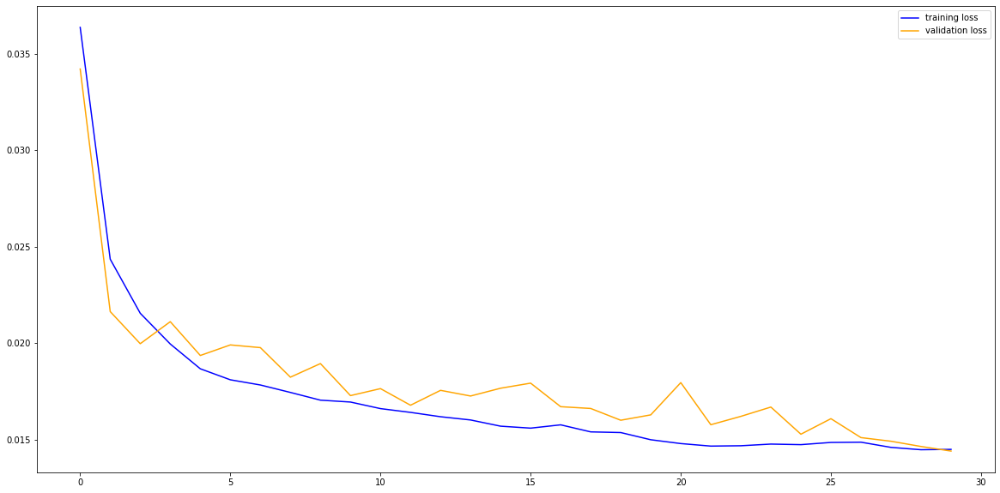

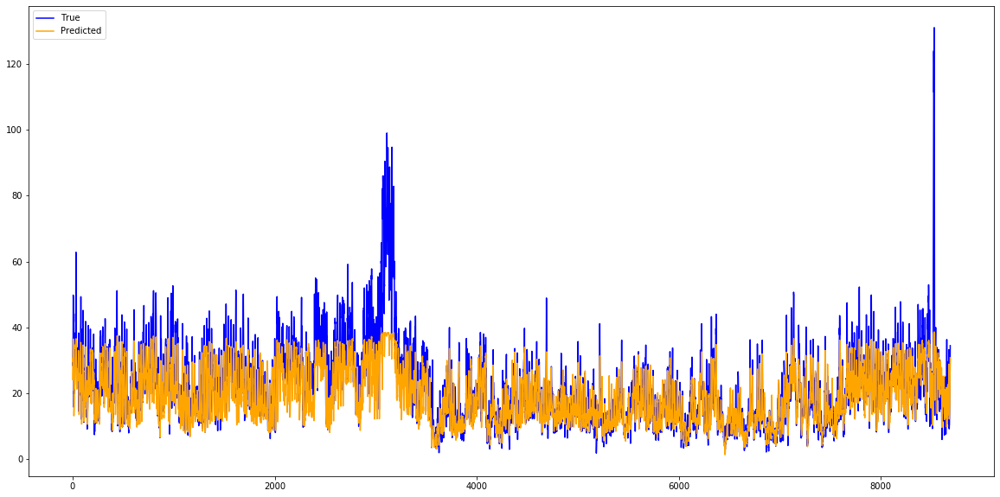

RMSE: 7.141
This took 599.5268664360046 seconds.
Train on 52608 samples, validate on 8688 samples
Epoch 1/50
52608/52608 [==============================] - 23s 434us/step - loss: 0.0351 - val_loss: 0.0333
Epoch 2/50
52608/52608 [==============================] - 20s 379us/step - loss: 0.0256 - val_loss: 0.0226
Epoch 3/50
52608/52608 [==============================] - 20s 383us/step - loss: 0.0210 - val_loss: 0.0198
Epoch 4/50
52608/52608 [==============================] - 20s 379us/step - loss: 0.0197 - val_loss: 0.0193
Epoch 5/50
52608/52608 [==============================] - 21s 393us/step - loss: 0.0188 - val_loss: 0.0191
Epoch 6/50
52608/52608 [==============================] - 20s 389us/step - loss: 0.0182 - val_loss: 0.0192
Epoch 7/50
52608/52608 [==============================] - 20s 388us/step - loss: 0.0179 - val_loss: 0.0179
Epoch 8/50
52608/52608 [==============================] - 21s 390us/step - loss: 0.0175 - val_loss: 0.0181
Epoch 9/50
52608/52608 [======================

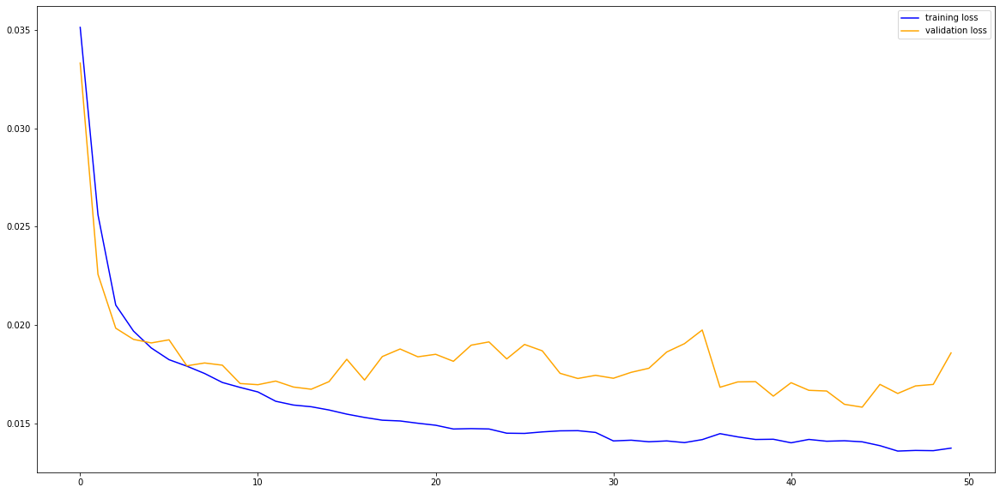

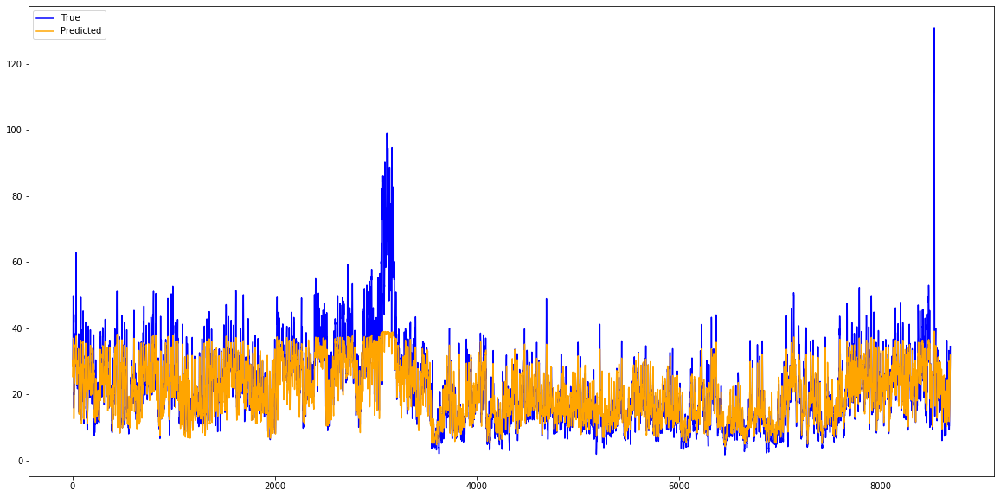

RMSE: 6.446
This took 1083.3471627235413 seconds.
Train on 52608 samples, validate on 8688 samples
Epoch 1/10
52608/52608 [==============================] - 13s 244us/step - loss: 0.0407 - val_loss: 0.0356
Epoch 2/10
52608/52608 [==============================] - 10s 186us/step - loss: 0.0323 - val_loss: 0.0409
Epoch 3/10
52608/52608 [==============================] - 10s 181us/step - loss: 0.0314 - val_loss: 0.0439
Epoch 4/10
52608/52608 [==============================] - 10s 181us/step - loss: 0.0293 - val_loss: 0.0286
Epoch 5/10
52608/52608 [==============================] - 10s 185us/step - loss: 0.0259 - val_loss: 0.0234
Epoch 6/10
52608/52608 [==============================] - 10s 188us/step - loss: 0.0232 - val_loss: 0.0217
Epoch 7/10
52608/52608 [==============================] - 10s 182us/step - loss: 0.0212 - val_loss: 0.0195
Epoch 8/10
52608/52608 [==============================] - 10s 185us/step - loss: 0.0198 - val_loss: 0.0188
Epoch 9/10
52608/52608 [=====================

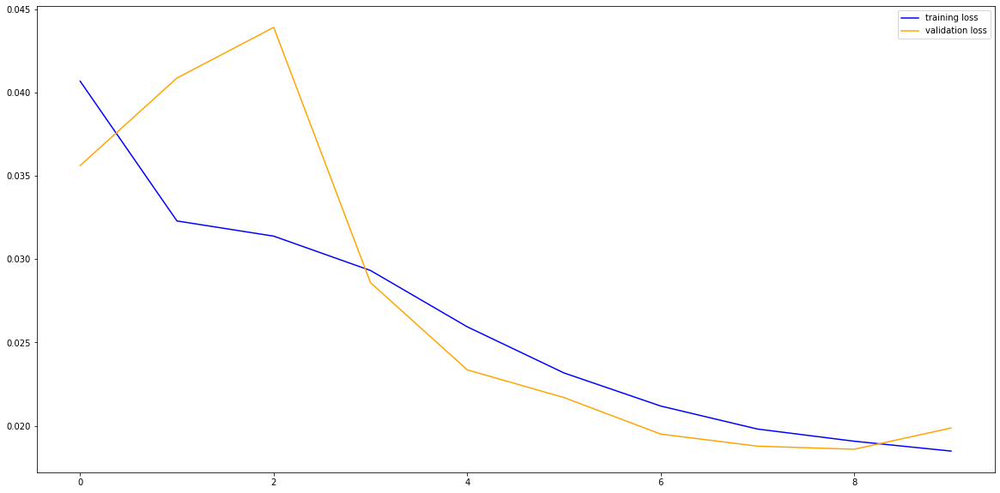

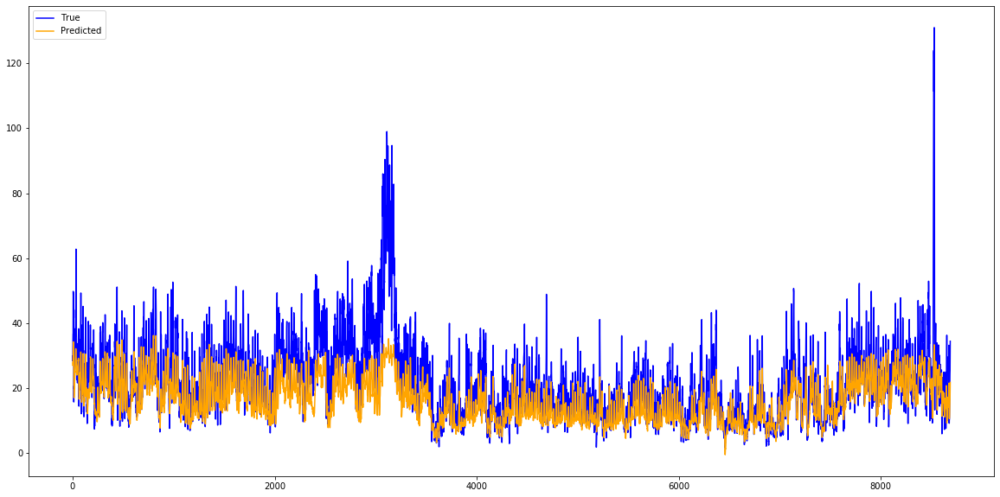

RMSE: 9.477
This took 115.35528874397278 seconds.
Train on 52608 samples, validate on 8688 samples
Epoch 1/30
52608/52608 [==============================] - 13s 248us/step - loss: 0.0404 - val_loss: 0.0563
Epoch 2/30
52608/52608 [==============================] - 9s 178us/step - loss: 0.0316 - val_loss: 0.0431
Epoch 3/30
52608/52608 [==============================] - 10s 181us/step - loss: 0.0305 - val_loss: 0.0448
Epoch 4/30
52608/52608 [==============================] - 10s 182us/step - loss: 0.0294 - val_loss: 0.0381
Epoch 5/30
52608/52608 [==============================] - 9s 180us/step - loss: 0.0266 - val_loss: 0.0227
Epoch 6/30
52608/52608 [==============================] - 10s 182us/step - loss: 0.0218 - val_loss: 0.0203
Epoch 7/30
52608/52608 [==============================] - 10s 182us/step - loss: 0.0206 - val_loss: 0.0192
Epoch 8/30
52608/52608 [==============================] - 10s 185us/step - loss: 0.0199 - val_loss: 0.0187
Epoch 9/30
52608/52608 [=======================

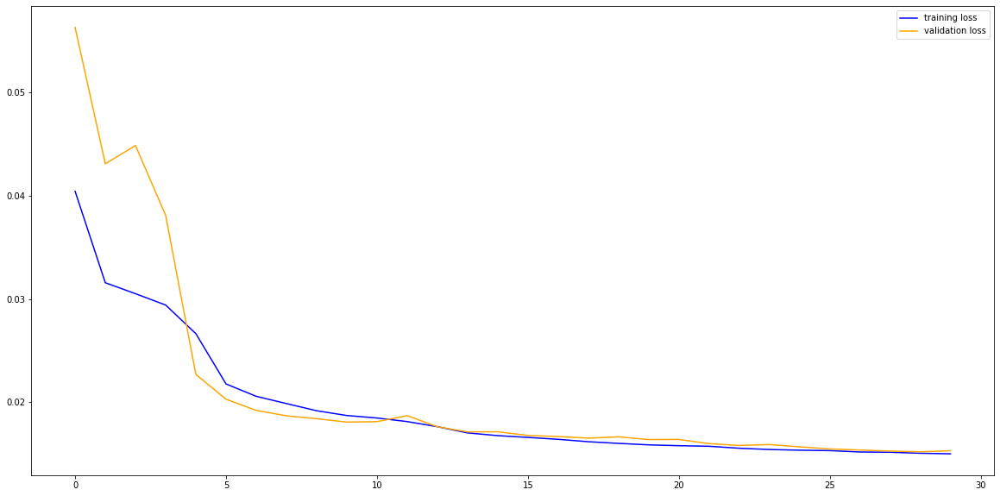

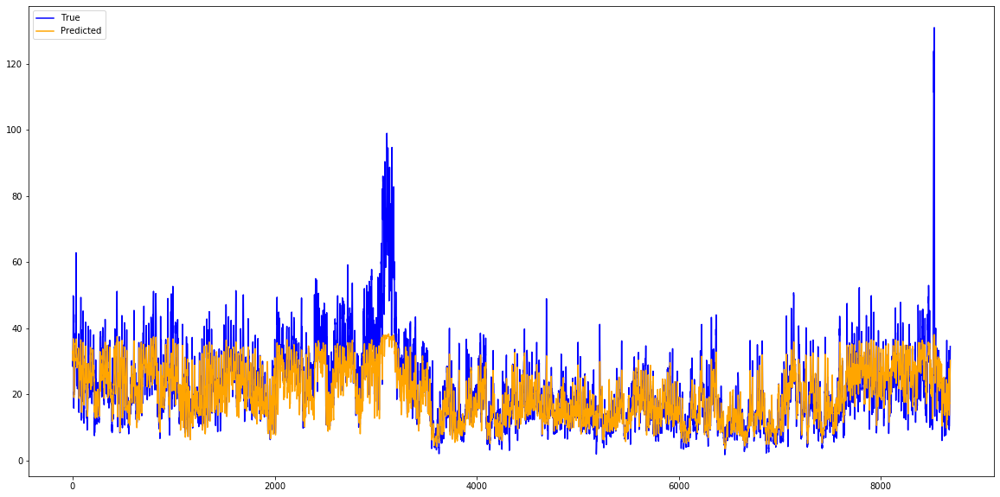

RMSE: 6.971
This took 308.33274149894714 seconds.
Train on 52608 samples, validate on 8688 samples
Epoch 1/50
52608/52608 [==============================] - 13s 254us/step - loss: 0.0378 - val_loss: 0.0328
Epoch 2/50
52608/52608 [==============================] - 10s 181us/step - loss: 0.0329 - val_loss: 0.0300
Epoch 3/50
52608/52608 [==============================] - 10s 185us/step - loss: 0.0312 - val_loss: 0.0333
Epoch 4/50
52608/52608 [==============================] - 10s 183us/step - loss: 0.0290 - val_loss: 0.0250
Epoch 5/50
52608/52608 [==============================] - 10s 183us/step - loss: 0.0233 - val_loss: 0.0220
Epoch 6/50
52608/52608 [==============================] - 10s 186us/step - loss: 0.0215 - val_loss: 0.0208
Epoch 7/50
52608/52608 [==============================] - 10s 185us/step - loss: 0.0196 - val_loss: 0.0211
Epoch 8/50
52608/52608 [==============================] - 10s 185us/step - loss: 0.0189 - val_loss: 0.0212
Epoch 9/50
52608/52608 [=====================

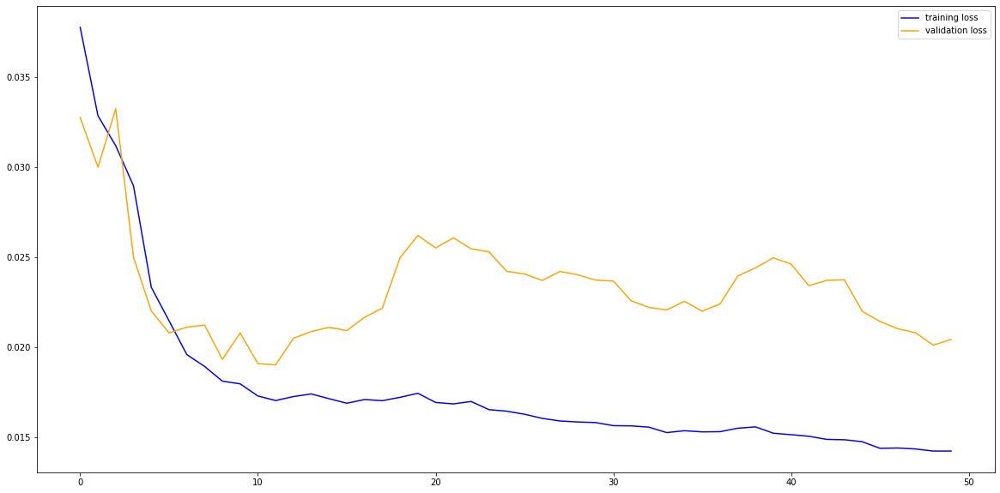

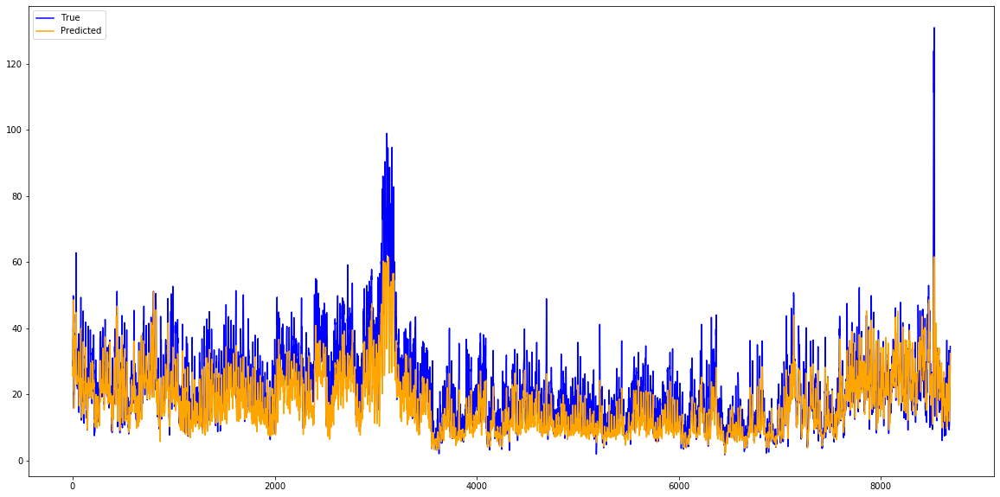

RMSE: 7.551
This took 507.8472557067871 seconds.
Train on 52608 samples, validate on 8688 samples
Epoch 1/10
52608/52608 [==============================] - 9s 170us/step - loss: 0.0780 - val_loss: 0.0309
Epoch 2/10
52608/52608 [==============================] - 5s 98us/step - loss: 0.0297 - val_loss: 0.0268
Epoch 3/10
52608/52608 [==============================] - 5s 100us/step - loss: 0.0273 - val_loss: 0.0241
Epoch 4/10
52608/52608 [==============================] - 5s 97us/step - loss: 0.0255 - val_loss: 0.0258
Epoch 5/10
52608/52608 [==============================] - 5s 97us/step - loss: 0.0255 - val_loss: 0.0245
Epoch 6/10
52608/52608 [==============================] - 5s 98us/step - loss: 0.0249 - val_loss: 0.0244
Epoch 7/10
52608/52608 [==============================] - 5s 98us/step - loss: 0.0229 - val_loss: 0.0210
Epoch 8/10
52608/52608 [==============================] - 5s 103us/step - loss: 0.0214 - val_loss: 0.0220
Epoch 9/10
52608/52608 [==============================] - 5

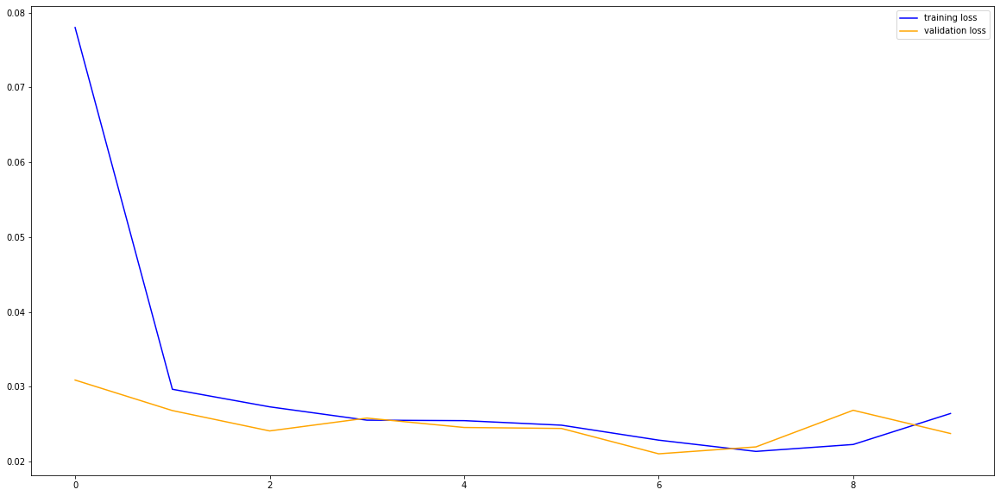

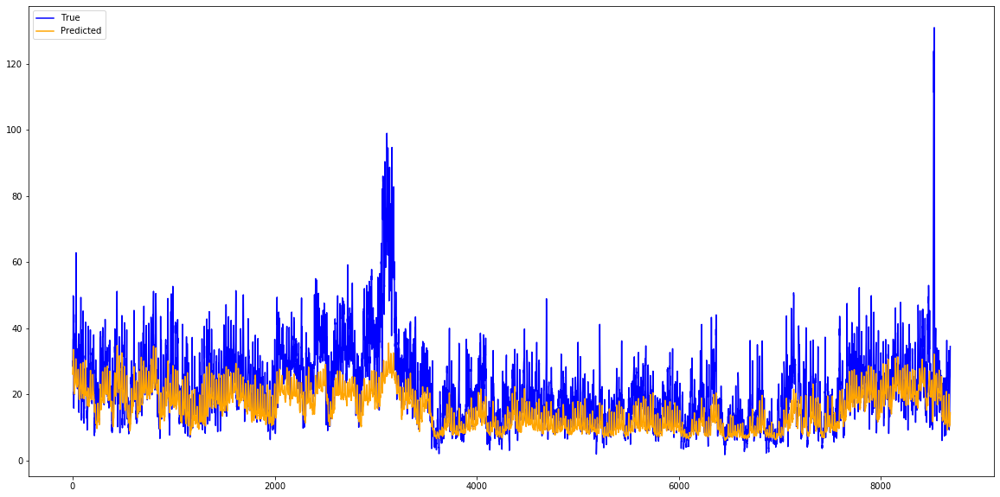

RMSE: 10.485
This took 71.69826889038086 seconds.
Train on 52608 samples, validate on 8688 samples
Epoch 1/30
52608/52608 [==============================] - 9s 177us/step - loss: 0.0571 - val_loss: 0.0256
Epoch 2/30
52608/52608 [==============================] - 5s 98us/step - loss: 0.0267 - val_loss: 0.0242
Epoch 3/30
52608/52608 [==============================] - 5s 99us/step - loss: 0.0248 - val_loss: 0.0224
Epoch 4/30
52608/52608 [==============================] - 5s 100us/step - loss: 0.0229 - val_loss: 0.0272
Epoch 5/30
52608/52608 [==============================] - 5s 103us/step - loss: 0.0252 - val_loss: 0.0464
Epoch 6/30
52608/52608 [==============================] - 5s 102us/step - loss: 0.0292 - val_loss: 0.0302
Epoch 7/30
52608/52608 [==============================] - 6s 106us/step - loss: 0.0254 - val_loss: 0.0359
Epoch 8/30
52608/52608 [==============================] - 5s 103us/step - loss: 0.0239 - val_loss: 0.0335
Epoch 9/30
52608/52608 [==============================]

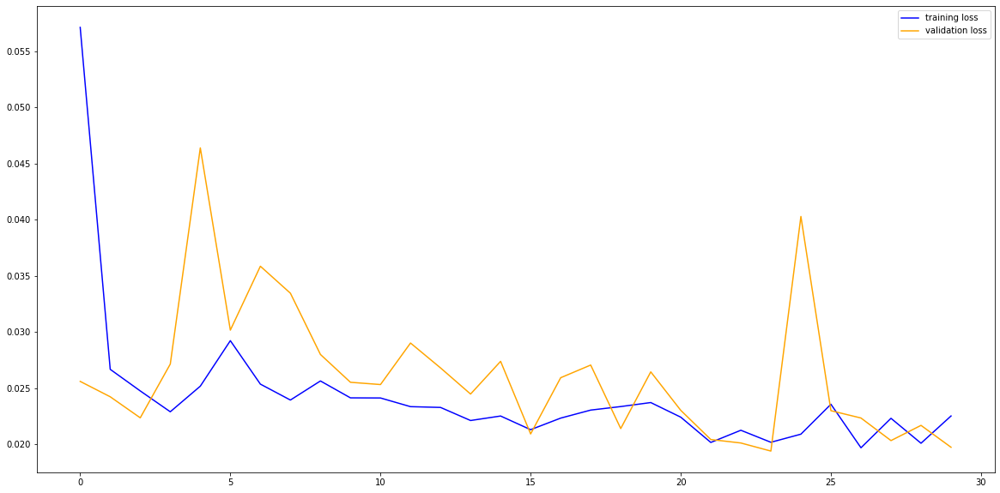

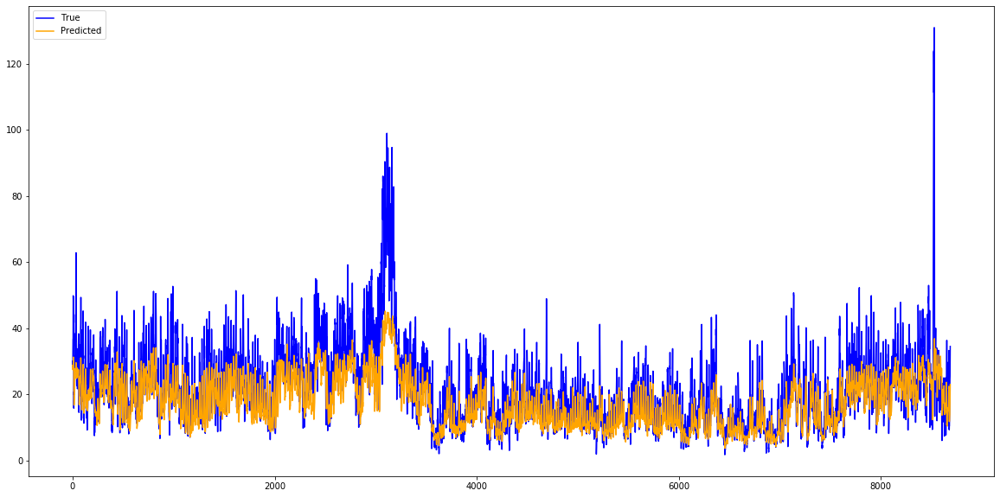

RMSE: 8.237
This took 182.15051102638245 seconds.
Train on 52608 samples, validate on 8688 samples
Epoch 1/50
52608/52608 [==============================] - 9s 173us/step - loss: 0.0608 - val_loss: 0.0295
Epoch 2/50
52608/52608 [==============================] - 5s 100us/step - loss: 0.0276 - val_loss: 0.0266
Epoch 3/50
52608/52608 [==============================] - 5s 102us/step - loss: 0.0256 - val_loss: 0.0355
Epoch 4/50
52608/52608 [==============================] - 6s 105us/step - loss: 0.0282 - val_loss: 0.0231
Epoch 5/50
52608/52608 [==============================] - 5s 103us/step - loss: 0.0247 - val_loss: 0.0266
Epoch 6/50
52608/52608 [==============================] - 6s 105us/step - loss: 0.0248 - val_loss: 0.0249
Epoch 7/50
52608/52608 [==============================] - 5s 101us/step - loss: 0.0229 - val_loss: 0.0206
Epoch 8/50
52608/52608 [==============================] - 5s 101us/step - loss: 0.0211 - val_loss: 0.0234
Epoch 9/50
52608/52608 [=============================

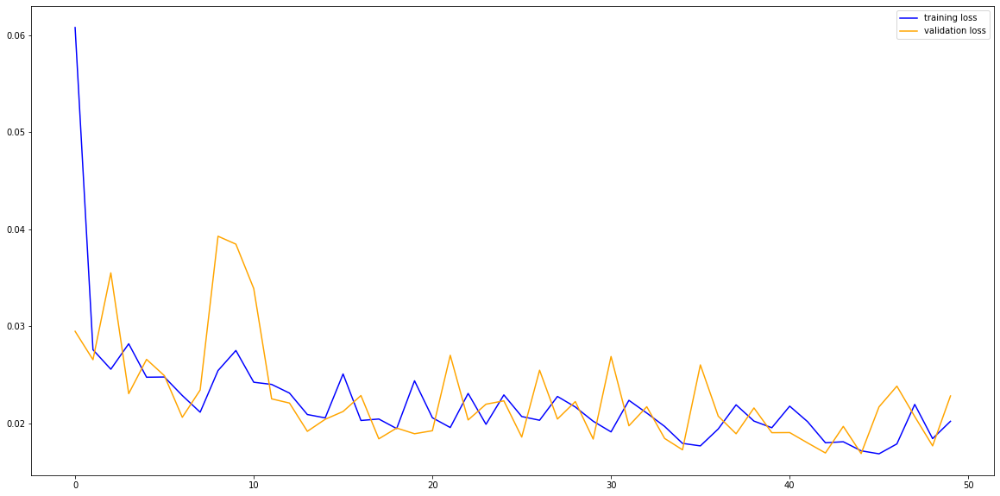

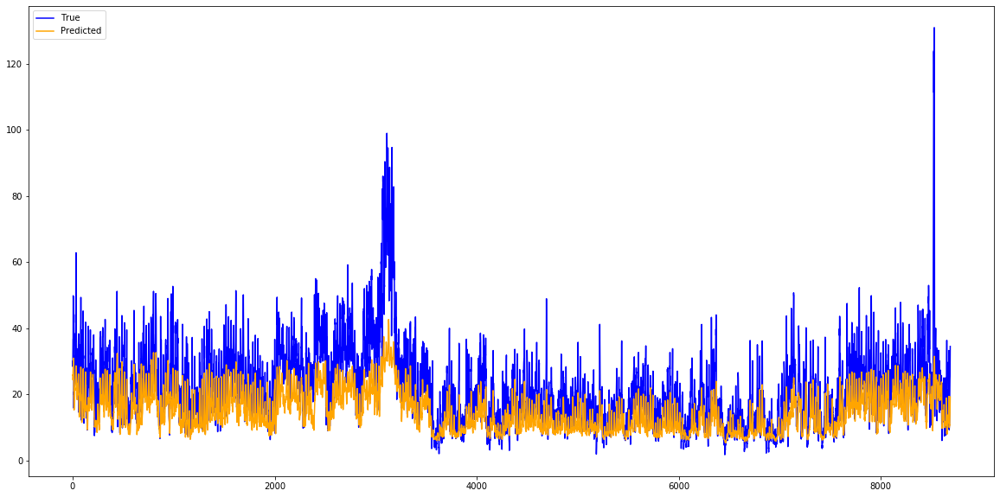

RMSE: 10.209
This took 295.610324382782 seconds.
Train on 52608 samples, validate on 8688 samples
Epoch 1/10
52608/52608 [==============================] - 46s 872us/step - loss: 0.0586 - val_loss: 0.0603
Epoch 2/10
52608/52608 [==============================] - 43s 817us/step - loss: 0.0492 - val_loss: 0.0585
Epoch 3/10
52608/52608 [==============================] - 43s 823us/step - loss: 0.0442 - val_loss: 0.0508
Epoch 4/10
52608/52608 [==============================] - 43s 821us/step - loss: 0.0395 - val_loss: 0.0481
Epoch 5/10
52608/52608 [==============================] - 44s 830us/step - loss: 0.0366 - val_loss: 0.0494
Epoch 6/10
52608/52608 [==============================] - 43s 817us/step - loss: 0.0342 - val_loss: 0.0476
Epoch 7/10
52608/52608 [==============================] - 44s 827us/step - loss: 0.0329 - val_loss: 0.0486
Epoch 8/10
52608/52608 [==============================] - 43s 817us/step - loss: 0.0319 - val_loss: 0.0487
Epoch 9/10
52608/52608 [======================

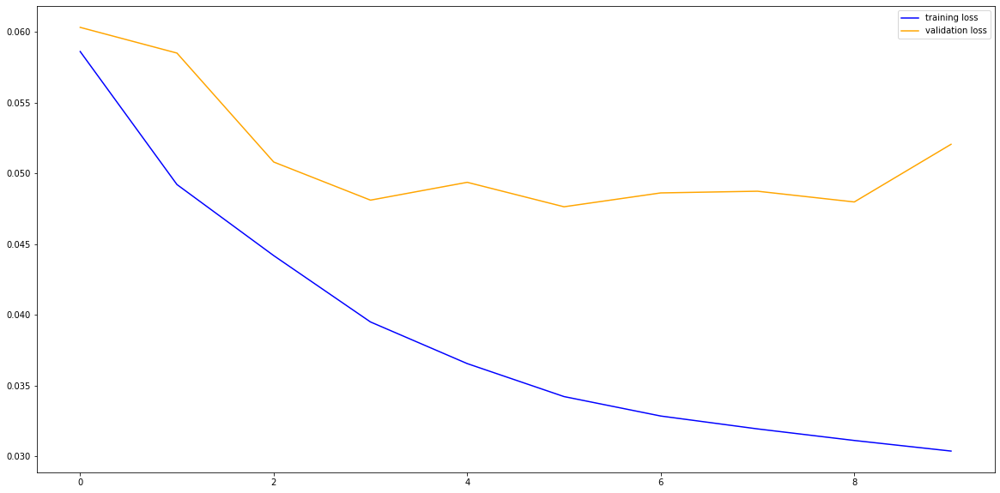

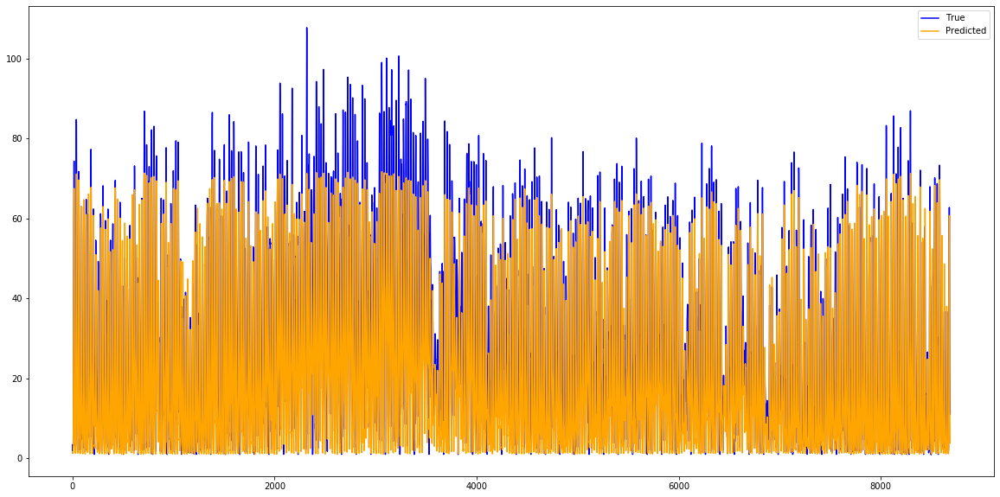

RMSE: 9.110
This took 455.61450386047363 seconds.
Train on 52608 samples, validate on 8688 samples
Epoch 1/30
52608/52608 [==============================] - 46s 882us/step - loss: 0.0571 - val_loss: 0.0548
Epoch 2/30
52608/52608 [==============================] - 45s 853us/step - loss: 0.0479 - val_loss: 0.0517
Epoch 3/30
52608/52608 [==============================] - 45s 853us/step - loss: 0.0428 - val_loss: 0.0502
Epoch 4/30
52608/52608 [==============================] - 45s 855us/step - loss: 0.0395 - val_loss: 0.0463
Epoch 5/30
52608/52608 [==============================] - 45s 851us/step - loss: 0.0371 - val_loss: 0.0550
Epoch 6/30
52608/52608 [==============================] - 45s 858us/step - loss: 0.0350 - val_loss: 0.0495s - loss:
Epoch 7/30
52608/52608 [==============================] - 44s 846us/step - loss: 0.0338 - val_loss: 0.0470
Epoch 8/30
52608/52608 [==============================] - 45s 855us/step - loss: 0.0327 - val_loss: 0.0484
Epoch 9/30
52608/52608 [============

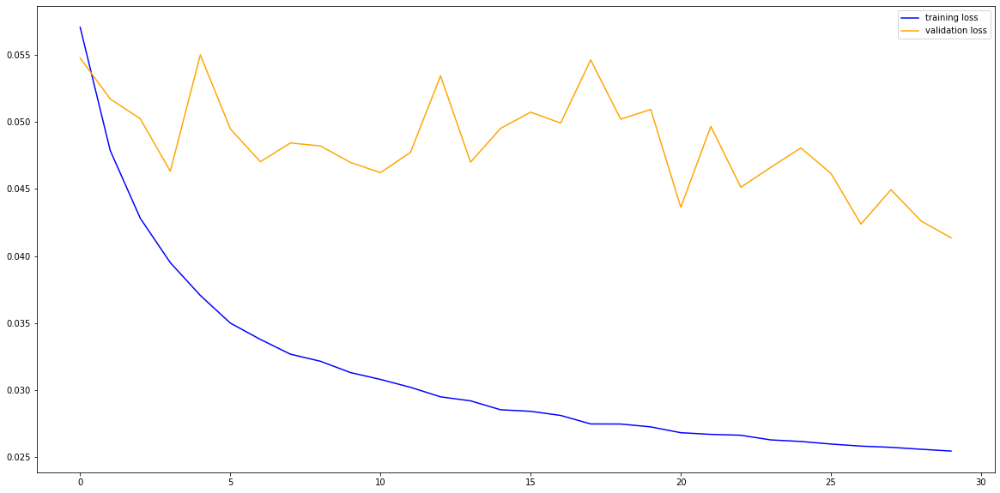

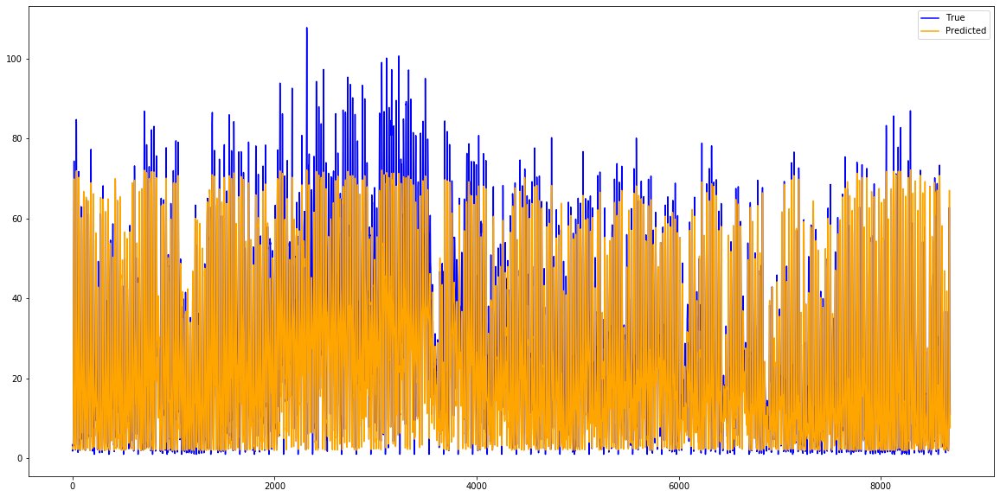

RMSE: 6.754
This took 1368.8885056972504 seconds.
Train on 52608 samples, validate on 8688 samples
Epoch 1/50
52608/52608 [==============================] - 52s 998us/step - loss: 0.0587 - val_loss: 0.0536
Epoch 2/50
52608/52608 [==============================] - 45s 857us/step - loss: 0.0486 - val_loss: 0.0506
Epoch 3/50
52608/52608 [==============================] - 45s 851us/step - loss: 0.0436 - val_loss: 0.0453
Epoch 4/50
52608/52608 [==============================] - 46s 870us/step - loss: 0.0392 - val_loss: 0.0426
Epoch 5/50
52608/52608 [==============================] - 46s 872us/step - loss: 0.0367 - val_loss: 0.0476
Epoch 6/50
52608/52608 [==============================] - 47s 888us/step - loss: 0.0350 - val_loss: 0.0492
Epoch 7/50
52608/52608 [==============================] - 46s 870us/step - loss: 0.0338 - val_loss: 0.0502
Epoch 8/50
52608/52608 [==============================] - 46s 879us/step - loss: 0.0335 - val_loss: 0.0425
Epoch 9/50
52608/52608 [=====================

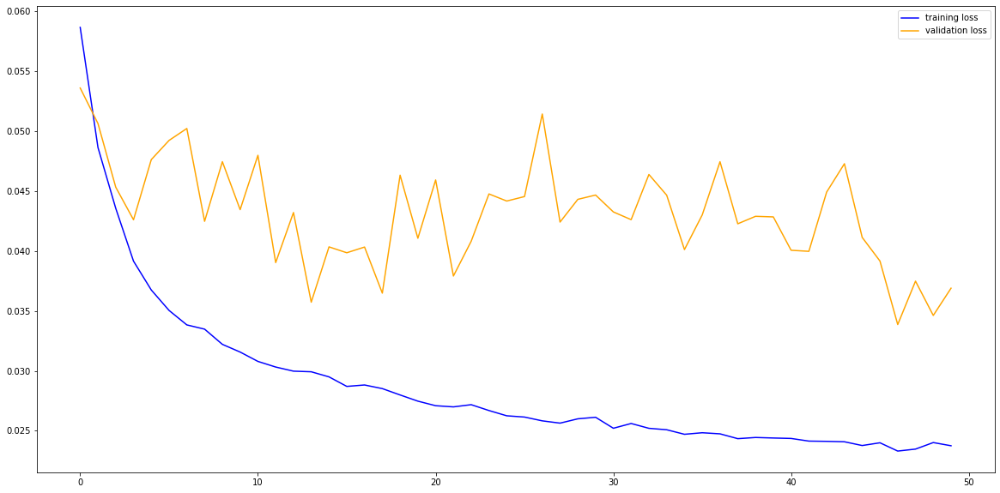

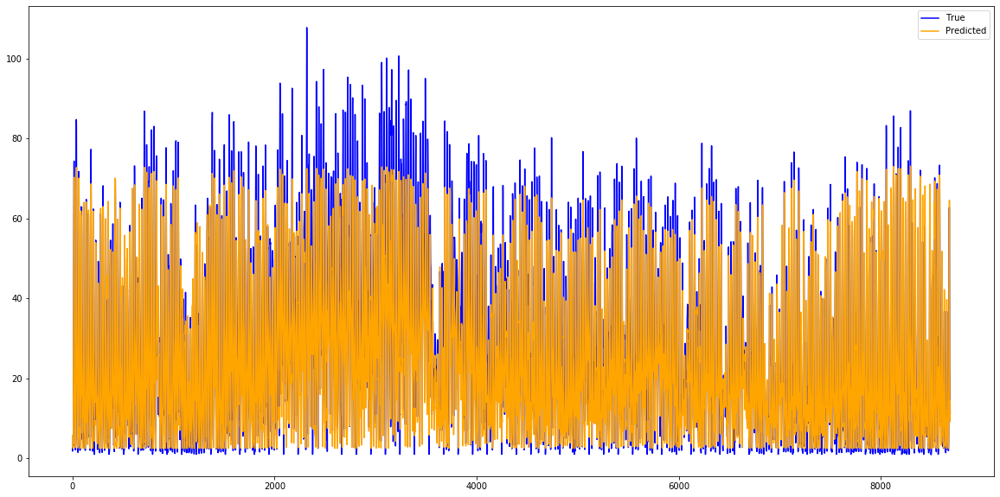

RMSE: 6.580
This took 2307.2039272785187 seconds.
Train on 52608 samples, validate on 8688 samples
Epoch 1/10
52608/52608 [==============================] - 30s 561us/step - loss: 0.0584 - val_loss: 0.0619
Epoch 2/10
52608/52608 [==============================] - 25s 484us/step - loss: 0.0477 - val_loss: 0.0573
Epoch 3/10
52608/52608 [==============================] - 25s 482us/step - loss: 0.0433 - val_loss: 0.0470
Epoch 4/10
52608/52608 [==============================] - 26s 486us/step - loss: 0.0393 - val_loss: 0.0418
Epoch 5/10
52608/52608 [==============================] - 25s 482us/step - loss: 0.0371 - val_loss: 0.0371
Epoch 6/10
52608/52608 [==============================] - 25s 484us/step - loss: 0.0349 - val_loss: 0.0366
Epoch 7/10
52608/52608 [==============================] - 26s 491us/step - loss: 0.0329 - val_loss: 0.0345
Epoch 8/10
52608/52608 [==============================] - 25s 482us/step - loss: 0.0323 - val_loss: 0.0326
Epoch 9/10
52608/52608 [=====================

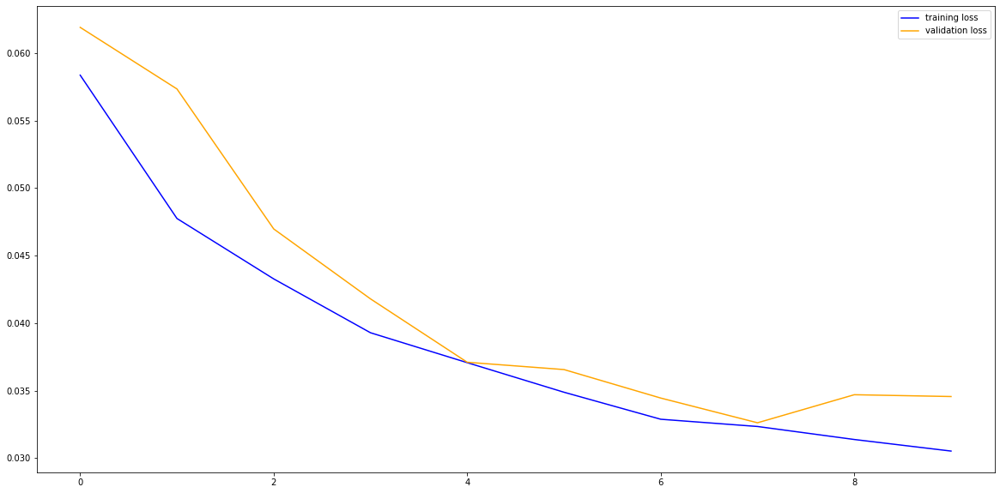

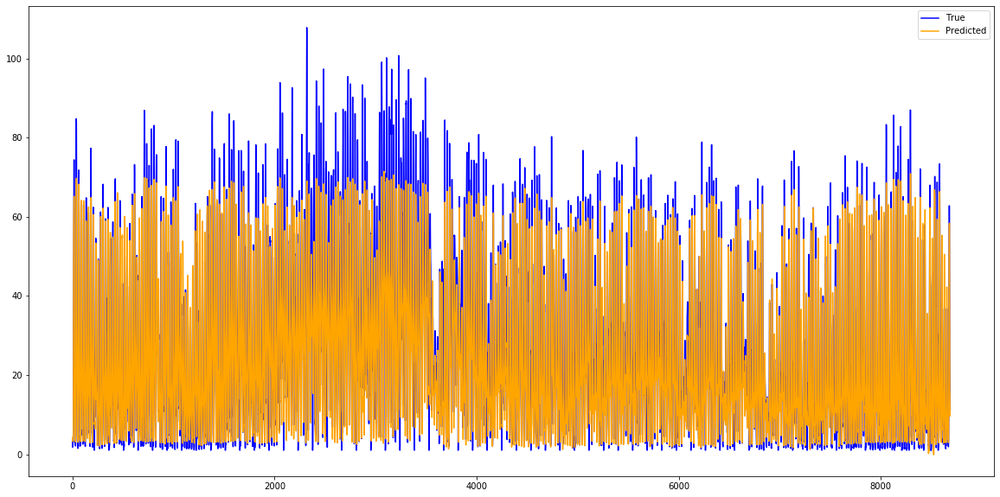

RMSE: 7.067
This took 275.87481451034546 seconds.
Train on 52608 samples, validate on 8688 samples
Epoch 1/30
52608/52608 [==============================] - 30s 575us/step - loss: 0.0598 - val_loss: 0.0655
Epoch 2/30
52608/52608 [==============================] - 26s 485us/step - loss: 0.0486 - val_loss: 0.0589
Epoch 3/30
52608/52608 [==============================] - 25s 483us/step - loss: 0.0437 - val_loss: 0.0467
Epoch 4/30
52608/52608 [==============================] - 26s 486us/step - loss: 0.0400 - val_loss: 0.0401
Epoch 5/30
52608/52608 [==============================] - 26s 496us/step - loss: 0.0370 - val_loss: 0.0380
Epoch 6/30
52608/52608 [==============================] - 25s 477us/step - loss: 0.0348 - val_loss: 0.0361
Epoch 7/30
52608/52608 [==============================] - 25s 481us/step - loss: 0.0328 - val_loss: 0.0342
Epoch 8/30
52608/52608 [==============================] - 25s 480us/step - loss: 0.0319 - val_loss: 0.0331
Epoch 9/30
52608/52608 [=====================

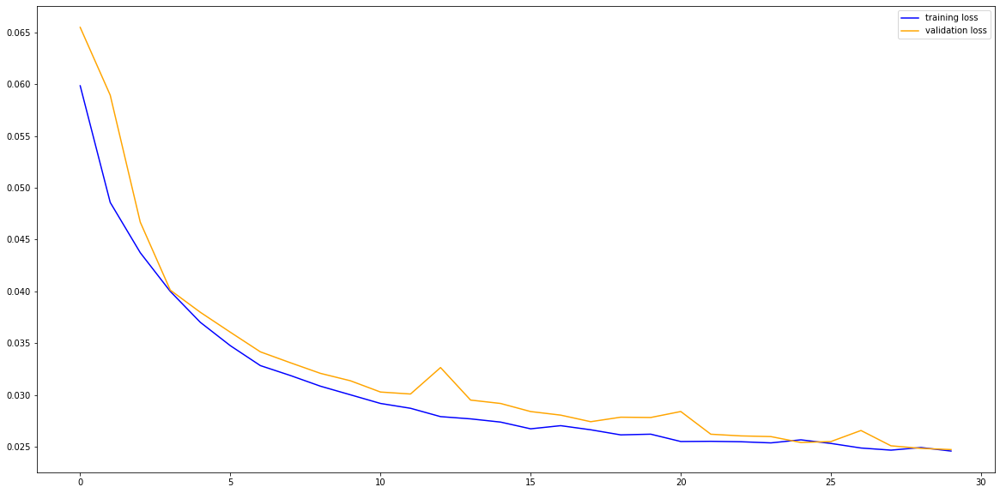

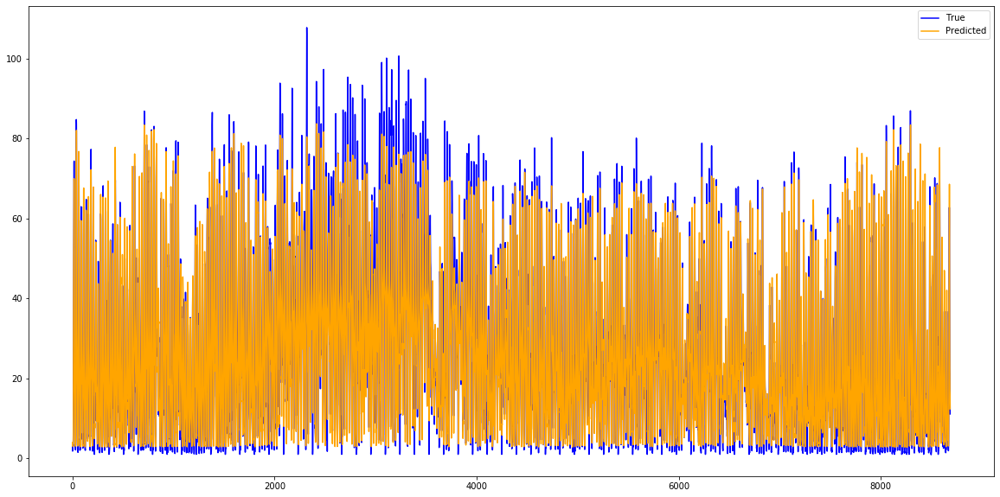

RMSE: 5.509
This took 786.372317314148 seconds.
Train on 52608 samples, validate on 8688 samples
Epoch 1/50
52608/52608 [==============================] - 31s 595us/step - loss: 0.0594 - val_loss: 0.0631
Epoch 2/50
52608/52608 [==============================] - 26s 502us/step - loss: 0.0482 - val_loss: 0.0562
Epoch 3/50
52608/52608 [==============================] - 26s 498us/step - loss: 0.0431 - val_loss: 0.0435
Epoch 4/50
52608/52608 [==============================] - 26s 498us/step - loss: 0.0387 - val_loss: 0.0404
Epoch 5/50
52608/52608 [==============================] - 26s 502us/step - loss: 0.0355 - val_loss: 0.0360
Epoch 6/50
52608/52608 [==============================] - 26s 497us/step - loss: 0.0333 - val_loss: 0.0344
Epoch 7/50
52608/52608 [==============================] - 26s 502us/step - loss: 0.0321 - val_loss: 0.0341
Epoch 8/50
52608/52608 [==============================] - 26s 494us/step - loss: 0.0309 - val_loss: 0.0322
Epoch 9/50
52608/52608 [=======================

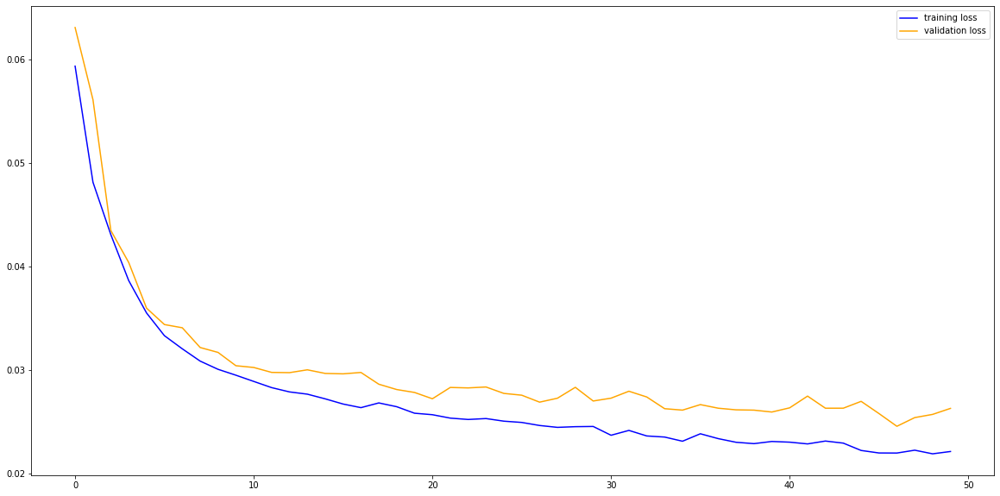

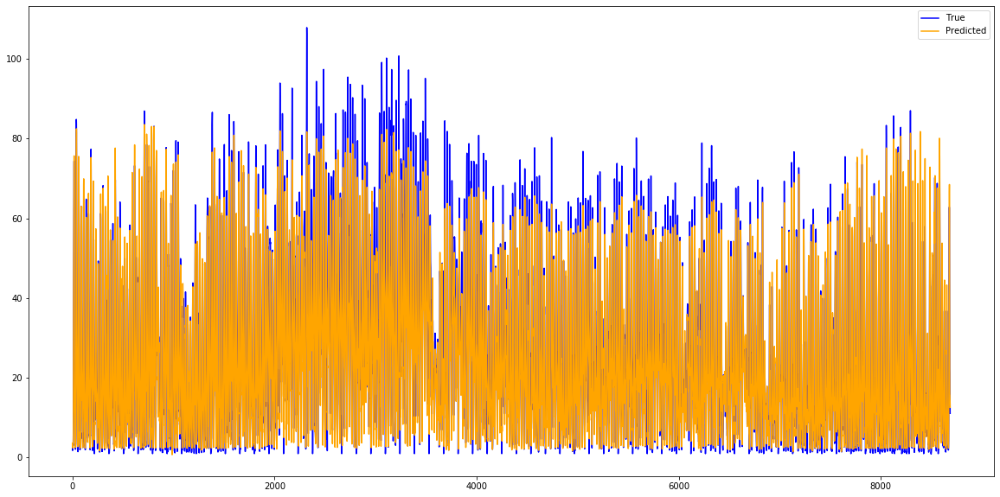

RMSE: 5.717
This took 1338.2524945735931 seconds.
Train on 52608 samples, validate on 8688 samples
Epoch 1/10
52608/52608 [==============================] - 28s 534us/step - loss: 0.0615 - val_loss: 0.0633
Epoch 2/10
52608/52608 [==============================] - 24s 464us/step - loss: 0.0483 - val_loss: 0.0621
Epoch 3/10
52608/52608 [==============================] - 24s 461us/step - loss: 0.0434 - val_loss: 0.0586
Epoch 4/10
52608/52608 [==============================] - 24s 464us/step - loss: 0.0395 - val_loss: 0.0432
Epoch 5/10
52608/52608 [==============================] - 24s 461us/step - loss: 0.0371 - val_loss: 0.0420
Epoch 6/10
52608/52608 [==============================] - 24s 462us/step - loss: 0.0353 - val_loss: 0.0399
Epoch 7/10
52608/52608 [==============================] - 24s 463us/step - loss: 0.0337 - val_loss: 0.0366
Epoch 8/10
52608/52608 [==============================] - 24s 461us/step - loss: 0.0325 - val_loss: 0.0339
Epoch 9/10
52608/52608 [=====================

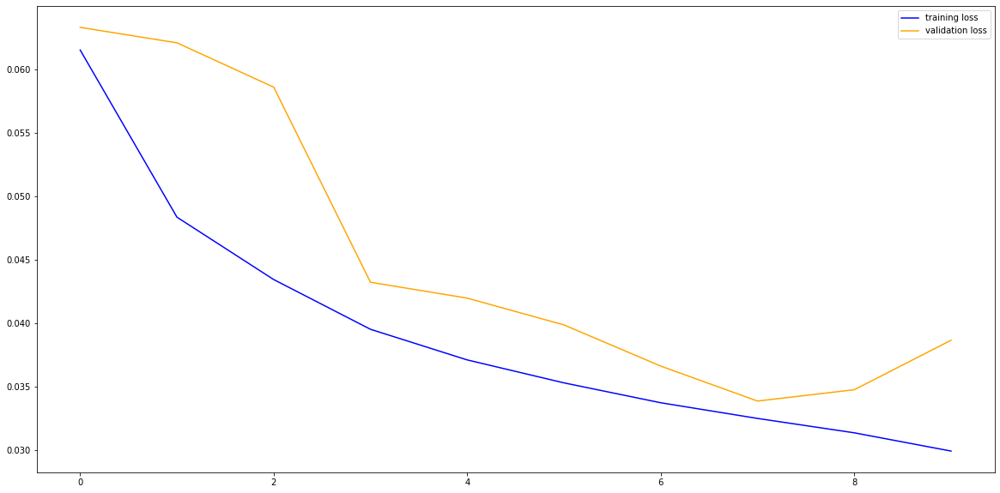

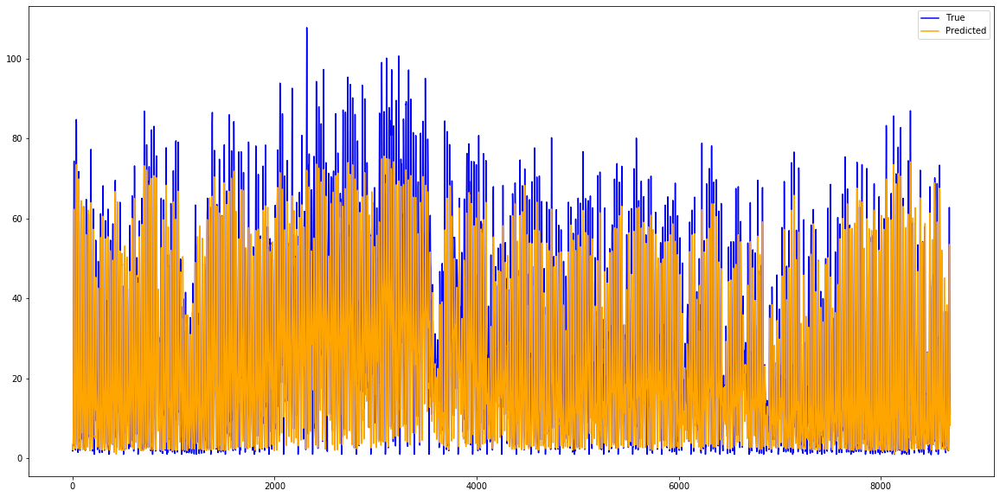

RMSE: 7.586
This took 269.89030504226685 seconds.
Train on 52608 samples, validate on 8688 samples
Epoch 1/30
52608/52608 [==============================] - 28s 530us/step - loss: 0.0618 - val_loss: 0.0594
Epoch 2/30
52608/52608 [==============================] - 23s 443us/step - loss: 0.0487 - val_loss: 0.0588
Epoch 3/30
52608/52608 [==============================] - 23s 445us/step - loss: 0.0436 - val_loss: 0.0640
Epoch 4/30
52608/52608 [==============================] - 23s 446us/step - loss: 0.0393 - val_loss: 0.0467
Epoch 5/30
52608/52608 [==============================] - 24s 447us/step - loss: 0.0366 - val_loss: 0.0400
Epoch 6/30
52608/52608 [==============================] - 24s 458us/step - loss: 0.0348 - val_loss: 0.0354
Epoch 7/30
52608/52608 [==============================] - 23s 445us/step - loss: 0.0335 - val_loss: 0.0355
Epoch 8/30
52608/52608 [==============================] - 24s 453us/step - loss: 0.0327 - val_loss: 0.0334
Epoch 9/30
52608/52608 [=====================

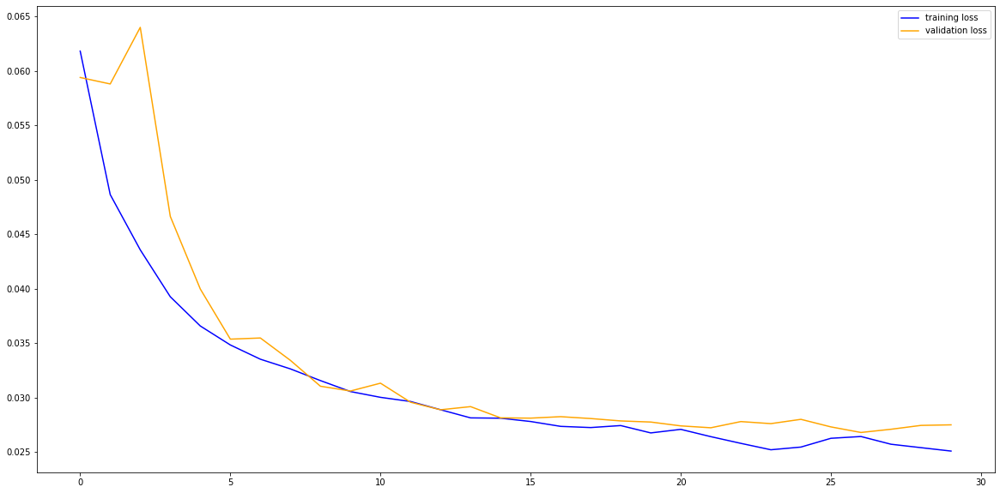

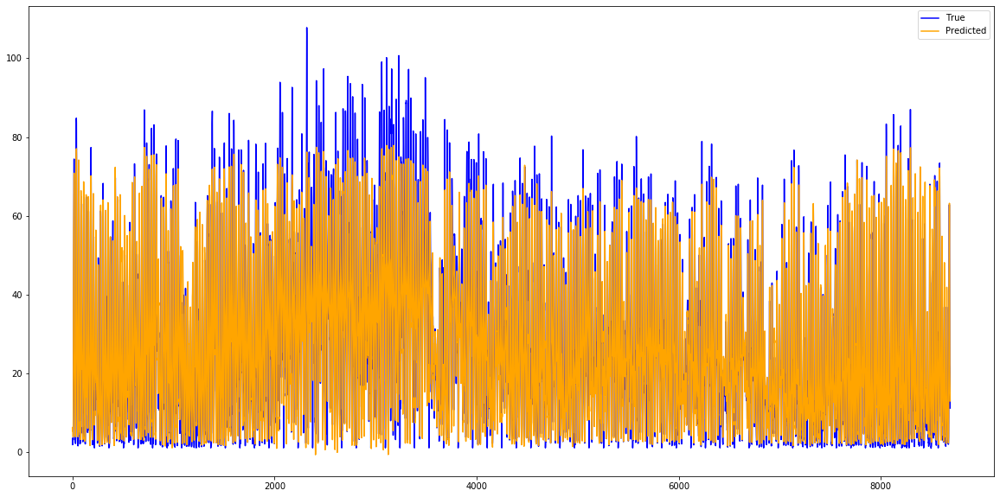

RMSE: 5.616
This took 733.7620584964752 seconds.
Train on 52608 samples, validate on 8688 samples
Epoch 1/50
52608/52608 [==============================] - 28s 539us/step - loss: 0.0623 - val_loss: 0.0636
Epoch 2/50
52608/52608 [==============================] - 24s 452us/step - loss: 0.0491 - val_loss: 0.0638
Epoch 3/50
52608/52608 [==============================] - 24s 457us/step - loss: 0.0443 - val_loss: 0.0613
Epoch 4/50
52608/52608 [==============================] - 24s 452us/step - loss: 0.0402 - val_loss: 0.0455
Epoch 5/50
52608/52608 [==============================] - 24s 460us/step - loss: 0.0370 - val_loss: 0.0381
Epoch 6/50
52608/52608 [==============================] - 24s 452us/step - loss: 0.0350 - val_loss: 0.0352
Epoch 7/50
52608/52608 [==============================] - 24s 458us/step - loss: 0.0333 - val_loss: 0.0340
Epoch 8/50
52608/52608 [==============================] - 24s 450us/step - loss: 0.0322 - val_loss: 0.0370
Epoch 9/50
52608/52608 [======================

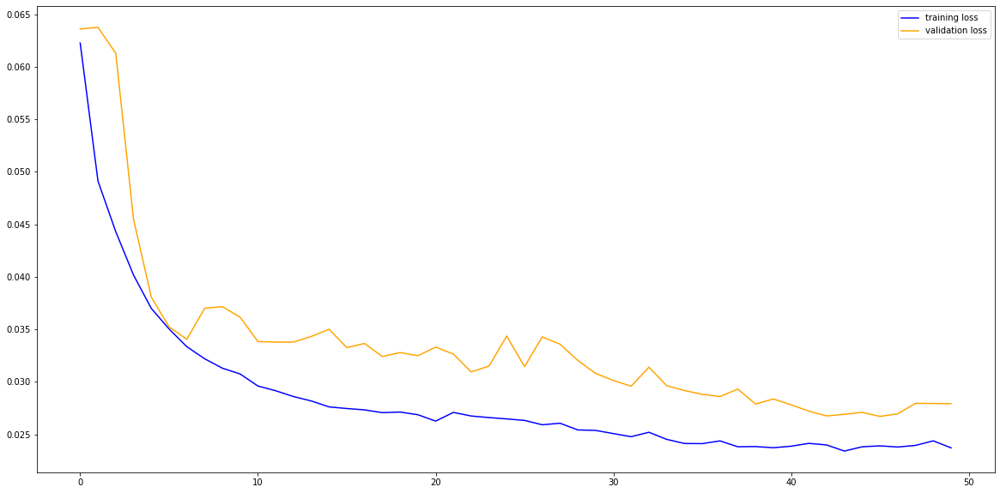

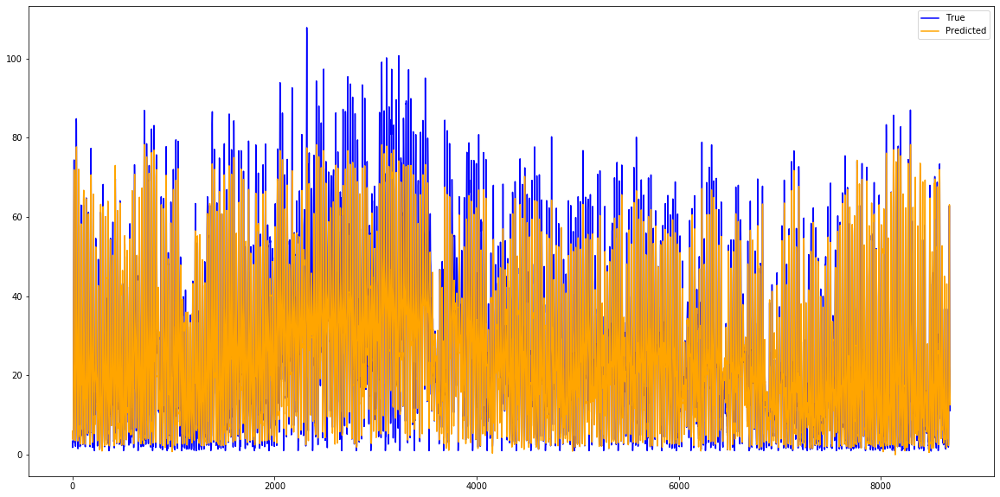

RMSE: 5.717
This took 1219.871494293213 seconds.
Train on 52608 samples, validate on 8688 samples
Epoch 1/10
52608/52608 [==============================] - 16s 299us/step - loss: 0.0669 - val_loss: 0.0957
Epoch 2/10
52608/52608 [==============================] - 11s 218us/step - loss: 0.0558 - val_loss: 0.1037
Epoch 3/10
52608/52608 [==============================] - 11s 216us/step - loss: 0.0521 - val_loss: 0.0983
Epoch 4/10
52608/52608 [==============================] - 12s 229us/step - loss: 0.0504 - val_loss: 0.0874
Epoch 5/10
52608/52608 [==============================] - 11s 217us/step - loss: 0.0490 - val_loss: 0.0808
Epoch 6/10
52608/52608 [==============================] - 11s 215us/step - loss: 0.0494 - val_loss: 0.0716
Epoch 7/10
52608/52608 [==============================] - 11s 214us/step - loss: 0.0480 - val_loss: 0.0746
Epoch 8/10
52608/52608 [==============================] - 11s 217us/step - loss: 0.0446 - val_loss: 0.0699
Epoch 9/10
52608/52608 [======================

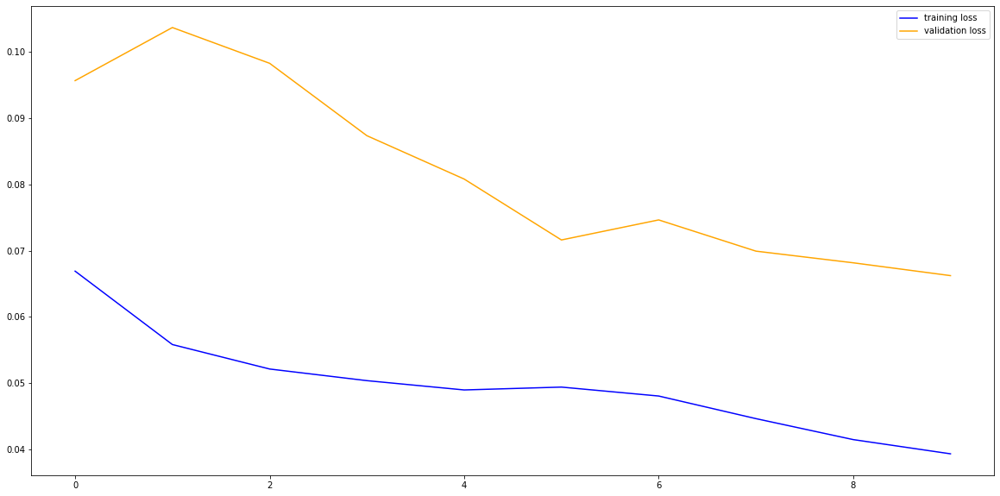

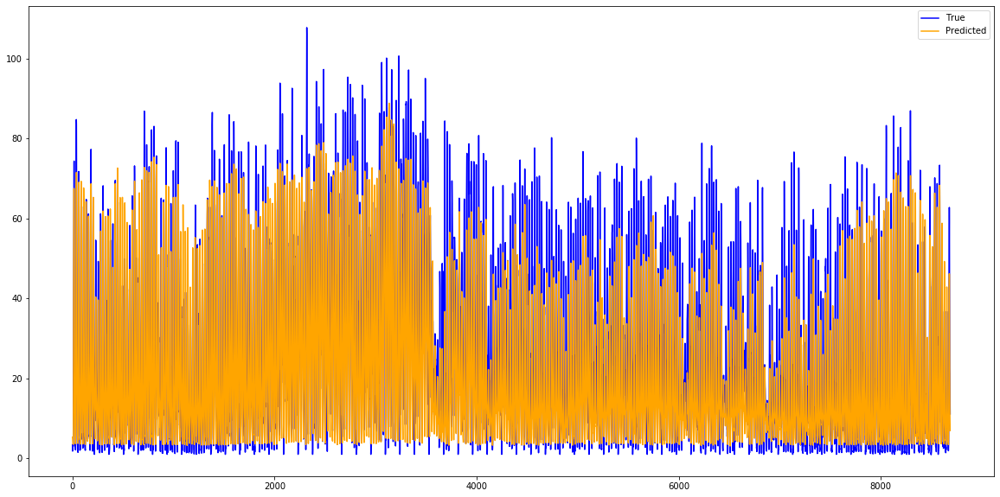

RMSE: 9.754
This took 138.01612448692322 seconds.
Train on 52608 samples, validate on 8688 samples
Epoch 1/30
52608/52608 [==============================] - 16s 306us/step - loss: 0.0735 - val_loss: 0.0956
Epoch 2/30
52608/52608 [==============================] - 11s 218us/step - loss: 0.0550 - val_loss: 0.0953
Epoch 3/30
52608/52608 [==============================] - 12s 219us/step - loss: 0.0525 - val_loss: 0.0937
Epoch 4/30
52608/52608 [==============================] - 11s 217us/step - loss: 0.0513 - val_loss: 0.0900
Epoch 5/30
52608/52608 [==============================] - 12s 220us/step - loss: 0.0507 - val_loss: 0.0904
Epoch 6/30
52608/52608 [==============================] - 12s 219us/step - loss: 0.0502 - val_loss: 0.0812
Epoch 7/30
52608/52608 [==============================] - 12s 222us/step - loss: 0.0486 - val_loss: 0.0764
Epoch 8/30
52608/52608 [==============================] - 12s 221us/step - loss: 0.0474 - val_loss: 0.0744
Epoch 9/30
52608/52608 [=====================

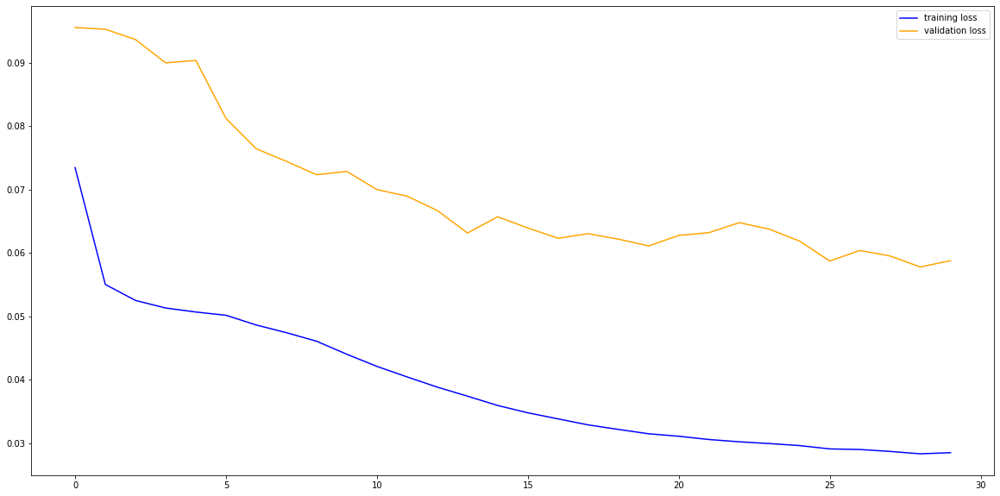

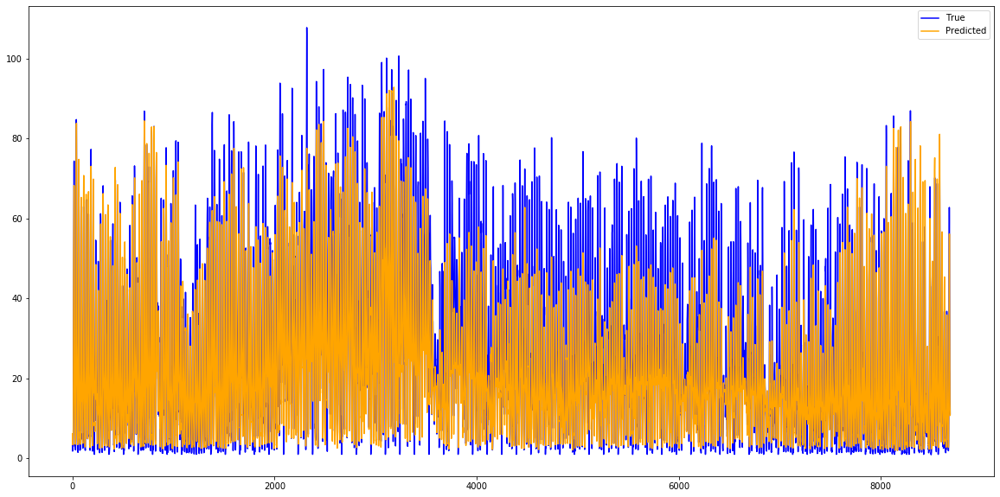

RMSE: 9.089
This took 371.3192207813263 seconds.
Train on 52608 samples, validate on 8688 samples
Epoch 1/50
52608/52608 [==============================] - 16s 310us/step - loss: 0.0727 - val_loss: 0.1033
Epoch 2/50
52608/52608 [==============================] - 11s 216us/step - loss: 0.0565 - val_loss: 0.1002
Epoch 3/50
52608/52608 [==============================] - 12s 223us/step - loss: 0.0521 - val_loss: 0.1019
Epoch 4/50
52608/52608 [==============================] - 12s 223us/step - loss: 0.0505 - val_loss: 0.0930
Epoch 5/50
52608/52608 [==============================] - 12s 224us/step - loss: 0.0506 - val_loss: 0.0849
Epoch 6/50
52608/52608 [==============================] - 12s 230us/step - loss: 0.0504 - val_loss: 0.0796
Epoch 7/50
52608/52608 [==============================] - 12s 224us/step - loss: 0.0477 - val_loss: 0.0912
Epoch 8/50
52608/52608 [==============================] - 12s 222us/step - loss: 0.0455 - val_loss: 0.0853
Epoch 9/50
52608/52608 [======================

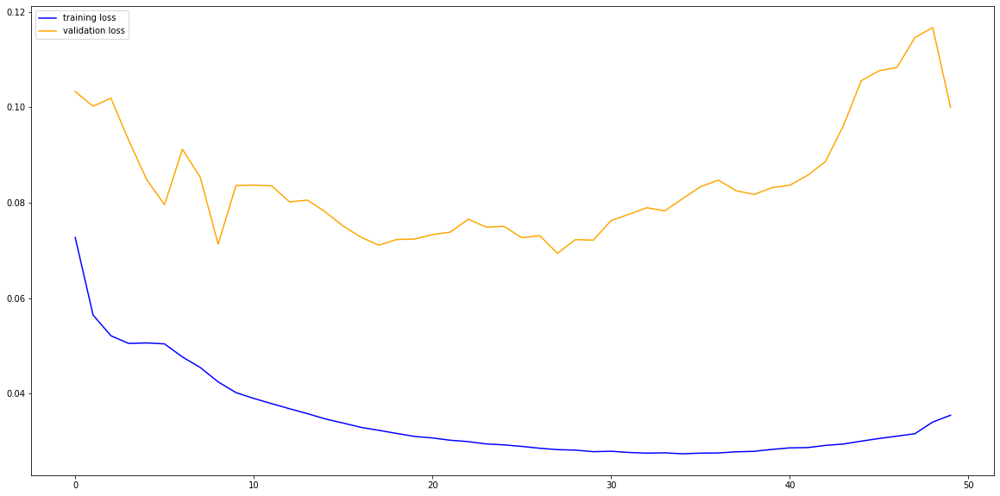

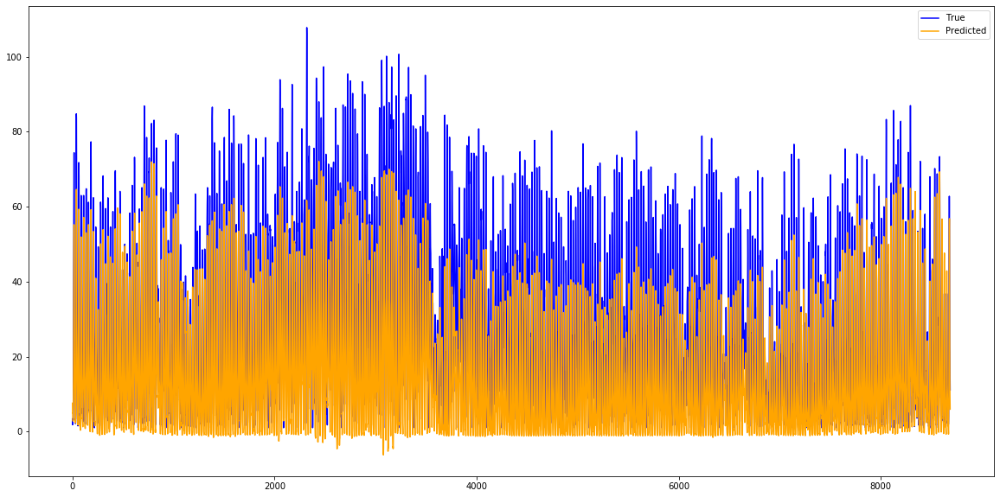

RMSE: 15.358
This took 613.3776173591614 seconds.
Train on 52608 samples, validate on 8688 samples
Epoch 1/10
52608/52608 [==============================] - 11s 216us/step - loss: 0.1164 - val_loss: 0.0679
Epoch 2/10
52608/52608 [==============================] - 6s 115us/step - loss: 0.0666 - val_loss: 0.0497
Epoch 3/10
52608/52608 [==============================] - 6s 115us/step - loss: 0.0545 - val_loss: 0.0660
Epoch 4/10
52608/52608 [==============================] - 6s 118us/step - loss: 0.0599 - val_loss: 0.0476
Epoch 5/10
52608/52608 [==============================] - 6s 120us/step - loss: 0.0539 - val_loss: 0.0533
Epoch 6/10
52608/52608 [==============================] - 6s 117us/step - loss: 0.0537 - val_loss: 0.0462
Epoch 7/10
52608/52608 [==============================] - 6s 117us/step - loss: 0.0512 - val_loss: 0.0491
Epoch 8/10
52608/52608 [==============================] - 6s 119us/step - loss: 0.0516 - val_loss: 0.0460
Epoch 9/10
52608/52608 [============================

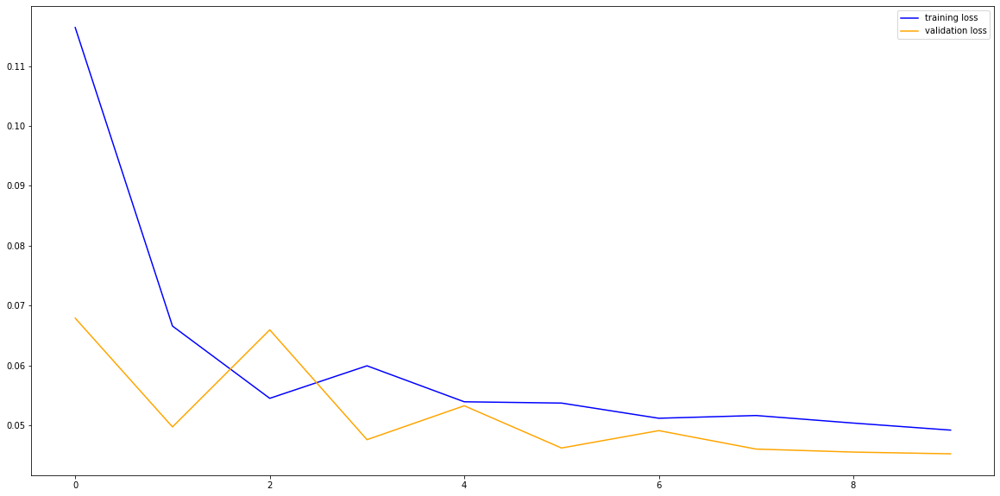

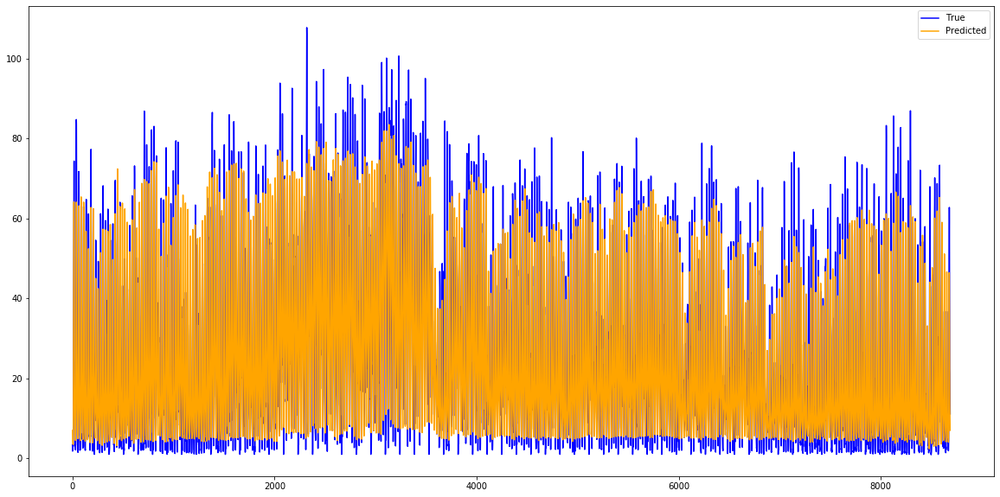

RMSE: 7.649
This took 87.11331605911255 seconds.
Train on 52608 samples, validate on 8688 samples
Epoch 1/30
52608/52608 [==============================] - 12s 219us/step - loss: 0.1077 - val_loss: 0.0509
Epoch 2/30
52608/52608 [==============================] - 6s 119us/step - loss: 0.0592 - val_loss: 0.0614
Epoch 3/30
52608/52608 [==============================] - 6s 117us/step - loss: 0.0621 - val_loss: 0.0519
Epoch 4/30
52608/52608 [==============================] - 6s 121us/step - loss: 0.0552 - val_loss: 0.0459
Epoch 5/30
52608/52608 [==============================] - 6s 119us/step - loss: 0.0525 - val_loss: 0.0532
Epoch 6/30
52608/52608 [==============================] - 6s 119us/step - loss: 0.0502 - val_loss: 0.0456
Epoch 7/30
52608/52608 [==============================] - 6s 121us/step - loss: 0.0487 - val_loss: 0.0428
Epoch 8/30
52608/52608 [==============================] - 6s 119us/step - loss: 0.0453 - val_loss: 0.0454
Epoch 9/30
52608/52608 [=============================

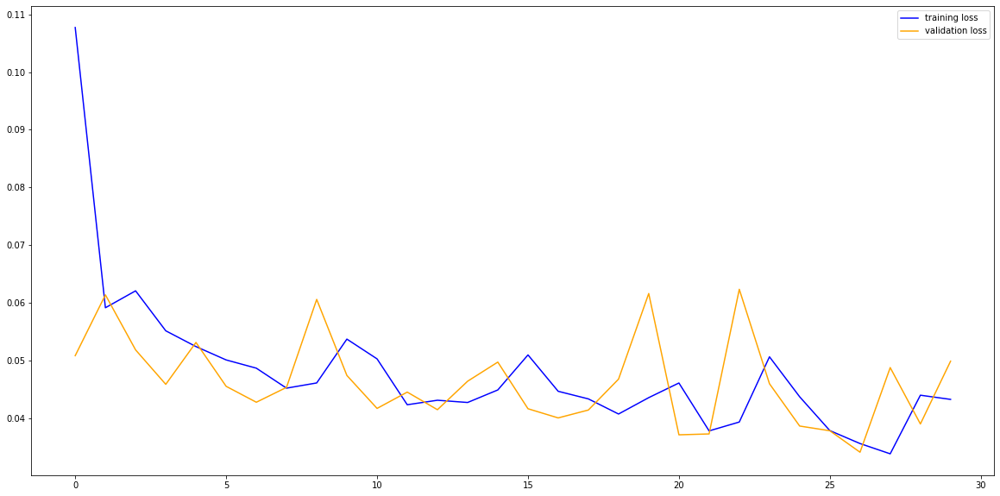

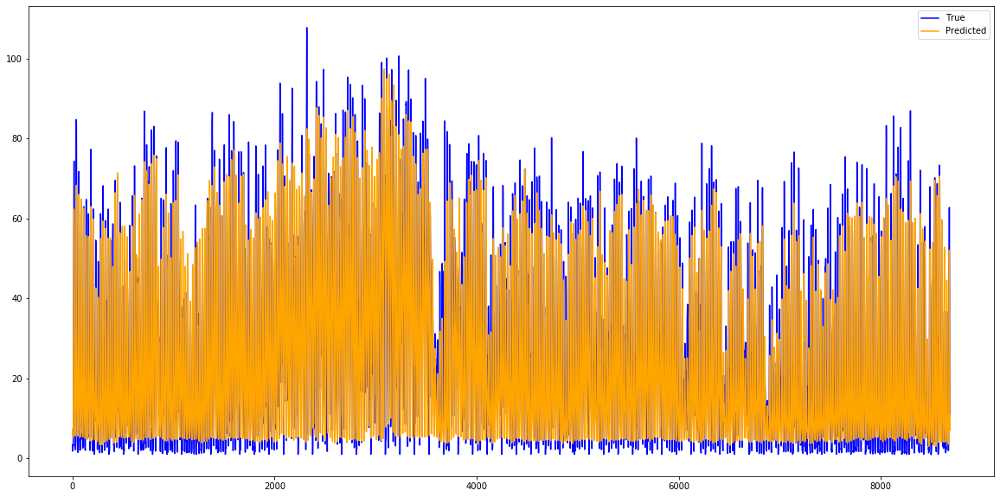

RMSE: 7.268
This took 216.02537322044373 seconds.
Train on 52608 samples, validate on 8688 samples
Epoch 1/50
52608/52608 [==============================] - 11s 215us/step - loss: 0.1108 - val_loss: 0.0554
Epoch 2/50
52608/52608 [==============================] - 6s 120us/step - loss: 0.0637 - val_loss: 0.0492
Epoch 3/50
52608/52608 [==============================] - 6s 122us/step - loss: 0.0566 - val_loss: 0.0573
Epoch 4/50
52608/52608 [==============================] - 7s 125us/step - loss: 0.0571 - val_loss: 0.0481
Epoch 5/50
52608/52608 [==============================] - 6s 122us/step - loss: 0.0528 - val_loss: 0.0496
Epoch 6/50
52608/52608 [==============================] - 6s 121us/step - loss: 0.0507 - val_loss: 0.0475
Epoch 7/50
52608/52608 [==============================] - 6s 122us/step - loss: 0.0475 - val_loss: 0.0419
Epoch 8/50
52608/52608 [==============================] - 6s 123us/step - loss: 0.0424 - val_loss: 0.0447
Epoch 9/50
52608/52608 [============================

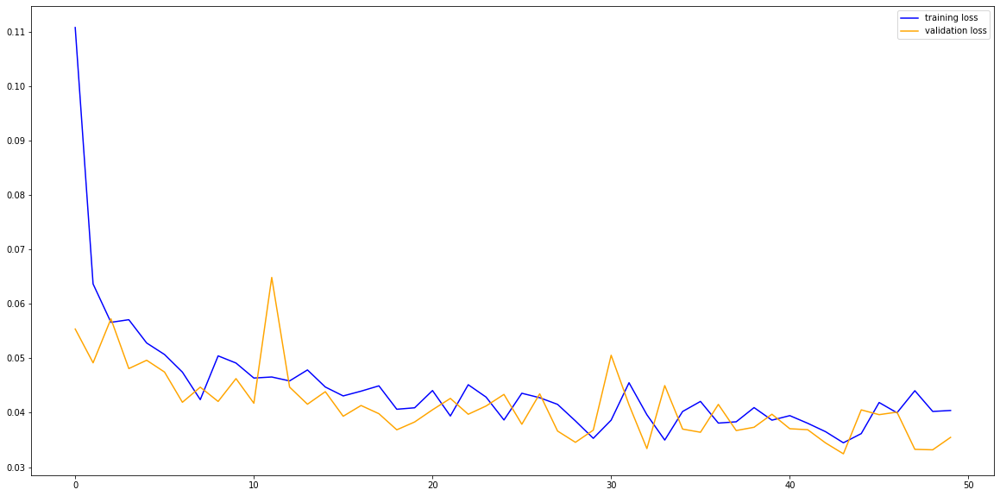

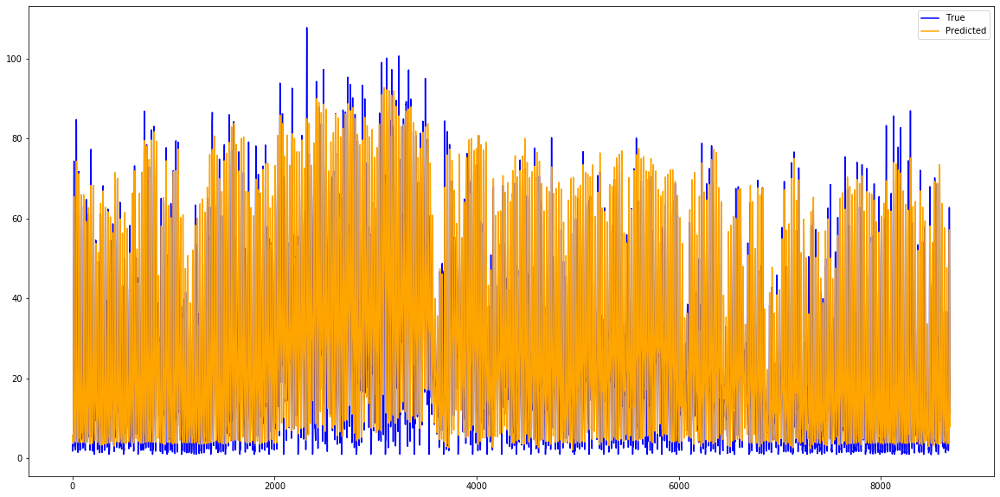

RMSE: 6.879
This took 358.80737495422363 seconds.


,feature,batch size,epochs,rmse,execution time
41,o3_st0,24,50,15.357946,613.377617
39,o3_st0,24,10,9.753796,138.016124
30,o3_st0,24,10,9.109640,455.614504
40,o3_st0,24,30,9.088846,371.319221
42,o3_st0,24,10,7.649476,87.113316
36,o3_st0,24,10,7.585962,269.890305
43,o3_st0,24,30,7.267530,216.025373
33,o3_st0,24,10,7.066653,275.874815
44,o3_st0,24,50,6.879390,358.807375
31,o3_st0,24,30,6.754430,1368.888506


In [93]:
features = ['pm10_st0','pm25_st0','o3_st0']

batches  = [24, 48, 72 , 168, 720]
epochs   = [10, 30, 50]
results  = []
   
for feature in features:
    if feature == 'pm10_st0' :
        columns = predictpm10
    elif feature == 'pm25_st0' :
         columns = predictpm25 
    elif feature == 'o3_st0' :
         columns =  predicto3 
            
    for batch in batches:
        for epoch in epochs: 
            #define datasets to predict feature        
            train_multi_lstm      = df_workspace[columns]['2012-01-01':'2018-12-31']
            test_multi_lstm       = df_workspace[columns]['2019-01-01':'2019-12-31']
            train_hours_multi_lstm      = len(train_multi_lstm)
            test_hours_multi_lstm       = len(test_multi_lstm)
            n_features = len(train_multi_lstm.columns)

            #print(train_multi_lstm.shape)
            #print(test_multi_lstm.shape)
            #print(n_features)

            [rmse, execution_time] = execute_experiment(feature,
                                                    train_multi_lstm,
                                                    test_multi_lstm, 
                                                    train_hours_multi_lstm, #total training hours
                                                    8760,          # one year in hours for validation
                                                    batch,          #lag 
                                                    epoch,         #epochs
                                                    n_features*4   #neurons
                                                   )
            #stupid error I didnt change 'lag' variable for batch size, and
            #in table all results are assigning batch size as 24
            #------------------------correcting this below
            #results.append([feature,lag,epoch, rmse, execution_time])
            results.append([feature, batch, epoch, rmse, execution_time])

df_results_lr=pd.DataFrame(results,columns=['feature','batch size','epochs','rmse','execution time'])
df_results_lr.sort_values(by=['feature', 'rmse'], ascending=[True, False] )    

In [98]:
corrected_batches  = [24, 48, 72 , 168, 720]
batches_rows = []
for i in range(0,9):
    batches_rows = np.append(batches_rows,corrected_batches)
    



array([ 24.,  48.,  72., 168., 720.,  24.,  48.,  72., 168., 720.,  24.,
        48.,  72., 168., 720.,  24.,  48.,  72., 168., 720.,  24.,  48.,
        72., 168., 720.,  24.,  48.,  72., 168., 720.,  24.,  48.,  72.,
       168., 720.,  24.,  48.,  72., 168., 720.,  24.,  48.,  72., 168.,
       720.])

In [101]:
print(len(batches_rows))

45


In [109]:
batches_rows.astype(int)


array([ 24,  48,  72, 168, 720,  24,  48,  72, 168, 720,  24,  48,  72,
       168, 720,  24,  48,  72, 168, 720,  24,  48,  72, 168, 720,  24,
        48,  72, 168, 720,  24,  48,  72, 168, 720,  24,  48,  72, 168,
       720,  24,  48,  72, 168, 720])

In [114]:
batches_rows

array([ 24.,  48.,  72., 168., 720.,  24.,  48.,  72., 168., 720.,  24.,
        48.,  72., 168., 720.,  24.,  48.,  72., 168., 720.,  24.,  48.,
        72., 168., 720.,  24.,  48.,  72., 168., 720.,  24.,  48.,  72.,
       168., 720.,  24.,  48.,  72., 168., 720.,  24.,  48.,  72., 168.,
       720.])

In [116]:
for index, row in df_results_lr.iterrows():
    df_results_lr.loc[index, "batch size"] = batches_rows[index]


df_results_lr

,feature,batch size,epochs,rmse,execution time
0,pm10_st0,24.0,10.0,12.520853,650.046462
1,pm10_st0,48.0,30.0,10.559267,1411.106543
2,pm10_st0,72.0,50.0,10.682486,1640.067056
3,pm10_st0,168.0,10.0,11.212970,186.758386
4,pm10_st0,720.0,30.0,10.059512,514.885923
5,pm10_st0,24.0,50.0,9.487667,832.948257
6,pm10_st0,48.0,10.0,11.151244,141.343573
7,pm10_st0,72.0,30.0,9.929670,406.139271
8,pm10_st0,168.0,50.0,8.874280,672.126227
9,pm10_st0,720.0,10.0,10.841110,83.638642


In [121]:
df_results_lr.to_csv (r'results_lstm_multivariate.csv', index = False, header=True)

In [30]:
len(test_multi_lstm['pm10_st0'].values)

8760

In [120]:
df_results_lr.sort_values(by=['feature', 'rmse'], ascending=[True, True] )    

,feature,batch size,epochs,rmse,execution time
34,o3_st0,720.0,30.0,5.509333,786.372317
37,o3_st0,72.0,30.0,5.616109,733.762058
38,o3_st0,168.0,50.0,5.716884,1219.871494
35,o3_st0,24.0,50.0,5.716932,1338.252495
32,o3_st0,72.0,50.0,6.580286,2307.203927
31,o3_st0,48.0,30.0,6.754430,1368.888506
44,o3_st0,720.0,50.0,6.879390,358.807375
33,o3_st0,168.0,10.0,7.066653,275.874815
43,o3_st0,168.0,30.0,7.267530,216.025373
36,o3_st0,48.0,10.0,7.585962,269.890305


array([[<matplotlib.axes._subplots.AxesSubplot object at 0x0000013D2B3A6A88>,
      dtype=object)

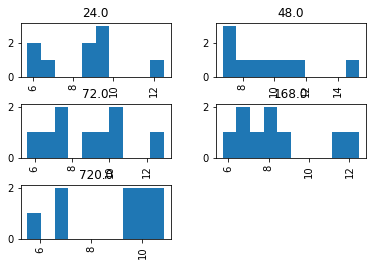

In [131]:
df_results_lr['rmse'].hist(by=df_results_lr['batch size'])

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x0000013D2BE01488>,
      dtype=object)

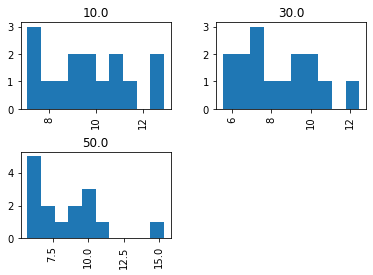

In [132]:
df_results_lr['rmse'].hist(by=df_results_lr['epochs'])

In [31]:
len(test_multi_lstm['pm10_st0'].values[72:])

8688